In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Libraries Setup

In [ ]:
!pip install visualkeras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 992.0/992.0 KB 49.7 MB/s eta 0:00:00


https://towardsdatascience.com/interpreting-image-classification-model-with-lime-1e7064a2f2e5

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 21.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=2d157360f3850413c0493dec5e0b53a15178b92ce798bc6dff5712fbf14b30be
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime


In [ ]:
'''Importing necessary libraries and modules'''

## Machine learning libraries
import tensorflow as tf
from tensorflow import keras
from keras import layers

## Supporting libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import gc
from sys import getsizeof
import datetime
import visualkeras
from lime import lime_image
from skimage.segmentation import mark_boundaries

## Confusion Matrix and Classification report libraries
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

## GradCam libraries
from keras.models import Model

# Dataset

In [ ]:
gc.enable()

In [ ]:
'''Importing files from drive'''

headpath = "/content/drive/MyDrive/Currency identification dataset"
train = np.load(os.path.join(headpath,"Dataset","Train.npy"),allow_pickle=True)
validation = np.load(os.path.join(headpath,"Dataset","Val.npy"),allow_pickle=True)
test = np.load(os.path.join(headpath,"Dataset","Test.npy"),allow_pickle=True)

label_list = ['10-New', '10-Old', '100-New', '100-Old', '20-New', '20-Old', '200', '2000', '50-New', '50-Old', '500']

In [ ]:
np.random.shuffle(train)
np.random.shuffle(validation)
np.random.shuffle(test)

In [ ]:
train_features = [i[0] for i in train]
train_classes = [i[1] for i in train]

test_features = [i[0] for i in test]
test_classes = [i[1] for i in test]

validation_features = [i[0] for i in validation]
validation_classes = [i[1] for i in validation]

del(train,test,validation)
gc.collect()

0

In [ ]:
# X1 = np.array([np.array(cv2.cvtColor(val, cv2.COLOR_RGB2GRAY)) for val in train_features])
# A1 = np.array([np.array(cv2.cvtColor(val, cv2.COLOR_RGB2GRAY)) for val in validation_features])
# E1 = np.array([np.array(cv2.cvtColor(val, cv2.COLOR_RGB2GRAY)) for val in test_features])

In [ ]:
X = np.array([np.array(val) for val in train_features])
A = np.array([np.array(val) for val in validation_features])
E = np.array([np.array(val) for val in test_features])

Y = np.array(train_classes)
B = np.array(validation_classes)
F = np.array(test_classes)

del(train_features,train_classes,test_features,test_classes,validation_features,validation_classes)
gc.collect()

0

In [ ]:
# import sys
# sys.getsizeof(X)

In [ ]:
# X = tf.convert_to_tensor(X)
# A = tf.convert_to_tensor(A)
# E = tf.convert_to_tensor(E)

# Y = tf.convert_to_tensor(Y)
# B = tf.convert_to_tensor(B)
# F = tf.convert_to_tensor(F)

In [ ]:
# del(train,test,validation)
# del(train_features,train_classes,test_features,test_classes,validation_features,validation_classes)
# gc.collect()

In [ ]:
# # '''Importing files from drive'''

# headpath = "/content/drive/MyDrive/Currency identification dataset"
# dataset = np.load(os.path.join(headpath,"all-dataset.npy"),allow_pickle=True)

# label_list = ['10-New', '10-Old', '100-New', '100-Old', '20-New', '20-Old', '200', '2000', '50-New', '50-Old', '500', 'Not-Currency']

# train , test , validation = [] , [] , []
# train_per , test_per , validation_per = 700,150,150
# classCount = 11
# for i in range(0,classCount):
#   for i in dataset[i*1000:(i*1000+train_per)]:
#     train.append(i)
# for i in range(0,classCount):
#   for i in dataset[((i*1000)+train_per):((i*1000)+train_per+test_per)]:
#     validation.append(i)
# for i in range(0,classCount):
#   for i in dataset[(i*1000+train_per+test_per):(i*1000+train_per+test_per+validation_per)]:
#     test.append(i)

# del(dataset)
# gc.collect()

# train_features = [np.array(i[0]) for i in train]
# train_classes = [np.array(i[1]) for i in train]

# test_features = [np.array(i[0]) for i in test]
# test_classes = [np.array(i[1]) for i in test]

# validation_features = [np.array(i[0]) for i in validation]
# validation_classes = [np.array(i[1]) for i in validation]

# # X = np.array([np.array(cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)) for src in train_features])
# # A = np.array([np.array(cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)) for src in validation_features])
# # E = np.array([np.array(cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)) for src in test_features])

# X = np.array([np.array(val) for val in train_features])
# A = np.array([np.array(val) for val in validation_features])
# E = np.array([np.array(val) for val in test_features])

# Y = np.array([val for val in train_classes])
# B = np.array([val for val in validation_classes])
# F = np.array([val for val in test_classes])

In [ ]:
# #Checking random images with labels
# def checkdata(features,classes,no=None):
#   no = random.randint(0,len(features)) if no == None else no
#   plt.imshow(features[no])
#   plt.title(label_list[int(classes[no])])
#   plt.show()

In [ ]:
# checkdata(E,F)

# Models

In [ ]:
# Analytical Functions

class ModelAnalysis():
  global label_list
  def __init__(self,model,dataset,history):
    self.model = model
    self.train = dataset[0]
    self.validation = dataset[1]
    self.test = dataset[2]
    self.trainingCallback = history

  def postAnalysis(self):
    def plotAccuracy():
      epochs = len(self.trainingCallback.history['accuracy'])
      plt.plot(self.trainingCallback.history['accuracy'])
      plt.plot(self.trainingCallback.history['val_accuracy'])
      plt.title('Model accuracy')
      plt.ylabel('Accuracy')
      plt.xlabel('Epochs')
      # plt.yticks(np.arange(0,1.1,0.1))
      plt.xticks(np.arange(0,epochs+1,2))
      plt.legend(['Training', 'Validation'])
      plt.show()

    def plotLoss():
      epochs = len(self.trainingCallback.history['loss'])
      plt.plot(self.trainingCallback.history['loss'])
      plt.plot(self.trainingCallback.history['val_loss'])
      plt.title('Model loss')
      plt.ylabel('Loss')
      plt.xlabel('Epochs')
      plt.xticks(np.arange(0,epochs+1,2))
      plt.legend(['Training', 'Validation'])
      plt.show()

    def testing():
      result = self.model.evaluate(self.test[0],self.test[1], batch_size=32,verbose=0)
      print(f'\nTesting: \nLoss = {result[0]} \nAccuracy = {result[1]*100:.4f}\n')
    
    def confusionMatrix():
      predictions = self.model.predict(self.test[0],verbose=0)
      predictions = np.argmax(predictions, axis=1)

      figsize = (12,12)
      ConfusionMatrixDisplay.from_predictions(self.test[1],predictions,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize=figsize)[1])
      print(classification_report(self.test[1], predictions))
    
    plotAccuracy()
    plotLoss()
    testing()
    confusionMatrix()

  def GradCamAnalysis(self,layers,eps=0.5,rnd=None):
    def GradCam(model, img_array, layer_name, eps=1e-8):
      '''
      Creates a grad-cam heatmap given a model and a layer name contained with that model
      

      Args:
        model: tf model
        img_array: (img_width x img_width) numpy array
        layer_name: str


      Returns 
        uint8 numpy array with shape (img_height, img_width)

      '''

      gradModel = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output,
          model.output])
      
      with tf.GradientTape() as tape:
        # cast the image tensor to a float-32 data type, pass the
        # image through the gradient model, and grab the loss
        # associated with the specific class index
        inputs = tf.cast(img_array, tf.float32)
        (convOutputs, predictions) = gradModel(inputs)
        loss = predictions[:, 0]
      # use automatic differentiation to compute the gradients
      grads = tape.gradient(loss, convOutputs)
      
      # compute the guided gradients
      castConvOutputs = tf.cast(convOutputs > 0, "float32")
      castGrads = tf.cast(grads > 0, "float32")
      guidedGrads = castConvOutputs * castGrads * grads
      # the convolution and guided gradients have a batch dimension
      # (which we don't need) so let's grab the volume itself and
      # discard the batch
      convOutputs = convOutputs[0]
      guidedGrads = guidedGrads[0]
      # compute the average of the gradient values, and using them
      # as weights, compute the ponderation of the filters with
      # respect to the weights
      weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
      cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)
    
      # grab the spatial dimensions of the input image and resize
      # the output class activation map to match the input image
      # dimensions
      (w, h) = (img_array.shape[2], img_array.shape[1])
      heatmap = cv2.resize(cam.numpy(), (w, h))
      # normalize the heatmap such that all values lie in the range
      # [0, 1], scale the resulting values to the range [0, 255],
      # and then convert to an unsigned 8-bit integer
      numer = heatmap - np.min(heatmap)
      denom = (heatmap.max() - heatmap.min()) + eps
      heatmap = numer / denom
      # heatmap = (heatmap * 255).astype("uint8")
      # return the resulting heatmap to the calling function
      return heatmap

    def sigmoid(x, a, b, c):
      return c / (1 + np.exp(-a * (x-b)))

    def superimpose(img_bgr, cam, thresh, emphasize=False):
      
      '''
      Superimposes a grad-cam heatmap onto an image for model interpretation and visualization.
      

      Args:
        image: (img_width x img_height x 3) numpy array
        grad-cam heatmap: (img_width x img_width) numpy array
        threshold: float
        emphasize: boolean

      Returns 
        uint8 numpy array with shape (img_height, img_width, 3)

      '''
      heatmap = cv2.resize(cam, (img_bgr.shape[1], img_bgr.shape[0]))
      if emphasize:
          heatmap = sigmoid(heatmap, 50, thresh, 1)
      heatmap = np.uint8(255 * heatmap)
      heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
      
      hif = .8
      superimposed_img = heatmap * hif + img_bgr
      superimposed_img = np.minimum(superimposed_img, 255.0).astype(np.uint8)  # scale 0 to 255  
      superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
      
      return superimposed_img_rgb

    activation_layers = layers
    rnd = rnd if rnd != None else random.randint(0,int(E.shape[0]))
    print(rnd)
    img = self.test[0][rnd]
    plt.figure(figsize=(15, 15))
    for i, layer in enumerate(activation_layers):
      grad_cam = GradCam(self.model, np.expand_dims(img, axis=0), layer)
      ax = plt.subplot(7, 5, i +1)
      plt.imshow(grad_cam)
      plt.title(layer)
      plt.axis("off")
    plt.tight_layout()

    plt.figure(figsize=(15, 15))
    for i, layer in enumerate(activation_layers):
      grad_cam = GradCam(self.model, np.expand_dims(img, axis=0), layer)
      grad_cam_emphasized = superimpose(cv2.cvtColor(img,cv2.COLOR_BGR2RGB), grad_cam, eps, emphasize=True)
      ax = plt.subplot(7, 5, i +1)
      plt.imshow(grad_cam_emphasized)
      plt.title(layer)
      plt.axis("off")
    plt.tight_layout()

  def saveModel(self,architecture):
    self.architecture = architecture
    timing = datetime.datetime.now()
    fname = f"Identification-model-{self.architecture}-{timing.strftime('%d-%b-%Y-%I-%M')}.h5"
    self.model.save(os.path.join(headpath,'Model',fname),include_optimizer=True)
  
  def visualiseModel(self,compact=False):
    if compact:
      return visualkeras.layered_view(self.model, legend=True,max_z=150)
    else:
      return visualkeras.layered_view(self.model, legend=True)

  def LimeAnalysis(self,rnd = None,samples=100):
    rnd = rnd if rnd != None else random.randint(0,int(E.shape[0]))
    print(rnd)
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(self.test[0][rnd], self.model.predict,top_labels=3, hide_color=0, num_samples=samples)
    temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
    ax1.imshow(mark_boundaries(temp_1, mask_1))
    ax2.imshow(mark_boundaries(temp_2, mask_2))
    ax1.axis('off')
    ax2.axis('off')

## Simple CNN

In [ ]:
cnn_model = keras.Sequential()
cnn_model.add(layers.Conv2D(32, (3, 3),(2,2), activation='relu', input_shape=(200, 300,3),padding="same"))
cnn_model.add(layers.BatchNormalization())
cnn_model.add(layers.MaxPooling2D((2, 2)))
cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu',padding="same"))
cnn_model.add(layers.BatchNormalization())
cnn_model.add(layers.MaxPooling2D((2, 2)))
cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu',padding="same"))
cnn_model.add(layers.BatchNormalization())
cnn_model.add(layers.MaxPooling2D((2, 2)))
cnn_model.add(layers.Conv2D(256, (3, 3), activation='relu',padding="same"))
cnn_model.add(layers.BatchNormalization())
cnn_model.add(layers.MaxPooling2D((2, 2)))
cnn_model.add(layers.Conv2D(512, (3, 3), activation='relu',padding="same"))
cnn_model.add(layers.BatchNormalization())
cnn_model.add(layers.MaxPooling2D((2, 2)))
# cnn_model.add(layers.GlobalAveragePooling2D())
cnn_model.add(layers.Flatten())
cnn_model.add(layers.Dense(1500, activation='relu'))
cnn_model.add(layers.Dropout(0.2))
cnn_model.add(layers.Dense(750, activation='relu'))
cnn_model.add(layers.Dropout(0.2))
cnn_model.add(layers.Dense(350, activation='relu'))
cnn_model.add(layers.Dropout(0.2))
cnn_model.add(layers.Dense(180, activation='relu'))
cnn_model.add(layers.Dropout(0.2))
cnn_model.add(layers.Dense(90, activation='relu'))
cnn_model.add(layers.Dropout(0.2))
cnn_model.add(layers.Dense(44, activation='relu'))
cnn_model.add(layers.Dropout(0.2))
cnn_model.add(layers.Dense(11, activation='softmax'))

In [ ]:
cnn_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 100, 150, 32)      896       
                                                                 
 batch_normalization_10 (Bat  (None, 100, 150, 32)     128       
 chNormalization)                                                
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 50, 75, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 50, 75, 64)        18496     
                                                                 
 batch_normalization_11 (Bat  (None, 50, 75, 64)       256       
 chNormalization)                                                
                                                      

In [ ]:
cnn_model.compile(loss = keras.losses.sparse_categorical_crossentropy, optimizer= 'Adam', metrics=['accuracy'])

In [ ]:
fit_model = cnn_model.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 10s 37ms/step - loss: 2.1107 - accuracy: 0.2695 - val_loss: 2.9043 - val_accuracy: 0.2248
Epoch 2/10
241/241 [==============================] - 8s 35ms/step - loss: 1.1709 - accuracy: 0.5940 - val_loss: 1.0695 - val_accuracy: 0.7236
Epoch 3/10
241/241 [==============================] - 8s 35ms/step - loss: 0.6814 - accuracy: 0.7986 - val_loss: 0.9016 - val_accuracy: 0.7600
Epoch 4/10
241/241 [==============================] - 8s 35ms/step - loss: 0.4194 - accuracy: 0.8792 - val_loss: 1.3874 - val_accuracy: 0.6855
Epoch 5/10
241/241 [==============================] - 8s 35ms/step - loss: 0.3773 - accuracy: 0.9045 - val_loss: 0.5784 - val_accuracy: 0.8667
Epoch 6/10
241/241 [==============================] - 9s 36ms/step - loss: 0.2035 - accuracy: 0.9505 - val_loss: 0.4251 - val_accuracy: 0.9012
Epoch 7/10
241/241 [==============================] - 9s 37ms/step - loss: 0.2114 - accuracy: 0.9486 - val_loss: 0.8154 - val_accuracy: 0.823

In [ ]:
CNN = ModelAnalysis(cnn_model,[(X,Y),(A,B),(E,F)],fit_model)

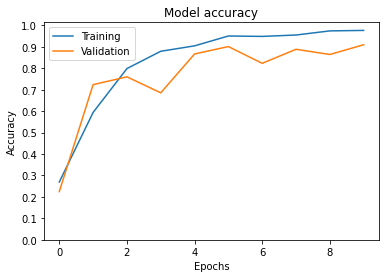

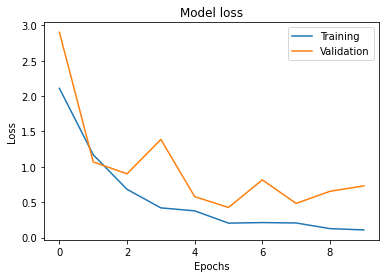


Testing: 
Loss = 0.7710598111152649 
Accuracy = 92.4242

              precision    recall  f1-score   support

           0       0.76      1.00      0.86       150
           1       0.88      0.95      0.91       150
           2       1.00      0.98      0.99       150
           3       0.89      0.77      0.82       150
           4       1.00      0.68      0.81       150
           5       0.99      0.98      0.99       150
           6       0.99      0.99      0.99       150
           7       0.99      0.99      0.99       150
           8       0.99      0.96      0.98       150
           9       0.81      0.93      0.87       150
          10       0.95      0.93      0.94       150

    accuracy                           0.92      1650
   macro avg       0.93      0.92      0.92      1650
weighted avg       0.93      0.92      0.92      1650



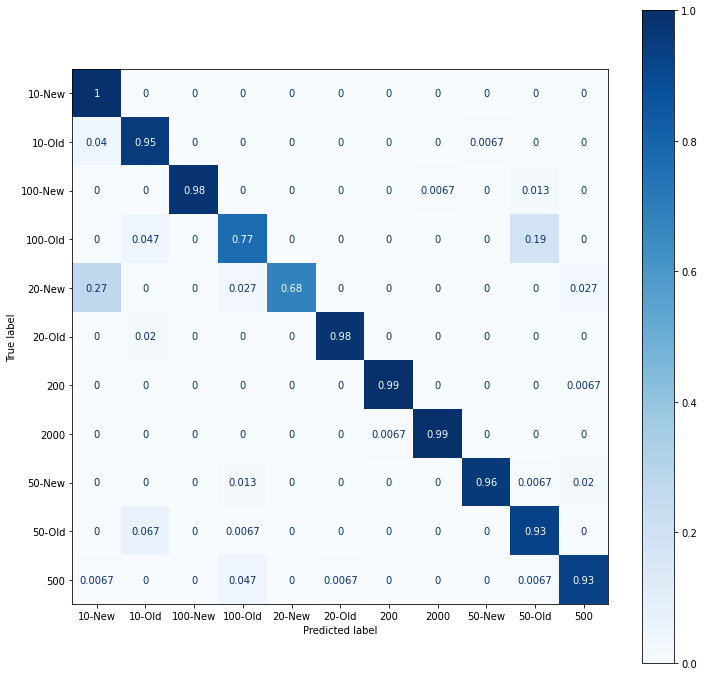

In [ ]:
CNN.postAnalysis()

25


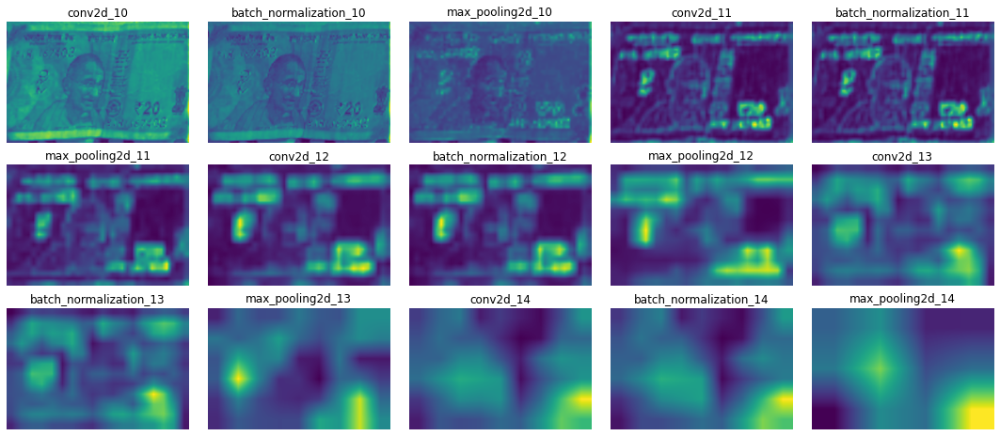

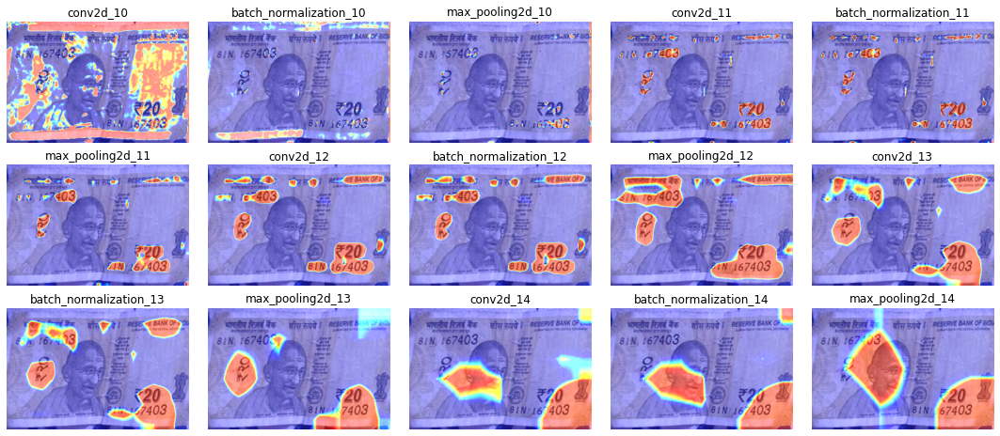

In [ ]:
actlayers = ['conv2d_10', 'batch_normalization_10', 'max_pooling2d_10', 'conv2d_11', 'batch_normalization_11', 'max_pooling2d_11', 'conv2d_12', 'batch_normalization_12', 'max_pooling2d_12', 'conv2d_13', 'batch_normalization_13', 'max_pooling2d_13', 'conv2d_14', 'batch_normalization_14', 'max_pooling2d_14']
CNN.GradCamAnalysis(actlayers,rnd=25,eps=0.5)

In [ ]:
CNN.LimeAnalysis(cnn_model)

In [ ]:
CNN.saveModel('CNN')

## Mobilenetv2

In [ ]:
mobilenetv2base = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(200,300,3),weights='imagenet',include_top=False)

In [ ]:
mobilenetv2base.trainable = False

In [ ]:
mobilenetv2base.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 100, 150, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 100, 150, 32  128         ['Conv1[0][0]']                  
                                )                                              

### Transfer learning - 1

In [ ]:
last_layer = mobilenetv2base.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

mobilenetv2 = Model(inputs=mobilenetv2base.input, outputs=downlayers)

mobilenetv2.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
mobilenetv2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 100, 150, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 100, 150, 32  128         ['Conv1[0][0]']                  
                                )                                                           

In [ ]:
mobilenethist = mobilenetv2.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=30,shuffle=True)

Epoch 1/30
241/241 [==============================] - 15s 62ms/step - loss: 0.3342 - accuracy: 0.8869 - val_loss: 0.6509 - val_accuracy: 0.8036
Epoch 2/30
241/241 [==============================] - 14s 60ms/step - loss: 0.3452 - accuracy: 0.8831 - val_loss: 0.8106 - val_accuracy: 0.8121
Epoch 3/30
241/241 [==============================] - 14s 59ms/step - loss: 0.2690 - accuracy: 0.9053 - val_loss: 0.7036 - val_accuracy: 0.8370
Epoch 4/30
241/241 [==============================] - 14s 59ms/step - loss: 0.2156 - accuracy: 0.9271 - val_loss: 0.8055 - val_accuracy: 0.8273
Epoch 5/30
241/241 [==============================] - 14s 60ms/step - loss: 0.2431 - accuracy: 0.9166 - val_loss: 0.7696 - val_accuracy: 0.8018
Epoch 6/30
241/241 [==============================] - 14s 59ms/step - loss: 0.2490 - accuracy: 0.9147 - val_loss: 0.7593 - val_accuracy: 0.8176
Epoch 7/30
241/241 [==============================] - 14s 59ms/step - loss: 0.2370 - accuracy: 0.9216 - val_loss: 0.6491 - val_accuracy:

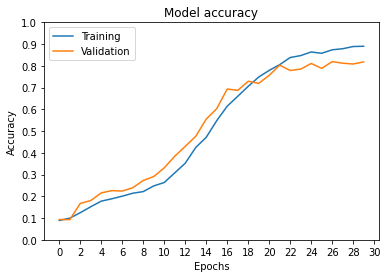

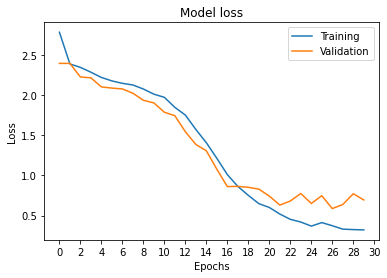


Testing: 
Loss = 0.7793208956718445 
Accuracy = 80.9697

              precision    recall  f1-score   support

           0       0.76      0.88      0.82       150
           1       0.92      0.84      0.88       150
           2       0.86      0.92      0.89       150
           3       0.86      0.54      0.66       150
           4       0.80      0.78      0.79       150
           5       0.74      0.87      0.80       150
           6       0.72      0.91      0.80       150
           7       0.99      0.79      0.88       150
           8       0.89      0.67      0.77       150
           9       0.60      0.83      0.70       150
          10       0.98      0.87      0.92       150

    accuracy                           0.81      1650
   macro avg       0.83      0.81      0.81      1650
weighted avg       0.83      0.81      0.81      1650



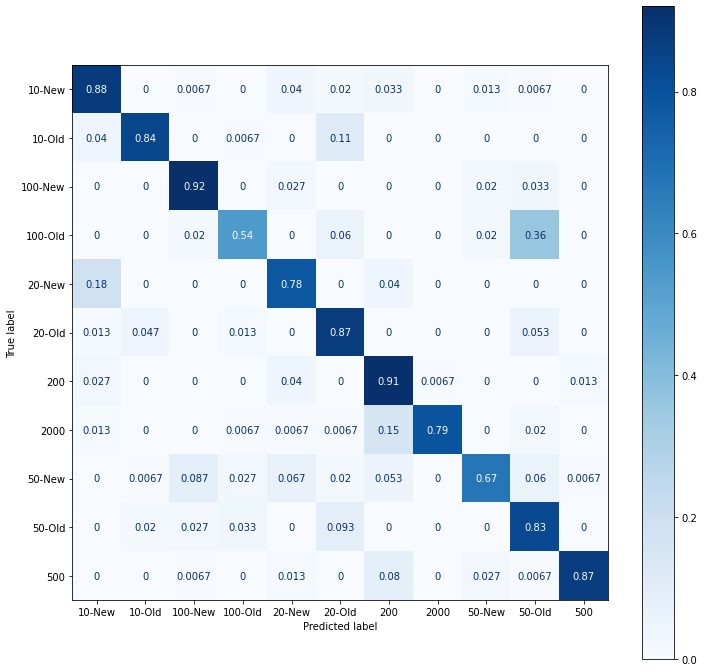

In [ ]:
MOBILENETV2 = ModelAnalysis(mobilenetv2,[(X,Y),(A,B),(E,F)],mobilenethist)
MOBILENETV2.postAnalysis()

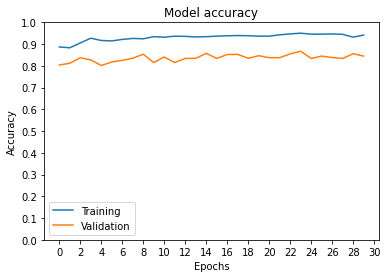

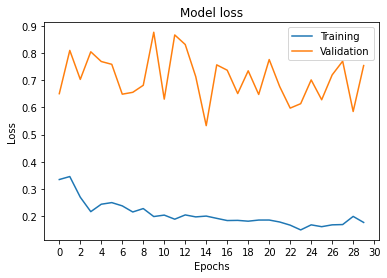


Testing: 
Loss = 0.8166565895080566 
Accuracy = 84.6667

              precision    recall  f1-score   support

           0       0.75      0.94      0.84       150
           1       0.89      0.91      0.90       150
           2       0.89      0.95      0.92       150
           3       0.80      0.70      0.74       150
           4       0.86      0.72      0.79       150
           5       0.88      0.81      0.84       150
           6       0.80      0.90      0.85       150
           7       0.87      0.89      0.88       150
           8       0.94      0.73      0.82       150
           9       0.74      0.89      0.81       150
          10       0.98      0.87      0.92       150

    accuracy                           0.85      1650
   macro avg       0.85      0.85      0.85      1650
weighted avg       0.85      0.85      0.85      1650



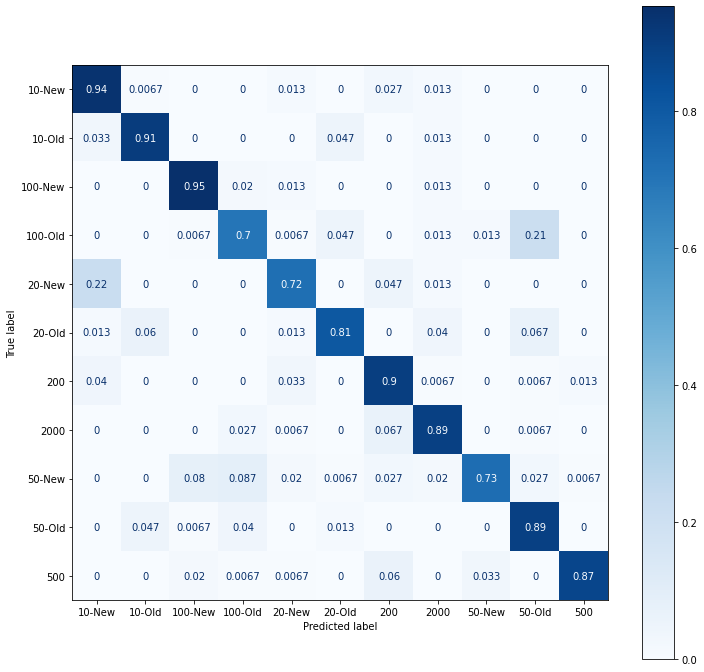

In [ ]:
MOBILENETV2 = ModelAnalysis(mobilenetv2,[(X,Y),(A,B),(E,F)],mobilenethist)
MOBILENETV2.postAnalysis()

1532


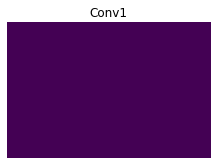

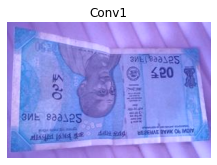

In [ ]:
actlayers = ['Conv1']
MOBILENETV2.GradCamAnalysis(actlayers)

1033


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


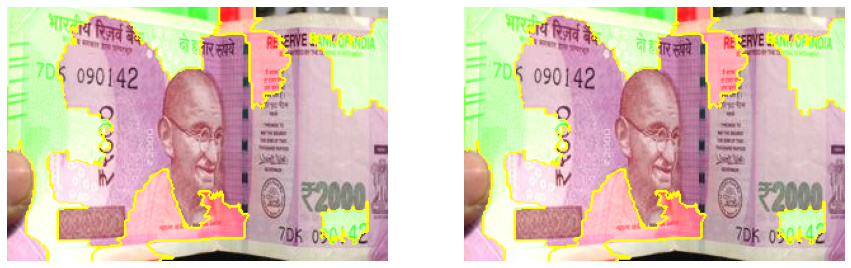

In [ ]:
MOBILENETV2.LimeAnalysis()

## ResNet50

In [ ]:
resnetbase = tf.keras.applications.ResNet50(input_shape=(200,300,3),weights='imagenet',include_top=False)
resnetbase.trainable = False

In [ ]:
resnetbase.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 206, 306, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 100, 150, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

### Transfer learning - 1

In [ ]:
last_layer = resnetbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

resnet = Model(inputs=resnetbase.input, outputs=downlayers)

resnet.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
resnet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 206, 306, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 100, 150, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 51s 188ms/step - loss: 3.0157 - accuracy: 0.2513 - val_loss: 1.6067 - val_accuracy: 0.4164
Epoch 2/10
241/241 [==============================] - 41s 170ms/step - loss: 1.6124 - accuracy: 0.4531 - val_loss: 0.8469 - val_accuracy: 0.6455
Epoch 3/10
241/241 [==============================] - 42s 174ms/step - loss: 1.0996 - accuracy: 0.6055 - val_loss: 0.4488 - val_accuracy: 0.8521
Epoch 4/10
241/241 [==============================] - 41s 172ms/step - loss: 0.7648 - accuracy: 0.7242 - val_loss: 0.2869 - val_accuracy: 0.9097
Epoch 5/10
241/241 [==============================] - 42s 173ms/step - loss: 0.5637 - accuracy: 0.7926 - val_loss: 0.2756 - val_accuracy: 0.9097
Epoch 6/10
241/241 [==============================] - 38s 157ms/step - loss: 0.4798 - accuracy: 0.8330 - val_loss: 0.2398 - val_accuracy: 0.9103
Epoch 7/10
241/241 [==============================] - 42s 173ms/step - loss: 0.4145 - accuracy: 0.8538 - val_loss: 0.1921 - val_ac

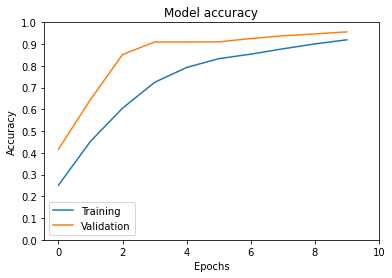

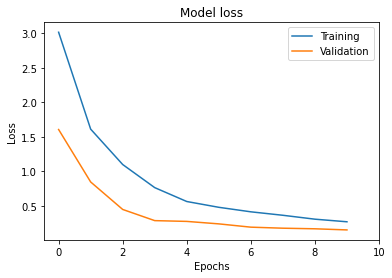


Testing: 
Loss = 0.15906186401844025 
Accuracy = 95.0909

              precision    recall  f1-score   support

           0       0.92      0.98      0.95       150
           1       0.89      0.98      0.93       150
           2       0.99      0.98      0.99       150
           3       0.91      0.92      0.91       150
           4       0.95      0.92      0.93       150
           5       0.98      0.89      0.93       150
           6       1.00      0.97      0.98       150
           7       0.97      1.00      0.98       150
           8       0.99      0.91      0.95       150
           9       0.88      0.92      0.90       150
          10       1.00      0.99      1.00       150

    accuracy                           0.95      1650
   macro avg       0.95      0.95      0.95      1650
weighted avg       0.95      0.95      0.95      1650



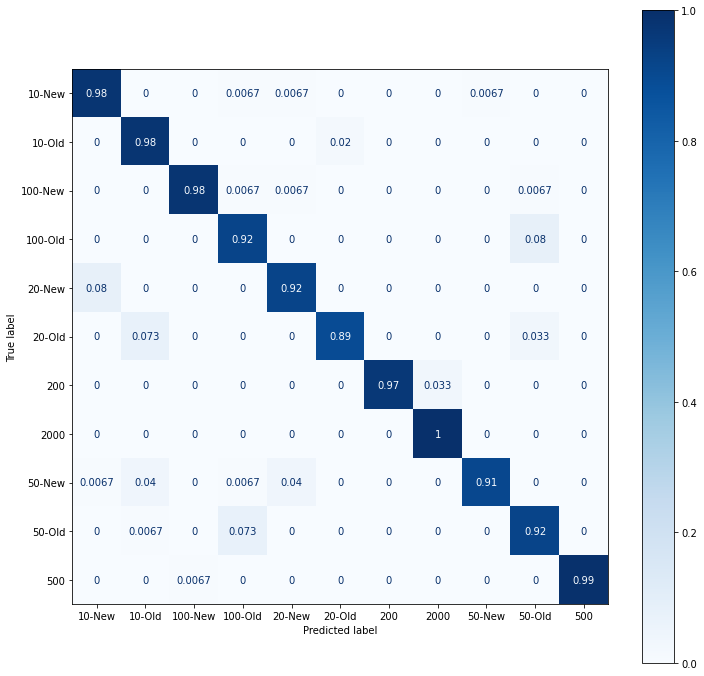

In [ ]:
RESNET50 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET50.postAnalysis()

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=30,shuffle=True)

Epoch 1/30
241/241 [==============================] - 47s 173ms/step - loss: 3.5418 - accuracy: 0.2169 - val_loss: 1.9019 - val_accuracy: 0.3418
Epoch 2/30
241/241 [==============================] - 39s 163ms/step - loss: 1.6633 - accuracy: 0.4553 - val_loss: 0.8265 - val_accuracy: 0.7776
Epoch 3/30
241/241 [==============================] - 39s 163ms/step - loss: 1.0207 - accuracy: 0.6832 - val_loss: 0.4541 - val_accuracy: 0.8952
Epoch 4/30
241/241 [==============================] - 39s 163ms/step - loss: 0.7214 - accuracy: 0.7648 - val_loss: 0.3168 - val_accuracy: 0.9255
Epoch 5/30
241/241 [==============================] - 35s 145ms/step - loss: 0.5462 - accuracy: 0.8260 - val_loss: 0.2264 - val_accuracy: 0.9382
Epoch 6/30
241/241 [==============================] - 39s 163ms/step - loss: 0.4625 - accuracy: 0.8616 - val_loss: 0.1363 - val_accuracy: 0.9558
Epoch 7/30
241/241 [==============================] - 39s 163ms/step - loss: 0.3472 - accuracy: 0.8901 - val_loss: 0.1337 - val_ac

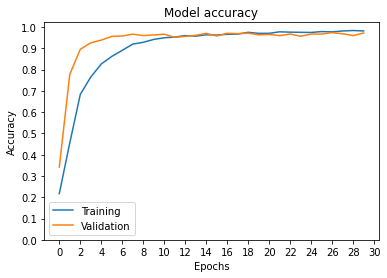

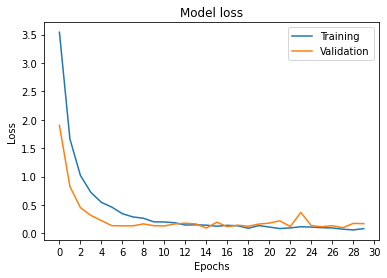


Testing: 
Loss = 0.21661509573459625 
Accuracy = 96.6667

              precision    recall  f1-score   support

           0       0.97      0.98      0.98       150
           1       0.97      0.98      0.98       150
           2       1.00      0.99      1.00       150
           3       0.97      0.81      0.88       150
           4       0.97      0.97      0.97       150
           5       0.99      0.98      0.99       150
           6       0.99      1.00      0.99       150
           7       1.00      1.00      1.00       150
           8       1.00      0.92      0.96       150
           9       0.81      0.99      0.89       150
          10       0.99      1.00      0.99       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



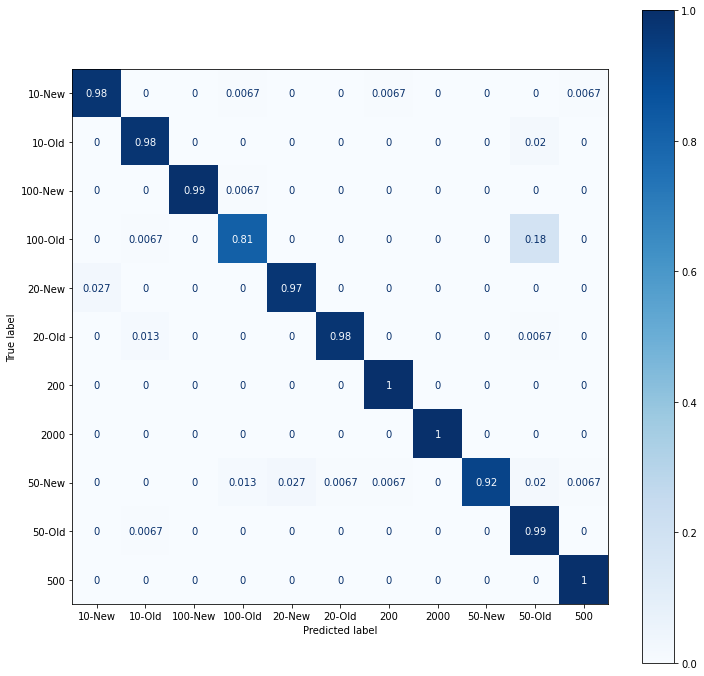

In [ ]:
RESNET50 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET50.postAnalysis()

### Transfer learning - 2

In [ ]:
last_layer = resnetbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(64,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

resnet = Model(inputs=resnetbase.input, outputs=downlayers)

resnet.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
resnet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 206, 306, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 100, 150, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 46s 173ms/step - loss: 2.6042 - accuracy: 0.2353 - val_loss: 1.3618 - val_accuracy: 0.5333
Epoch 2/10
241/241 [==============================] - 38s 157ms/step - loss: 1.3467 - accuracy: 0.5384 - val_loss: 0.5949 - val_accuracy: 0.7842
Epoch 3/10
241/241 [==============================] - 42s 176ms/step - loss: 0.9445 - accuracy: 0.6571 - val_loss: 0.4361 - val_accuracy: 0.8521
Epoch 4/10
241/241 [==============================] - 42s 175ms/step - loss: 0.7201 - accuracy: 0.7296 - val_loss: 0.3258 - val_accuracy: 0.8733
Epoch 5/10
241/241 [==============================] - 42s 176ms/step - loss: 0.6444 - accuracy: 0.7517 - val_loss: 0.3961 - val_accuracy: 0.8879
Epoch 6/10
241/241 [==============================] - 39s 160ms/step - loss: 0.5918 - accuracy: 0.7684 - val_loss: 0.2683 - val_accuracy: 0.9042
Epoch 7/10
241/241 [==============================] - 42s 175ms/step - loss: 0.5690 - accuracy: 0.7723 - val_loss: 0.2664 - val_ac

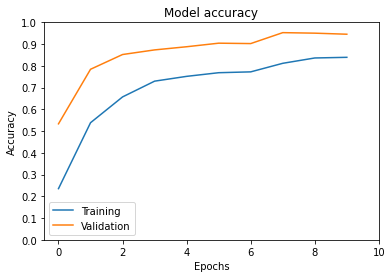

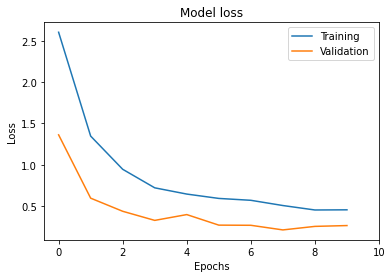


Testing: 
Loss = 0.2391488254070282 
Accuracy = 93.3333

              precision    recall  f1-score   support

           0       0.99      0.89      0.94       150
           1       0.90      0.93      0.91       150
           2       0.84      1.00      0.91       150
           3       0.89      0.87      0.88       150
           4       0.98      0.97      0.98       150
           5       0.87      0.97      0.92       150
           6       0.99      0.99      0.99       150
           7       0.99      0.98      0.99       150
           8       1.00      0.79      0.88       150
           9       0.85      0.89      0.87       150
          10       1.00      0.99      0.99       150

    accuracy                           0.93      1650
   macro avg       0.94      0.93      0.93      1650
weighted avg       0.94      0.93      0.93      1650



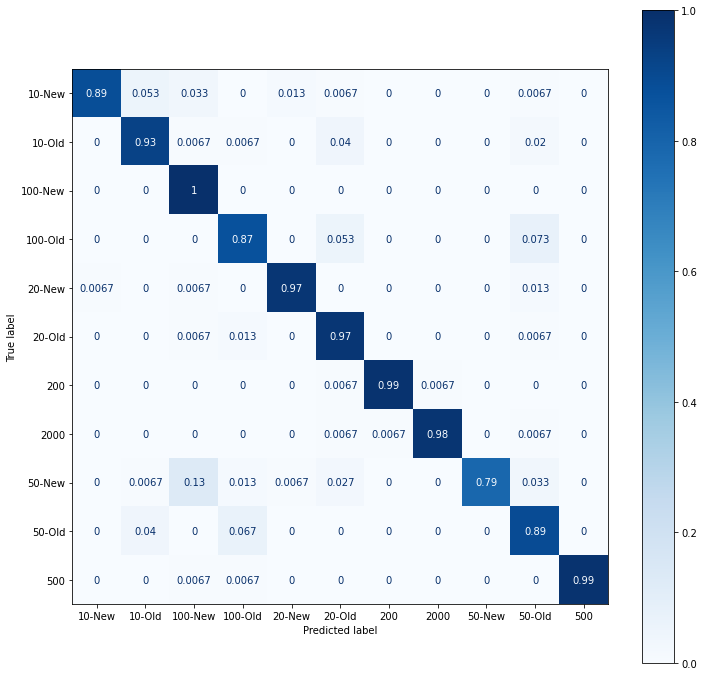

In [ ]:
RESNET50 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET50.postAnalysis()

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=30,shuffle=True)

Epoch 1/30
241/241 [==============================] - 49s 186ms/step - loss: 2.8049 - accuracy: 0.2084 - val_loss: 1.4918 - val_accuracy: 0.4679
Epoch 2/30
241/241 [==============================] - 41s 172ms/step - loss: 1.4982 - accuracy: 0.4712 - val_loss: 0.8539 - val_accuracy: 0.6861
Epoch 3/30
241/241 [==============================] - 43s 177ms/step - loss: 1.1521 - accuracy: 0.5639 - val_loss: 0.7072 - val_accuracy: 0.6994
Epoch 4/30
241/241 [==============================] - 42s 174ms/step - loss: 0.9555 - accuracy: 0.6287 - val_loss: 0.6272 - val_accuracy: 0.7758
Epoch 5/30
241/241 [==============================] - 39s 161ms/step - loss: 0.8371 - accuracy: 0.6868 - val_loss: 0.4997 - val_accuracy: 0.8376
Epoch 6/30
241/241 [==============================] - 38s 159ms/step - loss: 0.8134 - accuracy: 0.7000 - val_loss: 0.4325 - val_accuracy: 0.8630
Epoch 7/30
241/241 [==============================] - 42s 175ms/step - loss: 0.7640 - accuracy: 0.7230 - val_loss: 0.4682 - val_ac

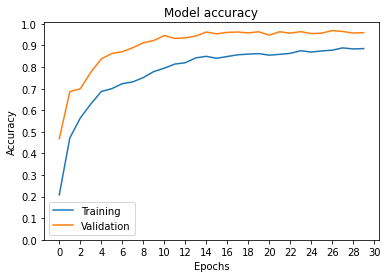

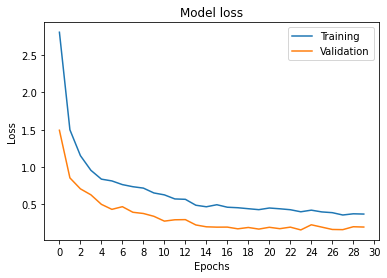


Testing: 
Loss = 0.2393842488527298 
Accuracy = 94.3636

              precision    recall  f1-score   support

           0       0.83      1.00      0.91       150
           1       0.89      0.99      0.93       150
           2       1.00      0.97      0.99       150
           3       0.88      0.89      0.88       150
           4       0.98      0.97      0.97       150
           5       0.99      0.95      0.97       150
           6       0.97      1.00      0.98       150
           7       1.00      0.98      0.99       150
           8       1.00      0.85      0.92       150
           9       0.88      0.82      0.85       150
          10       1.00      0.97      0.98       150

    accuracy                           0.94      1650
   macro avg       0.95      0.94      0.94      1650
weighted avg       0.95      0.94      0.94      1650



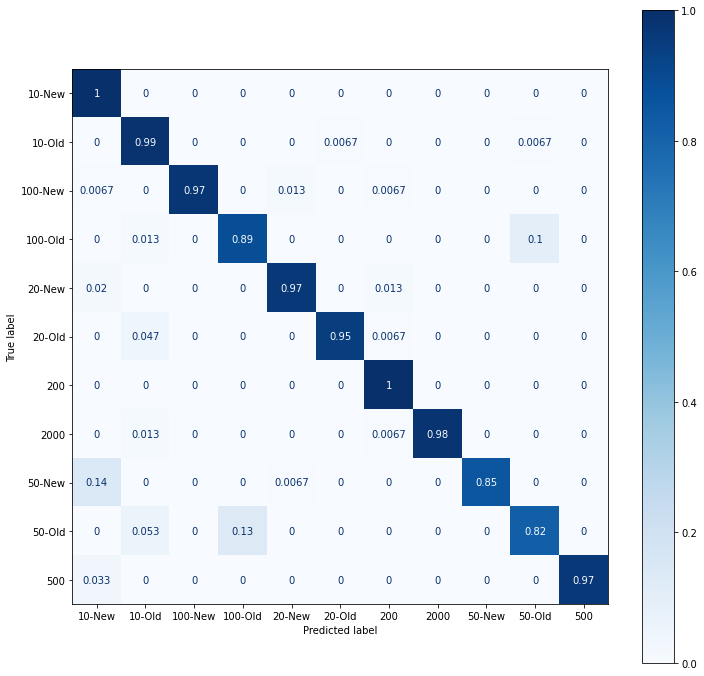

In [ ]:
RESNET50 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET50.postAnalysis()

### Transfer learning - 3

In [ ]:
last_layer = resnetbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dense(512,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

resnet = Model(inputs=resnetbase.input, outputs=downlayers)

resnet.compile(optimizer=tf.keras.optimizers.Adam(),loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
resnet.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 206, 306, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 100, 150, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 37s 154ms/step - loss: 2.2123 - accuracy: 0.1584 - val_loss: 2.1524 - val_accuracy: 0.1794
Epoch 2/10
241/241 [==============================] - 41s 170ms/step - loss: 2.1801 - accuracy: 0.1671 - val_loss: 2.1570 - val_accuracy: 0.1764
Epoch 3/10
241/241 [==============================] - 37s 153ms/step - loss: 2.1805 - accuracy: 0.1640 - val_loss: 2.1639 - val_accuracy: 0.1733
Epoch 4/10
241/241 [==============================] - 41s 170ms/step - loss: 2.1608 - accuracy: 0.1648 - val_loss: 2.1682 - val_accuracy: 0.1685
Epoch 5/10
241/241 [==============================] - 37s 153ms/step - loss: 2.1591 - accuracy: 0.1682 - val_loss: 2.2384 - val_accuracy: 0.1806
Epoch 6/10
241/241 [==============================] - 41s 171ms/step - loss: 2.1297 - accuracy: 0.1732 - val_loss: 2.3109 - val_accuracy: 0.1800
Epoch 7/10
241/241 [==============================] - 37s 153ms/step - loss: 2.1382 - accuracy: 0.1732 - val_loss: 2.1364 - val_ac

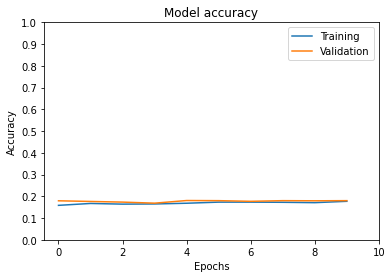

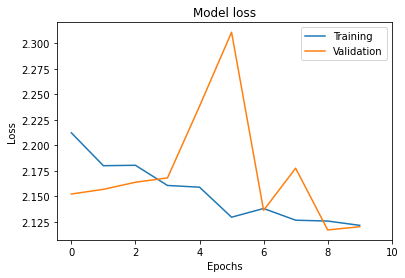


Testing: 
Loss = 2.1502749919891357 
Accuracy = 17.0909



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       150
           1       0.00      0.00      0.00       150
           2       0.00      0.00      0.00       150
           3       0.00      0.00      0.00       150
           4       0.00      0.00      0.00       150
           5       0.00      0.00      0.00       150
           6       0.10      1.00      0.18       150
           7       0.00      0.00      0.00       150
           8       1.00      0.88      0.94       150
           9       0.00      0.00      0.00       150
          10       0.00      0.00      0.00       150

    accuracy                           0.17      1650
   macro avg       0.10      0.17      0.10      1650
weighted avg       0.10      0.17      0.10      1650



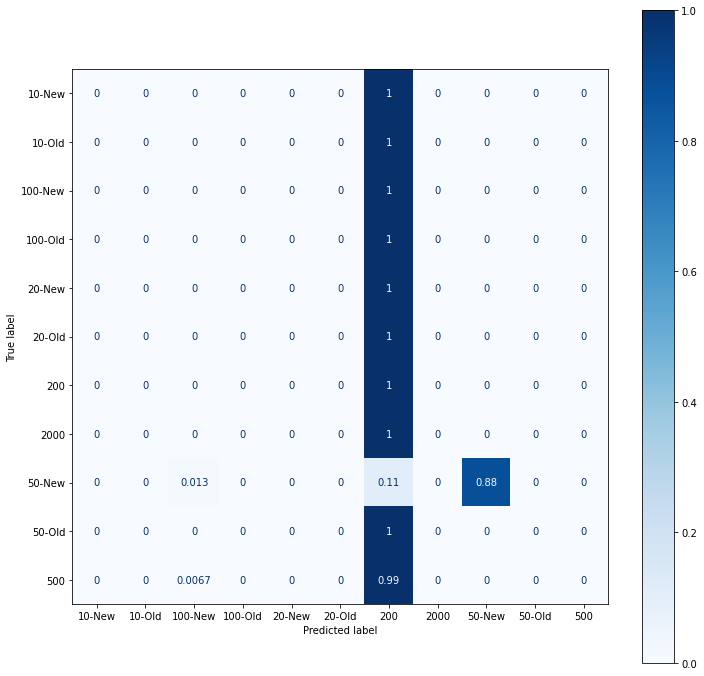

In [ ]:
RESNET50 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET50.postAnalysis()

### Transfer learning - 4

In [ ]:
last_layer = resnetbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dense(64,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(64,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

resnet = Model(inputs=resnetbase.input, outputs=downlayers)

resnet.compile(optimizer=tf.keras.optimizers.Adam(),loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 46s 169ms/step - loss: 2.4911 - accuracy: 0.1452 - val_loss: 2.1142 - val_accuracy: 0.2042
Epoch 2/10
241/241 [==============================] - 39s 161ms/step - loss: 2.1232 - accuracy: 0.2177 - val_loss: 1.9558 - val_accuracy: 0.2570
Epoch 3/10
241/241 [==============================] - 35s 143ms/step - loss: 2.0346 - accuracy: 0.2270 - val_loss: 1.9139 - val_accuracy: 0.2606
Epoch 4/10
241/241 [==============================] - 39s 161ms/step - loss: 1.9959 - accuracy: 0.2357 - val_loss: 1.8599 - val_accuracy: 0.2703
Epoch 5/10
241/241 [==============================] - 39s 161ms/step - loss: 1.9741 - accuracy: 0.2468 - val_loss: 1.7886 - val_accuracy: 0.3018
Epoch 6/10
241/241 [==============================] - 39s 161ms/step - loss: 1.9686 - accuracy: 0.2542 - val_loss: 1.7321 - val_accuracy: 0.3424
Epoch 7/10
241/241 [==============================] - 39s 161ms/step - loss: 1.9016 - accuracy: 0.2769 - val_loss: 1.6911 - val_ac

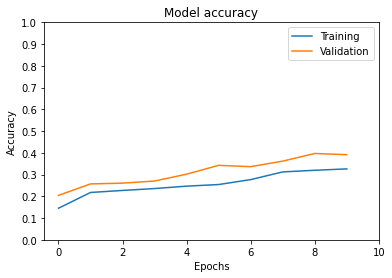

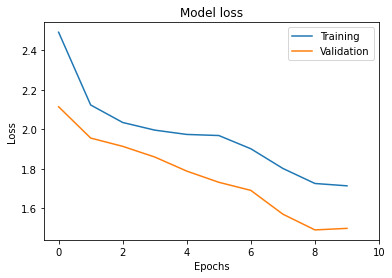


Testing: 
Loss = 1.5405430793762207 
Accuracy = 39.7576



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       150
           1       0.54      0.48      0.51       150
           2       0.17      1.00      0.29       150
           3       0.51      0.99      0.67       150
           4       0.00      0.00      0.00       150
           5       0.00      0.00      0.00       150
           6       0.00      0.00      0.00       150
           7       1.00      0.77      0.87       150
           8       0.00      0.00      0.00       150
           9       0.33      0.14      0.20       150
          10       1.00      0.99      1.00       150

    accuracy                           0.40      1650
   macro avg       0.32      0.40      0.32      1650
weighted avg       0.32      0.40      0.32      1650



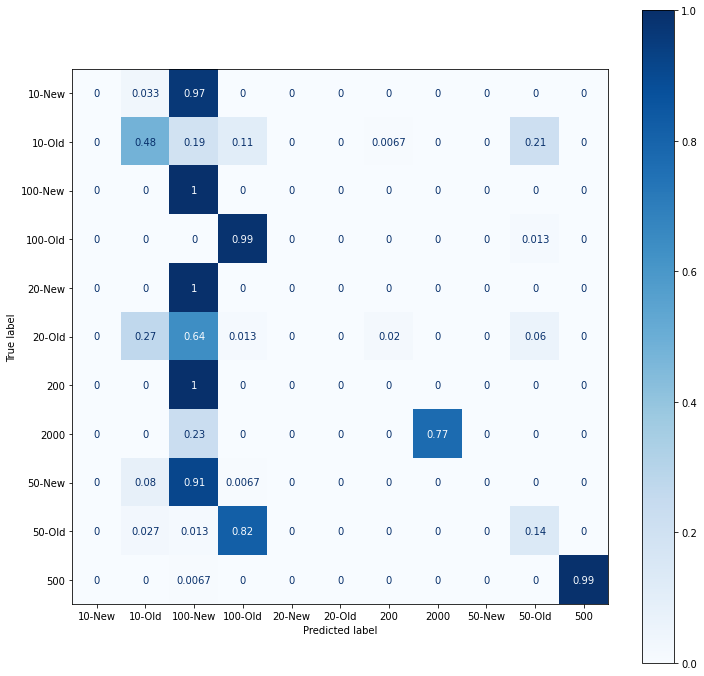

In [ ]:
RESNET50 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET50.postAnalysis()

In [ ]:
RESNET50.saveModel('ResNet')

### Transfer learning - 5

In [ ]:
last_layer = resnetbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

resnet = Model(inputs=resnetbase.input, outputs=downlayers)

resnet.compile(optimizer=tf.keras.optimizers.Adam(),loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 45s 171ms/step - loss: 3.0931 - accuracy: 0.1622 - val_loss: 2.0877 - val_accuracy: 0.2406
Epoch 2/10
241/241 [==============================] - 39s 163ms/step - loss: 2.1177 - accuracy: 0.2456 - val_loss: 1.6477 - val_accuracy: 0.3558
Epoch 3/10
241/241 [==============================] - 39s 162ms/step - loss: 1.8038 - accuracy: 0.3260 - val_loss: 1.5177 - val_accuracy: 0.4212
Epoch 4/10
241/241 [==============================] - 39s 162ms/step - loss: 1.5725 - accuracy: 0.4200 - val_loss: 1.2259 - val_accuracy: 0.5479
Epoch 5/10
241/241 [==============================] - 35s 144ms/step - loss: 1.3248 - accuracy: 0.5022 - val_loss: 1.0012 - val_accuracy: 0.6067
Epoch 6/10
241/241 [==============================] - 39s 162ms/step - loss: 1.1785 - accuracy: 0.5382 - val_loss: 0.9209 - val_accuracy: 0.6206
Epoch 7/10
241/241 [==============================] - 39s 162ms/step - loss: 1.0275 - accuracy: 0.5836 - val_loss: 0.7749 - val_ac

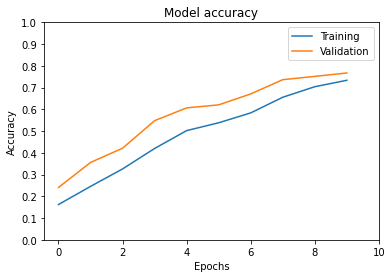

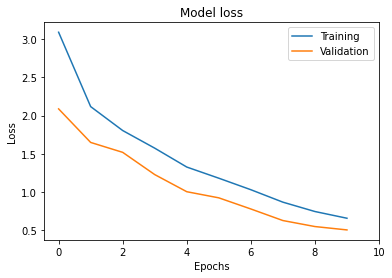


Testing: 
Loss = 0.5509374141693115 
Accuracy = 75.7576

              precision    recall  f1-score   support

           0       0.97      0.85      0.90       150
           1       0.97      0.96      0.96       150
           2       0.00      0.00      0.00       150
           3       0.93      0.83      0.87       150
           4       0.98      0.99      0.98       150
           5       0.99      0.97      0.98       150
           6       0.99      0.99      0.99       150
           7       0.00      0.00      0.00       150
           8       1.00      0.83      0.91       150
           9       0.85      0.92      0.88       150
          10       0.31      1.00      0.47       150

    accuracy                           0.76      1650
   macro avg       0.72      0.76      0.72      1650
weighted avg       0.72      0.76      0.72      1650



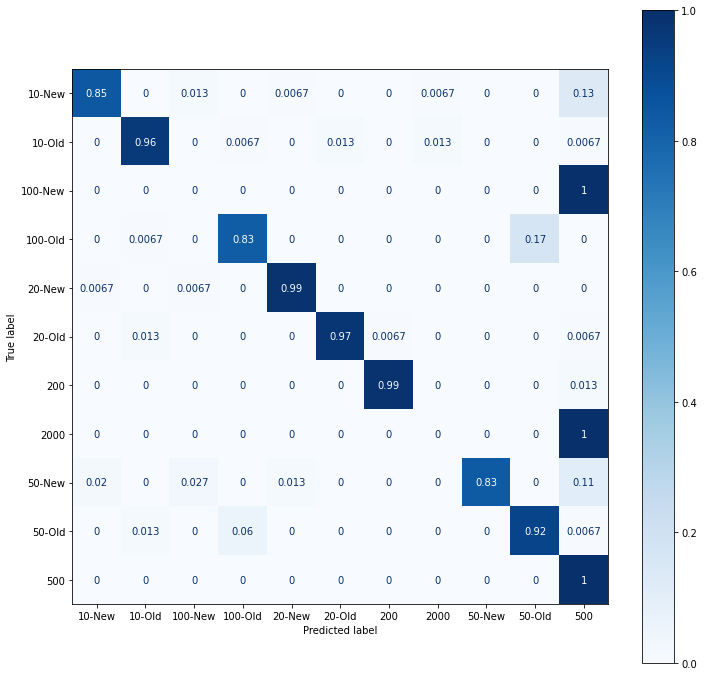

In [ ]:
RESNET50 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET50.postAnalysis()

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=30,shuffle=True)

Epoch 1/30
241/241 [==============================] - 45s 168ms/step - loss: 3.1144 - accuracy: 0.1399 - val_loss: 2.1070 - val_accuracy: 0.2618
Epoch 2/30
241/241 [==============================] - 35s 145ms/step - loss: 1.8773 - accuracy: 0.3296 - val_loss: 1.2829 - val_accuracy: 0.6170
Epoch 3/30
241/241 [==============================] - 39s 162ms/step - loss: 1.4249 - accuracy: 0.4932 - val_loss: 0.9870 - val_accuracy: 0.6479
Epoch 4/30
241/241 [==============================] - 39s 163ms/step - loss: 1.2428 - accuracy: 0.5306 - val_loss: 0.8562 - val_accuracy: 0.6564
Epoch 5/30
241/241 [==============================] - 35s 144ms/step - loss: 1.1325 - accuracy: 0.5594 - val_loss: 0.8108 - val_accuracy: 0.6442
Epoch 6/30
241/241 [==============================] - 39s 162ms/step - loss: 1.1038 - accuracy: 0.5700 - val_loss: 0.7584 - val_accuracy: 0.6448
Epoch 7/30
241/241 [==============================] - 39s 163ms/step - loss: 1.0858 - accuracy: 0.5757 - val_loss: 0.7688 - val_ac

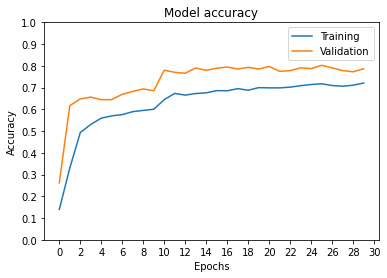

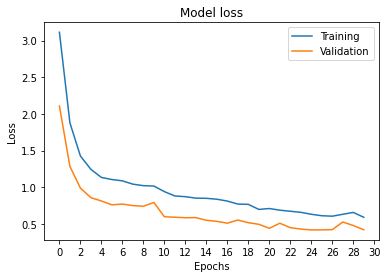


Testing: 
Loss = 0.4457203149795532 
Accuracy = 78.9697



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.89      0.99      0.94       150
           1       0.33      0.96      0.50       150
           2       0.99      1.00      1.00       150
           3       0.98      0.87      0.93       150
           4       1.00      0.98      0.99       150
           5       0.00      0.00      0.00       150
           6       0.50      0.02      0.04       150
           7       0.98      1.00      0.99       150
           8       0.90      0.88      0.89       150
           9       0.89      0.99      0.94       150
          10       1.00      0.99      1.00       150

    accuracy                           0.79      1650
   macro avg       0.77      0.79      0.75      1650
weighted avg       0.77      0.79      0.75      1650



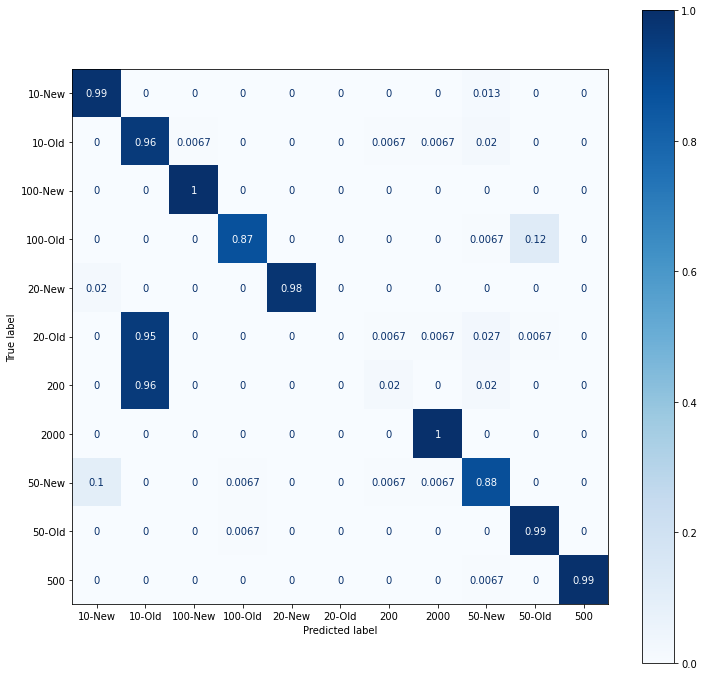

In [ ]:
RESNET50 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET50.postAnalysis()

## ResNet50V2

In [ ]:
resnetv2base = tf.keras.applications.ResNet50V2(input_shape=(200,300,3),weights='imagenet',include_top=False)
resnetv2base.trainable = False

94668760/94668760 [==============================] - 5s 0us/step


In [ ]:
resnetv2base.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 206, 306, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 100, 150, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                         

### Transfer learning - 1

In [ ]:
last_layer = resnetv2base.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

resnetv2 = Model(inputs=resnetv2base.input, outputs=downlayers)

resnetv2.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
resnetv2.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 206, 306, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 100, 150, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
history = resnetv2.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 39s 163ms/step - loss: 111.5621 - accuracy: 0.8786 - val_loss: 340.6707 - val_accuracy: 0.7552
Epoch 2/10
241/241 [==============================] - 38s 157ms/step - loss: 56.1317 - accuracy: 0.9239 - val_loss: 161.3114 - val_accuracy: 0.8479
Epoch 3/10
241/241 [==============================] - 38s 158ms/step - loss: 84.6541 - accuracy: 0.9084 - val_loss: 704.9714 - val_accuracy: 0.6533
Epoch 4/10
241/241 [==============================] - 38s 158ms/step - loss: 69.1959 - accuracy: 0.9186 - val_loss: 311.2656 - val_accuracy: 0.7806
Epoch 5/10
241/241 [==============================] - 38s 158ms/step - loss: 80.7132 - accuracy: 0.9174 - val_loss: 321.9372 - val_accuracy: 0.7836
Epoch 6/10
241/241 [==============================] - 38s 158ms/step - loss: 78.1361 - accuracy: 0.9194 - val_loss: 411.2470 - val_accuracy: 0.7515
Epoch 7/10
241/241 [==============================] - 38s 158ms/step - loss: 65.3417 - accuracy: 0.9260 - val_l

In [ ]:
RESNET50V2 = ModelAnalysis(resnetv2,[(X,Y),(A,B),(E,F)],history)

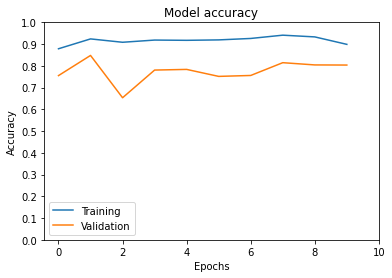

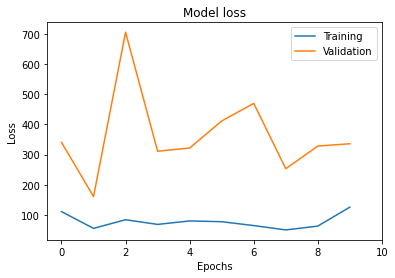


Testing: 
Loss = 319.4755554199219 
Accuracy = 79.5152

              precision    recall  f1-score   support

           0       0.58      0.99      0.73       150
           1       0.79      0.89      0.84       150
           2       0.94      0.64      0.76       150
           3       0.72      0.77      0.75       150
           4       0.90      0.81      0.85       150
           5       0.90      0.81      0.86       150
           6       0.90      0.75      0.82       150
           7       0.98      0.83      0.90       150
           8       0.61      0.75      0.67       150
           9       0.78      0.65      0.71       150
          10       0.97      0.84      0.90       150

    accuracy                           0.80      1650
   macro avg       0.83      0.80      0.80      1650
weighted avg       0.83      0.80      0.80      1650



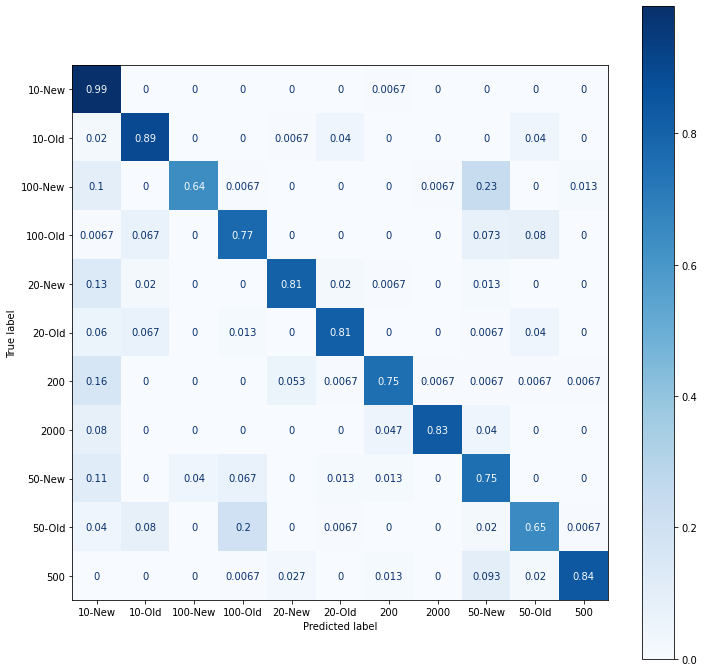

In [ ]:
RESNET50V2.postAnalysis()

## Resnet101

In [ ]:
resnetbase = tf.keras.applications.ResNet101(input_shape=(200,300,3),weights='imagenet',include_top=False)
resnetbase.trainable = False

### Transfer learning - 1

In [ ]:
last_layer = resnetbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(256,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

resnet = Model(inputs=resnetbase.input, outputs=downlayers)

resnet.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 86s 308ms/step - loss: 2.7792 - accuracy: 0.4014 - val_loss: 0.4776 - val_accuracy: 0.8497
Epoch 2/10
241/241 [==============================] - 72s 298ms/step - loss: 0.7880 - accuracy: 0.7404 - val_loss: 0.3757 - val_accuracy: 0.8721
Epoch 3/10
241/241 [==============================] - 72s 298ms/step - loss: 0.4896 - accuracy: 0.8519 - val_loss: 0.2461 - val_accuracy: 0.9145
Epoch 4/10
241/241 [==============================] - 72s 297ms/step - loss: 0.3439 - accuracy: 0.8968 - val_loss: 0.0995 - val_accuracy: 0.9715
Epoch 5/10
241/241 [==============================] - 62s 256ms/step - loss: 0.2511 - accuracy: 0.9223 - val_loss: 0.1132 - val_accuracy: 0.9673
Epoch 6/10
241/241 [==============================] - 71s 295ms/step - loss: 0.2337 - accuracy: 0.9338 - val_loss: 0.1797 - val_accuracy: 0.9545
Epoch 7/10
241/241 [==============================] - 72s 297ms/step - loss: 0.1750 - accuracy: 0.9478 - val_loss: 0.1360 - val_ac

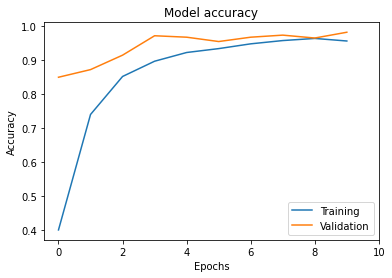

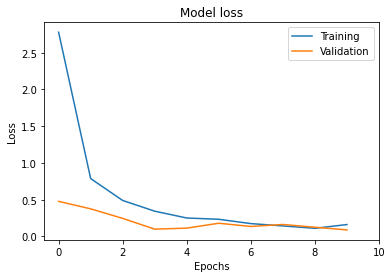


Testing: 
Loss = 0.13840675354003906 
Accuracy = 97.5152

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       150
           1       0.89      0.99      0.93       150
           2       0.97      0.98      0.98       150
           3       0.95      0.97      0.96       150
           4       1.00      1.00      1.00       150
           5       0.99      0.98      0.98       150
           6       1.00      0.99      1.00       150
           7       0.99      1.00      1.00       150
           8       0.99      0.99      0.99       150
           9       0.97      0.85      0.90       150
          10       1.00      0.99      0.99       150

    accuracy                           0.98      1650
   macro avg       0.98      0.98      0.97      1650
weighted avg       0.98      0.98      0.97      1650



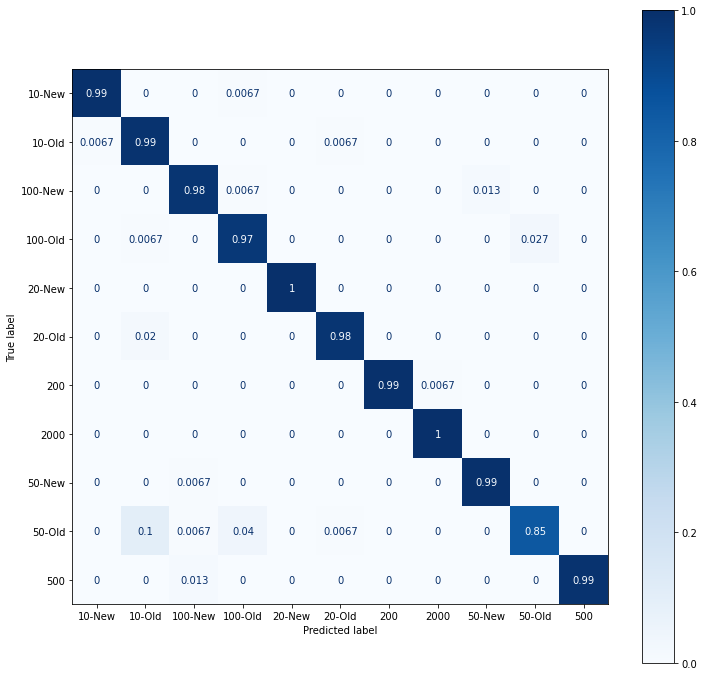

In [ ]:
RESNET101 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET101.postAnalysis()

In [ ]:
history = resnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=15,shuffle=True)

Epoch 1/15
241/241 [==============================] - 86s 310ms/step - loss: 3.0162 - accuracy: 0.3470 - val_loss: 0.7217 - val_accuracy: 0.7788
Epoch 2/15
241/241 [==============================] - 72s 299ms/step - loss: 0.9226 - accuracy: 0.7064 - val_loss: 0.3394 - val_accuracy: 0.8873
Epoch 3/15
241/241 [==============================] - 62s 259ms/step - loss: 0.4991 - accuracy: 0.8399 - val_loss: 0.1803 - val_accuracy: 0.9521
Epoch 4/15
241/241 [==============================] - 72s 297ms/step - loss: 0.3830 - accuracy: 0.8849 - val_loss: 0.1744 - val_accuracy: 0.9430
Epoch 5/15
241/241 [==============================] - 72s 300ms/step - loss: 0.2555 - accuracy: 0.9197 - val_loss: 0.1022 - val_accuracy: 0.9612
Epoch 6/15
241/241 [==============================] - 72s 300ms/step - loss: 0.2356 - accuracy: 0.9330 - val_loss: 0.1225 - val_accuracy: 0.9612
Epoch 7/15
241/241 [==============================] - 72s 300ms/step - loss: 0.2030 - accuracy: 0.9406 - val_loss: 0.1111 - val_ac

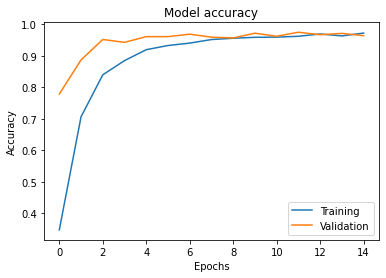

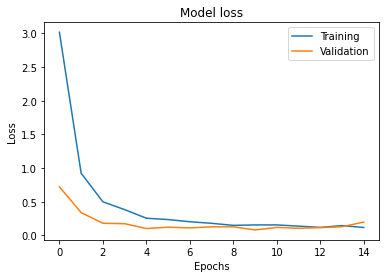


Testing: 
Loss = 0.14696986973285675 
Accuracy = 97.0303

              precision    recall  f1-score   support

           0       0.98      0.93      0.96       150
           1       0.97      0.93      0.95       150
           2       1.00      1.00      1.00       150
           3       0.97      0.89      0.93       150
           4       0.99      0.98      0.99       150
           5       0.91      1.00      0.95       150
           6       0.99      0.98      0.99       150
           7       0.98      1.00      0.99       150
           8       0.99      0.99      0.99       150
           9       0.90      0.97      0.93       150
          10       1.00      0.99      1.00       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



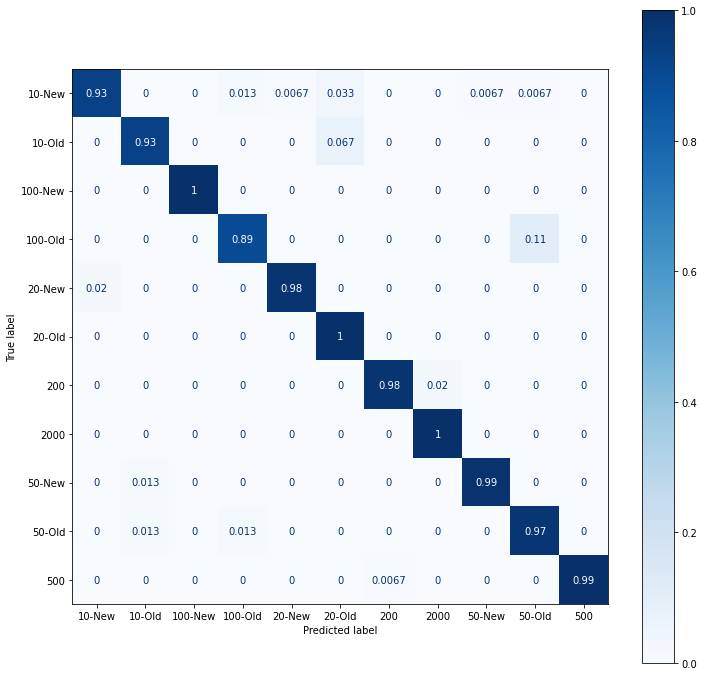

In [ ]:
RESNET101 = ModelAnalysis(resnet,[(X,Y),(A,B),(E,F)],history)
RESNET101.postAnalysis()

## VGG16

In [ ]:
vggbase = tf.keras.applications.VGG16(input_shape=(200,300,3),weights="imagenet",include_top=False)
vggbase.trainable = False

58889256/58889256 [==============================] - 2s 0us/step


In [ ]:
vggbase.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0     

In [ ]:
for layer in vggbase.layers:
  print(layer.name,layer.trainable)

input_1 False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_pool False
block5_conv1 False
block5_conv2 False
block5_conv3 False
block5_pool False


In [ ]:
for layer in vggbase.layers[:4]:
  layer.trainable = True

In [ ]:
!nvidia-smi

Sat Feb 18 07:28:50 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   76C    P0    34W /  70W |   9262MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Transfer learning - 1

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

vgg16.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

NameError: ignored

In [ ]:
vgg16.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0     

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 55s 223ms/step - loss: 3.3054 - accuracy: 0.4273 - val_loss: 1.0092 - val_accuracy: 0.7085
Epoch 2/10
241/241 [==============================] - 52s 216ms/step - loss: 1.2194 - accuracy: 0.6919 - val_loss: 0.4949 - val_accuracy: 0.8679
Epoch 3/10
241/241 [==============================] - 53s 221ms/step - loss: 0.7576 - accuracy: 0.7977 - val_loss: 0.2424 - val_accuracy: 0.9333
Epoch 4/10
241/241 [==============================] - 53s 219ms/step - loss: 0.5619 - accuracy: 0.8506 - val_loss: 0.1856 - val_accuracy: 0.9491
Epoch 5/10
241/241 [==============================] - 53s 220ms/step - loss: 0.4499 - accuracy: 0.8806 - val_loss: 0.1685 - val_accuracy: 0.9406
Epoch 6/10
241/241 [==============================] - 53s 221ms/step - loss: 0.3531 - accuracy: 0.9047 - val_loss: 0.1178 - val_accuracy: 0.9600
Epoch 7/10
241/241 [==============================] - 53s 220ms/step - loss: 0.2947 - accuracy: 0.9266 - val_loss: 0.1476 - val_ac

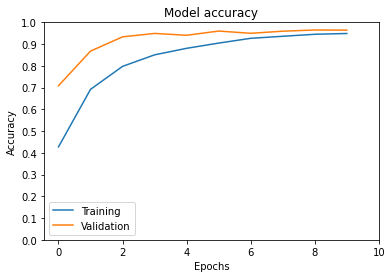

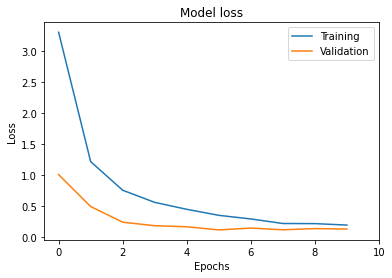


Testing: 
Loss = 0.11426648497581482 
Accuracy = 96.5455

              precision    recall  f1-score   support

           0       1.00      0.87      0.93       150
           1       0.91      0.99      0.95       150
           2       0.98      0.97      0.98       150
           3       0.97      0.97      0.97       150
           4       0.92      0.97      0.94       150
           5       0.95      0.98      0.96       150
           6       0.99      0.99      0.99       150
           7       0.99      0.99      0.99       150
           8       0.97      0.96      0.96       150
           9       0.97      0.93      0.95       150
          10       1.00      0.99      1.00       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



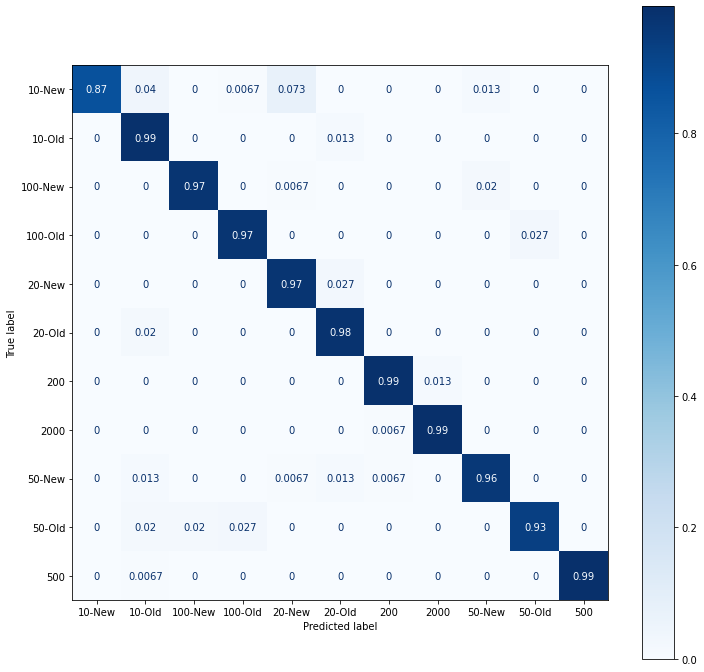

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=30,shuffle=True)

Epoch 1/30
241/241 [==============================] - 55s 218ms/step - loss: 3.2008 - accuracy: 0.3153 - val_loss: 1.2036 - val_accuracy: 0.6091
Epoch 2/30
241/241 [==============================] - 51s 212ms/step - loss: 1.5684 - accuracy: 0.5070 - val_loss: 0.8573 - val_accuracy: 0.6921
Epoch 3/30
241/241 [==============================] - 51s 213ms/step - loss: 1.2077 - accuracy: 0.6078 - val_loss: 0.7150 - val_accuracy: 0.7436
Epoch 4/30
241/241 [==============================] - 52s 218ms/step - loss: 0.9775 - accuracy: 0.6779 - val_loss: 0.5660 - val_accuracy: 0.8085
Epoch 5/30
241/241 [==============================] - 52s 218ms/step - loss: 0.8317 - accuracy: 0.7423 - val_loss: 0.4469 - val_accuracy: 0.8364
Epoch 6/30
241/241 [==============================] - 51s 213ms/step - loss: 0.6931 - accuracy: 0.7939 - val_loss: 0.3377 - val_accuracy: 0.9139
Epoch 7/30
241/241 [==============================] - 51s 213ms/step - loss: 0.6174 - accuracy: 0.8331 - val_loss: 0.2840 - val_ac

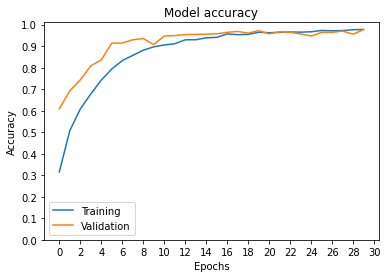

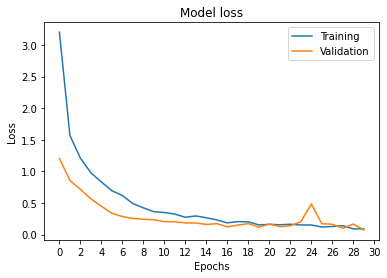


Testing: 
Loss = 0.08891689777374268 
Accuracy = 97.2727

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       150
           1       0.99      0.98      0.98       150
           2       1.00      0.99      0.99       150
           3       0.92      0.97      0.94       150
           4       0.99      0.94      0.97       150
           5       0.90      0.99      0.94       150
           6       0.97      1.00      0.99       150
           7       1.00      0.99      0.99       150
           8       0.99      0.97      0.98       150
           9       0.96      0.89      0.93       150
          10       1.00      1.00      1.00       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



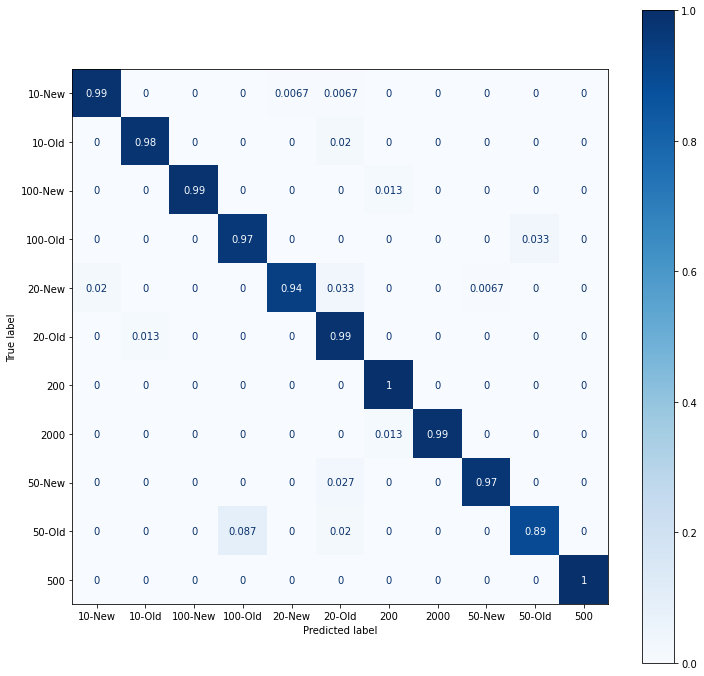

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=30,shuffle=True)

Epoch 1/30
241/241 [==============================] - 63s 212ms/step - loss: 3.4065 - accuracy: 0.3713 - val_loss: 0.7414 - val_accuracy: 0.7848
Epoch 2/30
241/241 [==============================] - 49s 202ms/step - loss: 1.1286 - accuracy: 0.6768 - val_loss: 0.3455 - val_accuracy: 0.8921
Epoch 3/30
241/241 [==============================] - 47s 195ms/step - loss: 0.7372 - accuracy: 0.7845 - val_loss: 0.3014 - val_accuracy: 0.9103
Epoch 4/30
241/241 [==============================] - 49s 203ms/step - loss: 0.5865 - accuracy: 0.8405 - val_loss: 0.2182 - val_accuracy: 0.9315
Epoch 5/30
241/241 [==============================] - 49s 203ms/step - loss: 0.4066 - accuracy: 0.8794 - val_loss: 0.1918 - val_accuracy: 0.9521
Epoch 6/30
241/241 [==============================] - 49s 203ms/step - loss: 0.3684 - accuracy: 0.8979 - val_loss: 0.2039 - val_accuracy: 0.9267
Epoch 7/30
241/241 [==============================] - 49s 203ms/step - loss: 0.3136 - accuracy: 0.9149 - val_loss: 0.1746 - val_ac

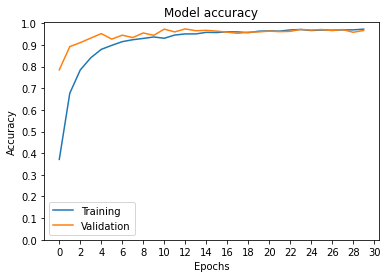

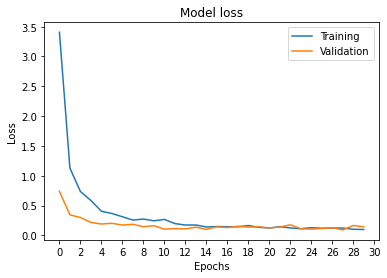


Testing: 
Loss = 0.12973657250404358 
Accuracy = 96.3636

              precision    recall  f1-score   support

           0       0.90      0.99      0.94       150
           1       1.00      0.96      0.98       150
           2       1.00      0.99      0.99       150
           3       0.97      0.93      0.95       150
           4       0.99      0.92      0.96       150
           5       0.89      1.00      0.94       150
           6       0.93      1.00      0.96       150
           7       1.00      0.93      0.96       150
           8       1.00      0.93      0.96       150
           9       0.95      0.97      0.96       150
          10       0.99      1.00      1.00       150

    accuracy                           0.96      1650
   macro avg       0.97      0.96      0.96      1650
weighted avg       0.97      0.96      0.96      1650



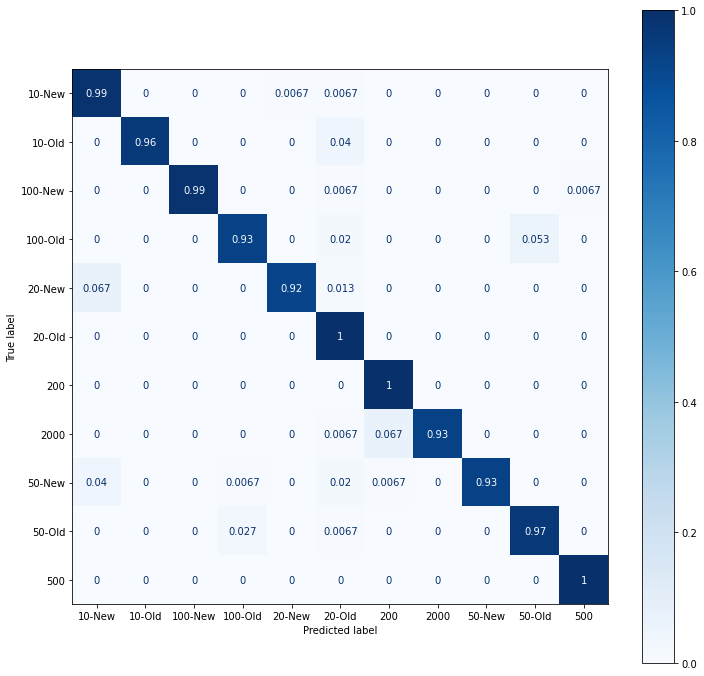

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
# VGG16.saveModel("VGG16-Final-20Feb_model")

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=50,shuffle=True)

Epoch 1/50
241/241 [==============================] - 61s 205ms/step - loss: 3.0704 - accuracy: 0.1862 - val_loss: 1.8881 - val_accuracy: 0.3079
Epoch 2/50
241/241 [==============================] - 48s 199ms/step - loss: 1.9804 - accuracy: 0.2939 - val_loss: 1.5342 - val_accuracy: 0.3958
Epoch 3/50
241/241 [==============================] - 48s 198ms/step - loss: 1.6529 - accuracy: 0.4048 - val_loss: 1.1873 - val_accuracy: 0.5721
Epoch 4/50
241/241 [==============================] - 48s 198ms/step - loss: 1.3903 - accuracy: 0.5316 - val_loss: 0.7595 - val_accuracy: 0.7212
Epoch 5/50
241/241 [==============================] - 48s 199ms/step - loss: 1.0505 - accuracy: 0.6231 - val_loss: 0.4603 - val_accuracy: 0.7788
Epoch 6/50
241/241 [==============================] - 48s 198ms/step - loss: 0.8086 - accuracy: 0.6773 - val_loss: 0.4350 - val_accuracy: 0.7988
Epoch 7/50
241/241 [==============================] - 48s 198ms/step - loss: 0.7111 - accuracy: 0.7056 - val_loss: 0.4150 - val_ac

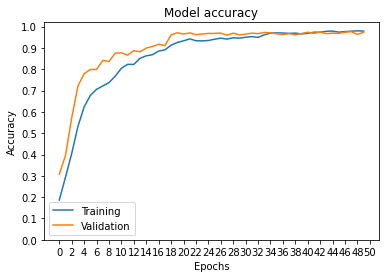

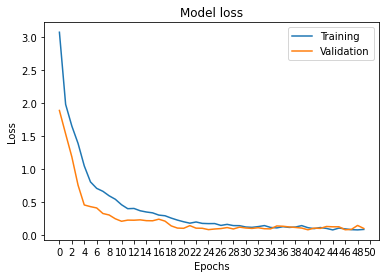


Testing: 
Loss = 0.1938108503818512 
Accuracy = 97.2121

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       150
           1       0.94      0.97      0.95       150
           2       0.99      0.98      0.99       150
           3       0.93      0.97      0.95       150
           4       0.97      0.97      0.97       150
           5       0.99      0.95      0.97       150
           6       0.99      0.99      0.99       150
           7       1.00      0.99      1.00       150
           8       0.97      1.00      0.98       150
           9       0.95      0.88      0.91       150
          10       1.00      1.00      1.00       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



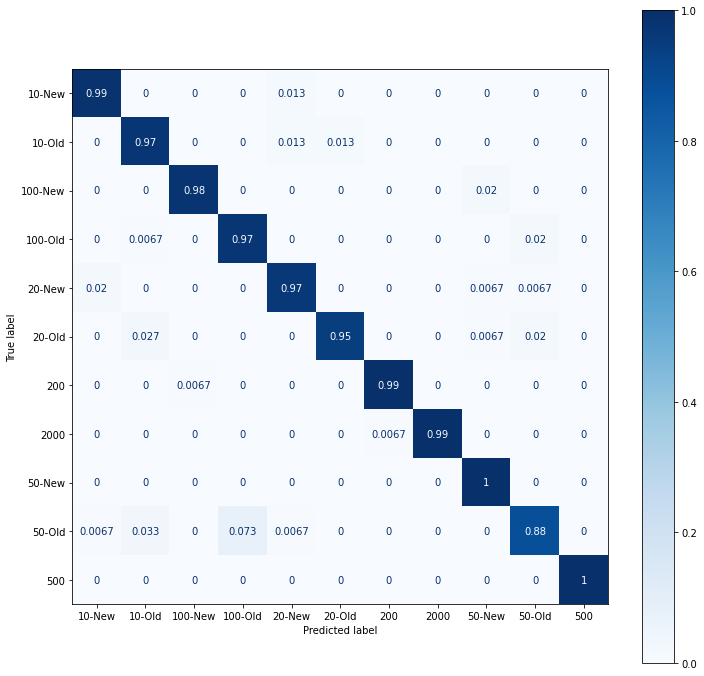

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=50,shuffle=True)

Epoch 1/50
241/241 [==============================] - 56s 225ms/step - loss: 3.0716 - accuracy: 0.2469 - val_loss: 1.7242 - val_accuracy: 0.3715
Epoch 2/50
241/241 [==============================] - 52s 217ms/step - loss: 1.8561 - accuracy: 0.3658 - val_loss: 1.2302 - val_accuracy: 0.5594
Epoch 3/50
241/241 [==============================] - 52s 218ms/step - loss: 1.4759 - accuracy: 0.4738 - val_loss: 0.9632 - val_accuracy: 0.6230
Epoch 4/50
241/241 [==============================] - 51s 214ms/step - loss: 1.1623 - accuracy: 0.5874 - val_loss: 0.6106 - val_accuracy: 0.7691
Epoch 5/50
241/241 [==============================] - 51s 213ms/step - loss: 0.9230 - accuracy: 0.6910 - val_loss: 0.4053 - val_accuracy: 0.8709
Epoch 6/50
241/241 [==============================] - 52s 218ms/step - loss: 0.6752 - accuracy: 0.7762 - val_loss: 0.1878 - val_accuracy: 0.9479
Epoch 7/50
241/241 [==============================] - 52s 218ms/step - loss: 0.5604 - accuracy: 0.8229 - val_loss: 0.2092 - val_ac

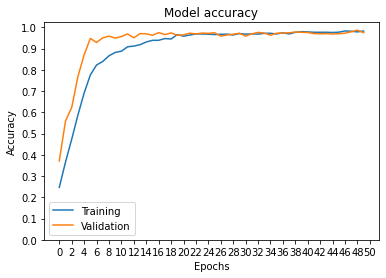

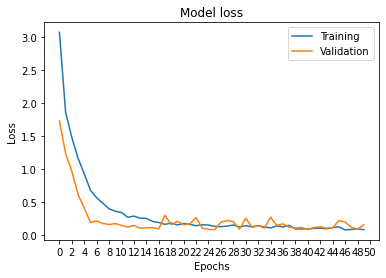


Testing: 
Loss = 0.2168741375207901 
Accuracy = 96.7879

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       150
           1       0.95      0.98      0.96       150
           2       0.99      0.99      0.99       150
           3       0.92      0.93      0.93       150
           4       0.91      0.99      0.95       150
           5       0.97      0.95      0.96       150
           6       0.98      1.00      0.99       150
           7       1.00      0.97      0.98       150
           8       0.99      0.97      0.98       150
           9       0.96      0.89      0.92       150
          10       1.00      1.00      1.00       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



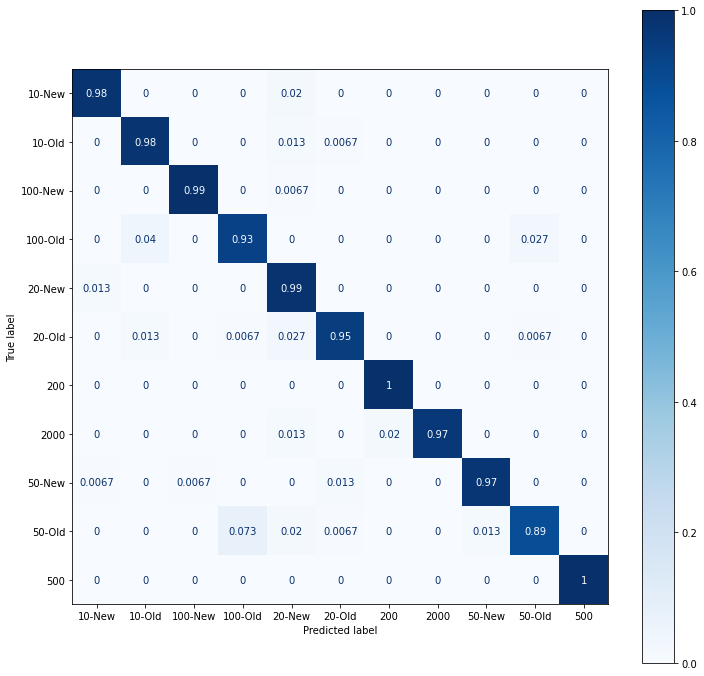

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=30,shuffle=True) #50 old resolved

Epoch 1/30
241/241 [==============================] - 77s 275ms/step - loss: 3.2122 - accuracy: 0.1643 - val_loss: 1.9489 - val_accuracy: 0.2812
Epoch 2/30
241/241 [==============================] - 53s 220ms/step - loss: 1.9561 - accuracy: 0.3040 - val_loss: 1.4968 - val_accuracy: 0.3994
Epoch 3/30
241/241 [==============================] - 53s 219ms/step - loss: 1.6068 - accuracy: 0.4222 - val_loss: 1.2142 - val_accuracy: 0.5364
Epoch 4/30
241/241 [==============================] - 53s 221ms/step - loss: 1.3781 - accuracy: 0.5142 - val_loss: 1.0797 - val_accuracy: 0.6394
Epoch 5/30
241/241 [==============================] - 52s 215ms/step - loss: 1.1363 - accuracy: 0.6210 - val_loss: 0.7688 - val_accuracy: 0.7570
Epoch 6/30
241/241 [==============================] - 53s 219ms/step - loss: 1.0201 - accuracy: 0.6652 - val_loss: 0.7186 - val_accuracy: 0.8194
Epoch 7/30
241/241 [==============================] - 53s 220ms/step - loss: 0.9044 - accuracy: 0.7308 - val_loss: 0.5284 - val_ac

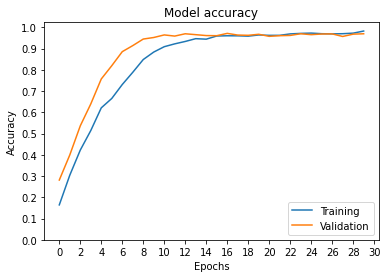

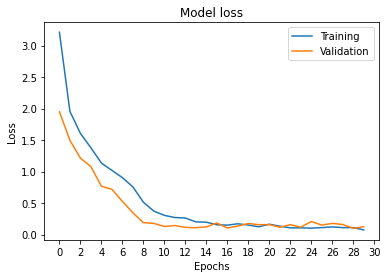


Testing: 
Loss = 0.16731372475624084 
Accuracy = 96.8485

              precision    recall  f1-score   support

           0       0.94      1.00      0.97       150
           1       0.94      0.97      0.95       150
           2       0.97      0.99      0.98       150
           3       0.93      0.99      0.95       150
           4       0.97      0.97      0.97       150
           5       0.94      0.96      0.95       150
           6       1.00      0.99      0.99       150
           7       0.99      0.97      0.98       150
           8       0.99      0.93      0.96       150
           9       0.99      0.89      0.93       150
          10       1.00      1.00      1.00       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



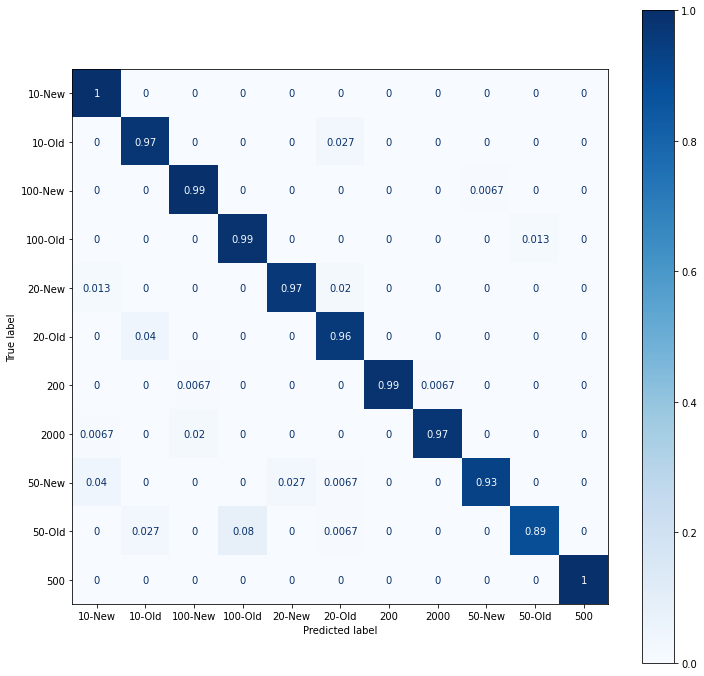

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

### Transfer learning - 2

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(88,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(22,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

vgg16.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=30,shuffle=True)

Epoch 1/30
241/241 [==============================] - 52s 207ms/step - loss: 3.5115 - accuracy: 0.1332 - val_loss: 2.1917 - val_accuracy: 0.1776
Epoch 2/30
241/241 [==============================] - 49s 205ms/step - loss: 2.4280 - accuracy: 0.1216 - val_loss: 2.2882 - val_accuracy: 0.1376
Epoch 3/30
241/241 [==============================] - 50s 209ms/step - loss: 2.2929 - accuracy: 0.1603 - val_loss: 2.0333 - val_accuracy: 0.2188
Epoch 4/30
241/241 [==============================] - 50s 207ms/step - loss: 2.2272 - accuracy: 0.1677 - val_loss: 2.0501 - val_accuracy: 0.2097
Epoch 5/30
241/241 [==============================] - 50s 208ms/step - loss: 2.1404 - accuracy: 0.1910 - val_loss: 2.0153 - val_accuracy: 0.2121
Epoch 6/30
241/241 [==============================] - 50s 207ms/step - loss: 2.0851 - accuracy: 0.2005 - val_loss: 1.8853 - val_accuracy: 0.2461
Epoch 7/30
241/241 [==============================] - 50s 207ms/step - loss: 2.0157 - accuracy: 0.2239 - val_loss: 1.8607 - val_ac

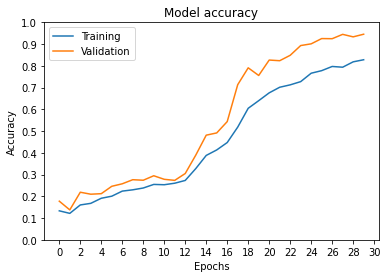

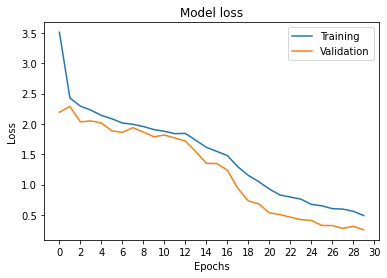


Testing: 
Loss = 0.27032536268234253 
Accuracy = 94.0606

              precision    recall  f1-score   support

           0       0.90      0.99      0.95       150
           1       0.94      0.98      0.96       150
           2       0.92      0.98      0.95       150
           3       0.94      0.83      0.88       150
           4       0.97      0.89      0.93       150
           5       0.95      0.94      0.94       150
           6       0.93      1.00      0.96       150
           7       1.00      0.97      0.98       150
           8       1.00      0.92      0.96       150
           9       0.81      0.84      0.83       150
          10       1.00      1.00      1.00       150

    accuracy                           0.94      1650
   macro avg       0.94      0.94      0.94      1650
weighted avg       0.94      0.94      0.94      1650



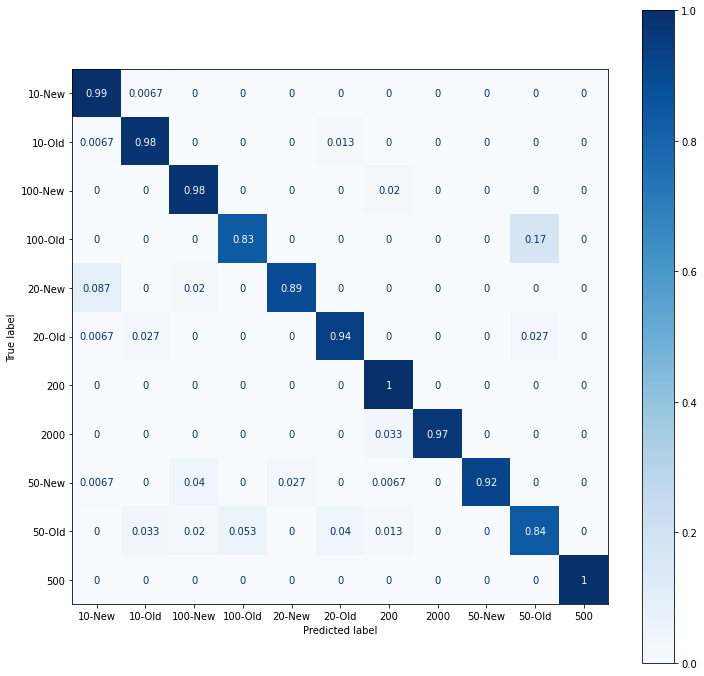

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

### Transfer learning - 3

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(512,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

vgg16.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg16.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0   

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=20,shuffle=True)

Epoch 1/20
241/241 [==============================] - 54s 215ms/step - loss: 3.3650 - accuracy: 0.6192 - val_loss: 0.2999 - val_accuracy: 0.8970
Epoch 2/20
241/241 [==============================] - 48s 200ms/step - loss: 0.5679 - accuracy: 0.8557 - val_loss: 0.1630 - val_accuracy: 0.9479
Epoch 3/20
241/241 [==============================] - 51s 210ms/step - loss: 0.3780 - accuracy: 0.9116 - val_loss: 0.1462 - val_accuracy: 0.9364
Epoch 4/20
241/241 [==============================] - 50s 209ms/step - loss: 0.2608 - accuracy: 0.9317 - val_loss: 0.1438 - val_accuracy: 0.9558
Epoch 5/20
241/241 [==============================] - 50s 209ms/step - loss: 0.2274 - accuracy: 0.9532 - val_loss: 0.2093 - val_accuracy: 0.9521
Epoch 6/20
241/241 [==============================] - 49s 202ms/step - loss: 0.1438 - accuracy: 0.9692 - val_loss: 0.1333 - val_accuracy: 0.9661
Epoch 7/20
241/241 [==============================] - 50s 209ms/step - loss: 0.1344 - accuracy: 0.9690 - val_loss: 0.1248 - val_ac

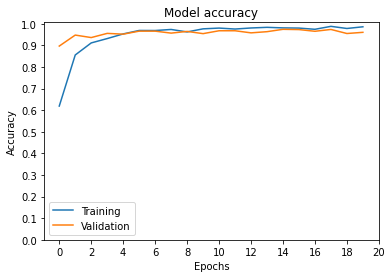

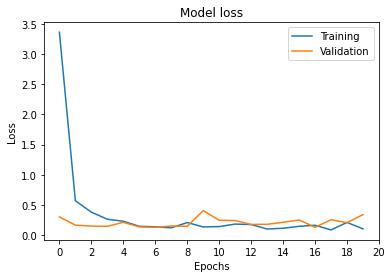


Testing: 
Loss = 0.46595409512519836 
Accuracy = 95.3939

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       150
           1       0.99      0.90      0.94       150
           2       1.00      0.99      0.99       150
           3       0.94      0.93      0.94       150
           4       1.00      0.96      0.98       150
           5       0.83      0.97      0.90       150
           6       0.89      1.00      0.94       150
           7       0.99      0.90      0.94       150
           8       1.00      0.96      0.98       150
           9       0.90      0.89      0.90       150
          10       0.99      1.00      1.00       150

    accuracy                           0.95      1650
   macro avg       0.96      0.95      0.95      1650
weighted avg       0.96      0.95      0.95      1650



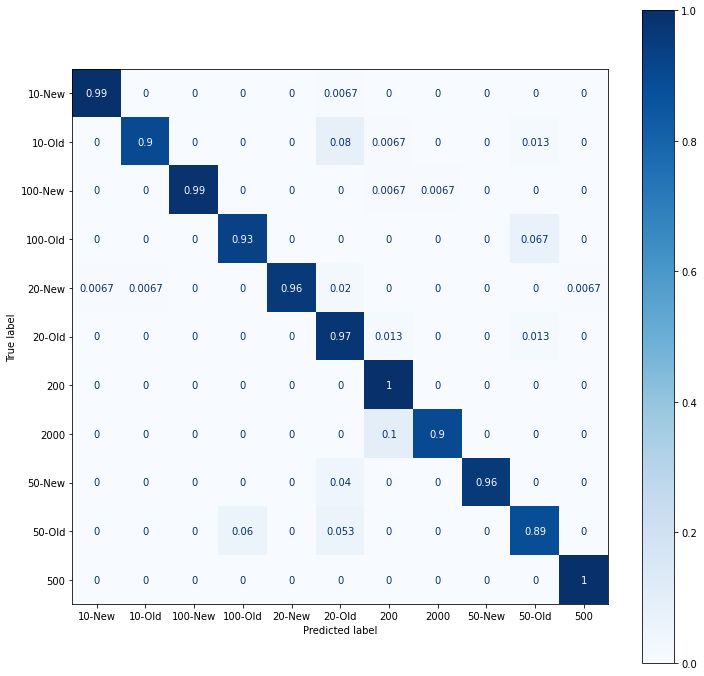

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(512,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

vgg16.compile(optimizer=tf.keras.optimizers.Adam(1e-4),loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=30,shuffle=True)

Epoch 1/30
241/241 [==============================] - 76s 258ms/step - loss: 2.1820 - accuracy: 0.6653 - val_loss: 0.1921 - val_accuracy: 0.9382
Epoch 2/30
241/241 [==============================] - 53s 221ms/step - loss: 0.3296 - accuracy: 0.9197 - val_loss: 0.1833 - val_accuracy: 0.9497
Epoch 3/30
241/241 [==============================] - 50s 210ms/step - loss: 0.1771 - accuracy: 0.9553 - val_loss: 0.1292 - val_accuracy: 0.9655
Epoch 4/30
241/241 [==============================] - 52s 215ms/step - loss: 0.1207 - accuracy: 0.9691 - val_loss: 0.1334 - val_accuracy: 0.9703
Epoch 5/30
241/241 [==============================] - 52s 215ms/step - loss: 0.0884 - accuracy: 0.9766 - val_loss: 0.1865 - val_accuracy: 0.9539
Epoch 6/30
241/241 [==============================] - 52s 216ms/step - loss: 0.0783 - accuracy: 0.9825 - val_loss: 0.1758 - val_accuracy: 0.9648
Epoch 7/30
241/241 [==============================] - 52s 216ms/step - loss: 0.0651 - accuracy: 0.9864 - val_loss: 0.1877 - val_ac

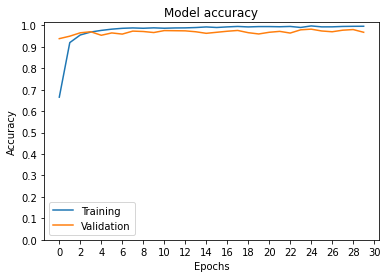

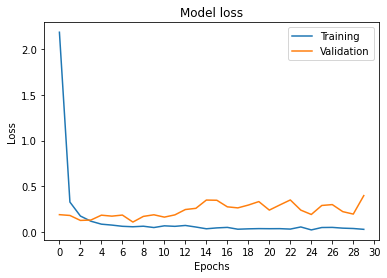


Testing: 
Loss = 0.30726850032806396 
Accuracy = 96.4848

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       150
           1       0.88      0.99      0.93       150
           2       0.99      1.00      0.99       150
           3       0.94      0.91      0.93       150
           4       1.00      0.97      0.98       150
           5       0.97      0.91      0.94       150
           6       0.96      1.00      0.98       150
           7       1.00      0.98      0.99       150
           8       1.00      0.96      0.98       150
           9       0.89      0.89      0.89       150
          10       1.00      1.00      1.00       150

    accuracy                           0.96      1650
   macro avg       0.97      0.96      0.96      1650
weighted avg       0.97      0.96      0.96      1650



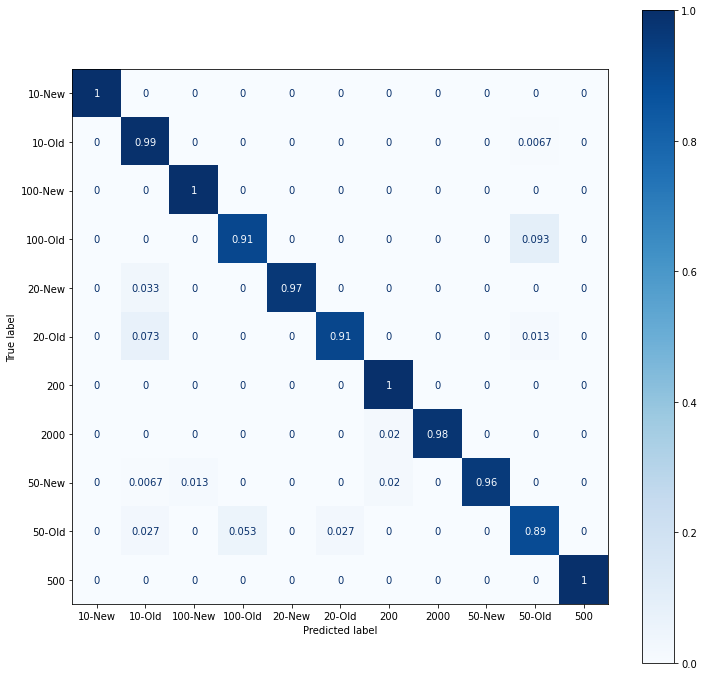

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 54s 216ms/step - loss: 2.1900 - accuracy: 0.6745 - val_loss: 0.2803 - val_accuracy: 0.9200
Epoch 2/10
241/241 [==============================] - 51s 213ms/step - loss: 0.3101 - accuracy: 0.9266 - val_loss: 0.2250 - val_accuracy: 0.9491
Epoch 3/10
241/241 [==============================] - 51s 210ms/step - loss: 0.1743 - accuracy: 0.9551 - val_loss: 0.2879 - val_accuracy: 0.9382
Epoch 4/10
241/241 [==============================] - 52s 215ms/step - loss: 0.1253 - accuracy: 0.9697 - val_loss: 0.1827 - val_accuracy: 0.9648
Epoch 5/10
241/241 [==============================] - 50s 210ms/step - loss: 0.0893 - accuracy: 0.9771 - val_loss: 0.2022 - val_accuracy: 0.9642
Epoch 6/10
241/241 [==============================] - 52s 215ms/step - loss: 0.0812 - accuracy: 0.9832 - val_loss: 0.1740 - val_accuracy: 0.9703
Epoch 7/10
241/241 [==============================] - 52s 216ms/step - loss: 0.0750 - accuracy: 0.9834 - val_loss: 0.2015 - val_ac

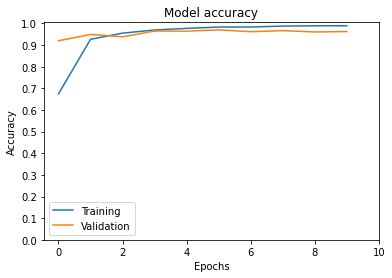

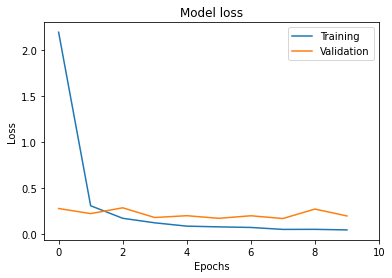


Testing: 
Loss = 0.21218302845954895 
Accuracy = 96.4242

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       150
           1       0.95      0.97      0.96       150
           2       0.94      1.00      0.97       150
           3       0.87      0.99      0.92       150
           4       1.00      0.97      0.98       150
           5       0.96      0.95      0.96       150
           6       0.98      0.99      0.99       150
           7       0.97      0.99      0.98       150
           8       0.99      0.93      0.96       150
           9       1.00      0.84      0.91       150
          10       0.99      0.99      0.99       150

    accuracy                           0.96      1650
   macro avg       0.97      0.96      0.96      1650
weighted avg       0.97      0.96      0.96      1650



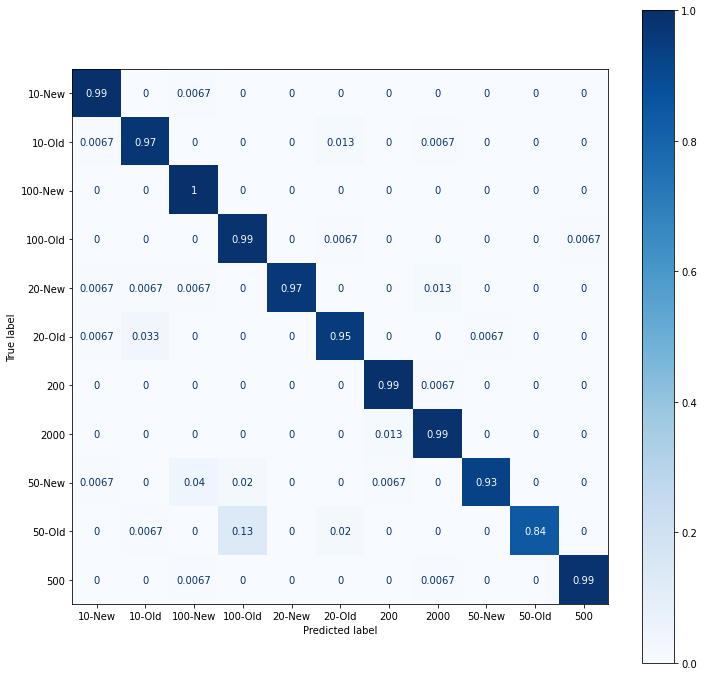

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

### Transfer learning - 4

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dense(256,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(64,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

vgg16.compile(optimizer='adam',
    loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg16.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0   

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=15,shuffle=True)

Epoch 1/15
241/241 [==============================] - 56s 220ms/step - loss: 3.1068 - accuracy: 0.2496 - val_loss: 1.2163 - val_accuracy: 0.5921
Epoch 2/15
241/241 [==============================] - 53s 218ms/step - loss: 1.3273 - accuracy: 0.5408 - val_loss: 0.5871 - val_accuracy: 0.8479
Epoch 3/15
241/241 [==============================] - 53s 220ms/step - loss: 0.7417 - accuracy: 0.7514 - val_loss: 0.2469 - val_accuracy: 0.9345
Epoch 4/15
241/241 [==============================] - 53s 220ms/step - loss: 0.4717 - accuracy: 0.8609 - val_loss: 0.1244 - val_accuracy: 0.9703
Epoch 5/15
241/241 [==============================] - 53s 219ms/step - loss: 0.3586 - accuracy: 0.9095 - val_loss: 0.1409 - val_accuracy: 0.9582
Epoch 6/15
241/241 [==============================] - 53s 221ms/step - loss: 0.2589 - accuracy: 0.9364 - val_loss: 0.1292 - val_accuracy: 0.9733
Epoch 7/15
241/241 [==============================] - 52s 214ms/step - loss: 0.2501 - accuracy: 0.9377 - val_loss: 0.0981 - val_ac

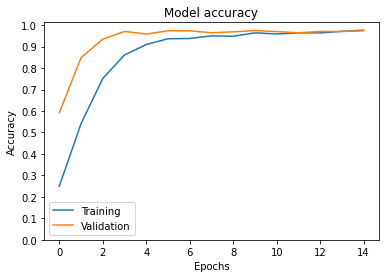

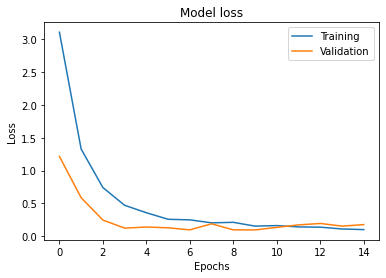


Testing: 
Loss = 0.1630624681711197 
Accuracy = 97.8788

              precision    recall  f1-score   support

           0       0.96      1.00      0.98       150
           1       1.00      0.95      0.98       150
           2       1.00      1.00      1.00       150
           3       0.99      0.95      0.97       150
           4       1.00      0.94      0.97       150
           5       0.90      0.99      0.94       150
           6       0.98      1.00      0.99       150
           7       1.00      0.98      0.99       150
           8       1.00      0.98      0.99       150
           9       0.95      0.97      0.96       150
          10       1.00      1.00      1.00       150

    accuracy                           0.98      1650
   macro avg       0.98      0.98      0.98      1650
weighted avg       0.98      0.98      0.98      1650



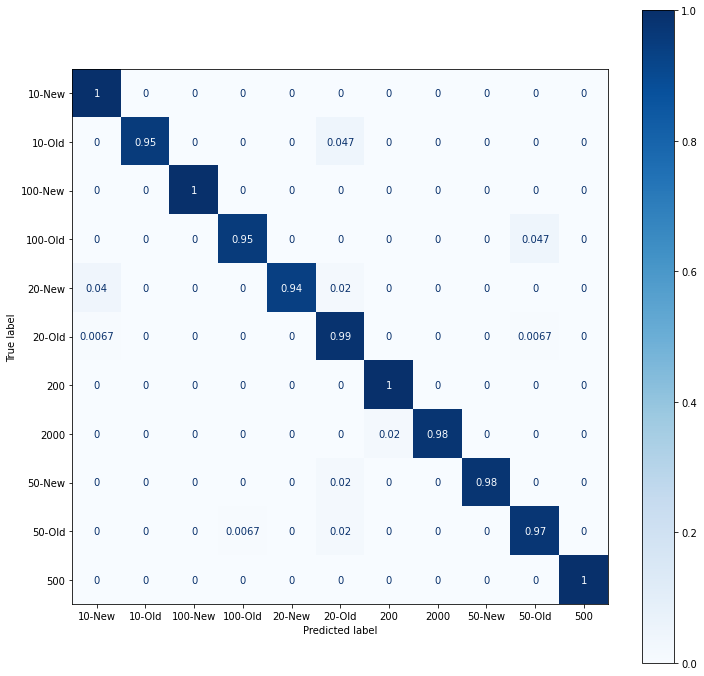

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

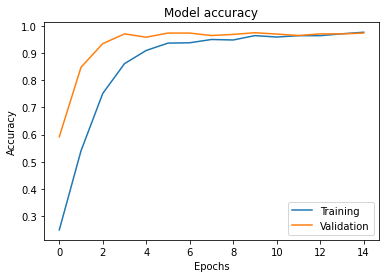

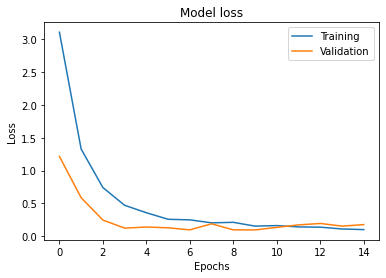


Testing: 
Loss = 0.1630624681711197 
Accuracy = 97.8788

              precision    recall  f1-score   support

           0       0.96      1.00      0.98       150
           1       1.00      0.95      0.98       150
           2       1.00      1.00      1.00       150
           3       0.99      0.95      0.97       150
           4       1.00      0.94      0.97       150
           5       0.90      0.99      0.94       150
           6       0.98      1.00      0.99       150
           7       1.00      0.98      0.99       150
           8       1.00      0.98      0.99       150
           9       0.95      0.97      0.96       150
          10       1.00      1.00      1.00       150

    accuracy                           0.98      1650
   macro avg       0.98      0.98      0.98      1650
weighted avg       0.98      0.98      0.98      1650



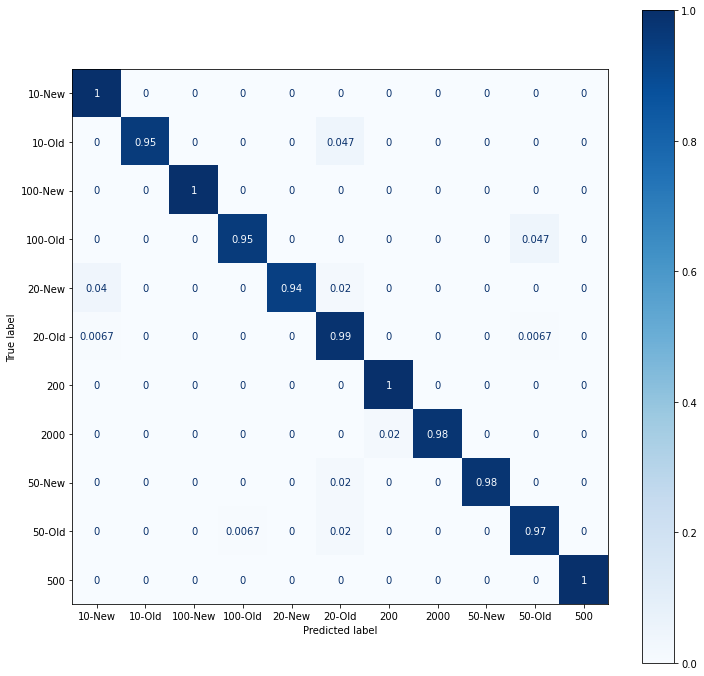

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
VGG16.saveModel("Final-denomination")

In [ ]:
print(vgg16fit.history)

{'loss': [3.1068379878997803, 1.3273206949234009, 0.7416698932647705, 0.4716634452342987, 0.358605295419693, 0.25888004899024963, 0.25013428926467896, 0.2047395557165146, 0.2125239074230194, 0.15465331077575684, 0.16274477541446686, 0.14249370992183685, 0.13880202174186707, 0.11117955297231674, 0.10169412940740585], 'accuracy': [0.24961039423942566, 0.5407792329788208, 0.7514285445213318, 0.860909104347229, 0.9094805121421814, 0.9363636374473572, 0.9376623630523682, 0.9497402310371399, 0.9479220509529114, 0.9640259742736816, 0.9587013125419617, 0.9637662172317505, 0.9637662172317505, 0.9706493616104126, 0.9763636589050293], 'val_loss': [1.2163398265838623, 0.5870734453201294, 0.24688811600208282, 0.1243555024266243, 0.14091995358467102, 0.12924879789352417, 0.09808947890996933, 0.1899309754371643, 0.0975971445441246, 0.09697045385837555, 0.1356392353773117, 0.1733129322528839, 0.19540223479270935, 0.1545785367488861, 0.17807504534721375], 'val_accuracy': [0.5921211838722229, 0.84787881

In [ ]:
np.save(os.path.join(headpath,'Model','vgg-denomination.npy'),vgg16fit.history)

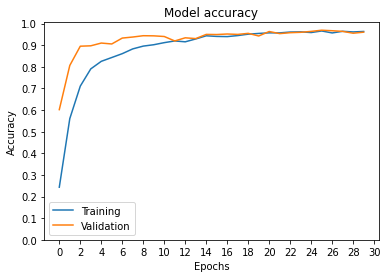

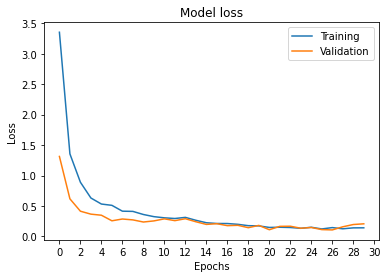


Testing: 
Loss = 0.169423907995224 
Accuracy = 96.4242

              precision    recall  f1-score   support

           0       0.95      1.00      0.97       150
           1       0.93      0.99      0.95       150
           2       1.00      0.99      1.00       150
           3       0.99      0.85      0.92       150
           4       1.00      0.95      0.98       150
           5       0.97      0.92      0.95       150
           6       1.00      0.97      0.98       150
           7       0.99      0.99      0.99       150
           8       1.00      0.95      0.98       150
           9       0.85      0.99      0.91       150
          10       0.97      1.00      0.98       150

    accuracy                           0.96      1650
   macro avg       0.97      0.96      0.96      1650
weighted avg       0.97      0.96      0.96      1650



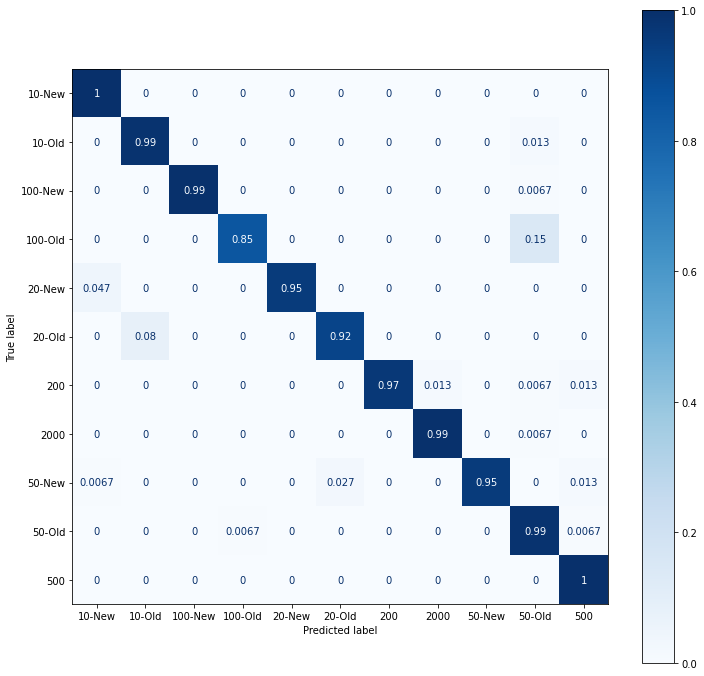

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

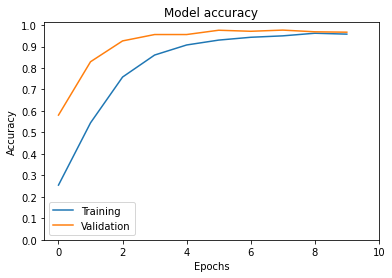

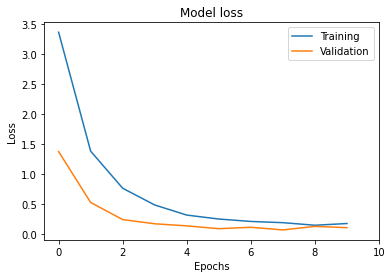


Testing: 
Loss = 0.09870146214962006 
Accuracy = 97.7576

              precision    recall  f1-score   support

           0       0.99      0.93      0.96       150
           1       0.99      0.97      0.98       150
           2       0.99      0.99      0.99       150
           3       0.99      0.93      0.96       150
           4       0.94      0.99      0.96       150
           5       0.96      0.99      0.98       150
           6       0.98      0.99      0.98       150
           7       1.00      0.99      1.00       150
           8       0.97      0.97      0.97       150
           9       0.94      0.99      0.96       150
          10       1.00      1.00      1.00       150

    accuracy                           0.98      1650
   macro avg       0.98      0.98      0.98      1650
weighted avg       0.98      0.98      0.98      1650



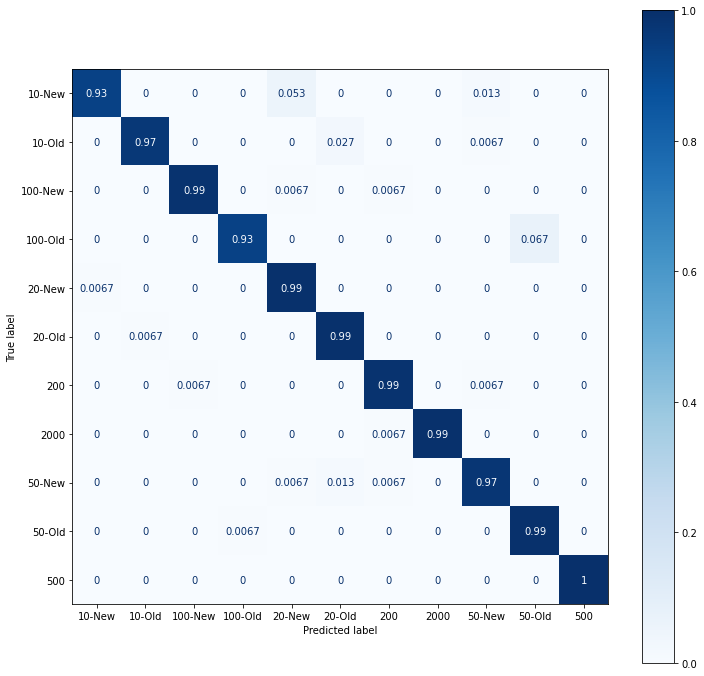

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=20,shuffle=True)

Epoch 1/20
241/241 [==============================] - 80s 277ms/step - loss: 3.2273 - accuracy: 0.6939 - val_loss: 0.3542 - val_accuracy: 0.9224
Epoch 2/20
241/241 [==============================] - 52s 217ms/step - loss: 0.6798 - accuracy: 0.8930 - val_loss: 0.3908 - val_accuracy: 0.9321
Epoch 3/20
241/241 [==============================] - 52s 216ms/step - loss: 0.5421 - accuracy: 0.9262 - val_loss: 0.2680 - val_accuracy: 0.9564
Epoch 4/20
241/241 [==============================] - 52s 215ms/step - loss: 0.4009 - accuracy: 0.9506 - val_loss: 0.2664 - val_accuracy: 0.9558
Epoch 5/20
241/241 [==============================] - 52s 217ms/step - loss: 0.3093 - accuracy: 0.9652 - val_loss: 0.2827 - val_accuracy: 0.9588
Epoch 6/20
241/241 [==============================] - 52s 214ms/step - loss: 0.2442 - accuracy: 0.9682 - val_loss: 0.2226 - val_accuracy: 0.9685
Epoch 7/20
241/241 [==============================] - 53s 219ms/step - loss: 0.1786 - accuracy: 0.9758 - val_loss: 0.1222 - val_ac

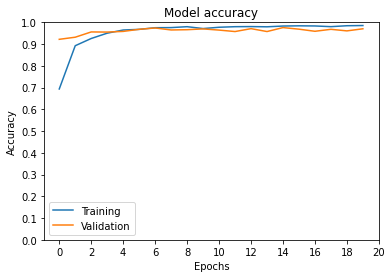

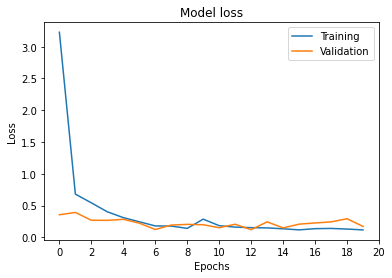


Testing: 
Loss = 0.3208685517311096 
Accuracy = 96.0606

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       150
           1       0.93      0.97      0.95       150
           2       0.97      1.00      0.98       150
           3       0.85      0.98      0.91       150
           4       0.98      0.91      0.94       150
           5       0.95      0.99      0.97       150
           6       0.97      1.00      0.98       150
           7       1.00      0.99      0.99       150
           8       1.00      0.94      0.97       150
           9       0.97      0.79      0.87       150
          10       1.00      1.00      1.00       150

    accuracy                           0.96      1650
   macro avg       0.96      0.96      0.96      1650
weighted avg       0.96      0.96      0.96      1650



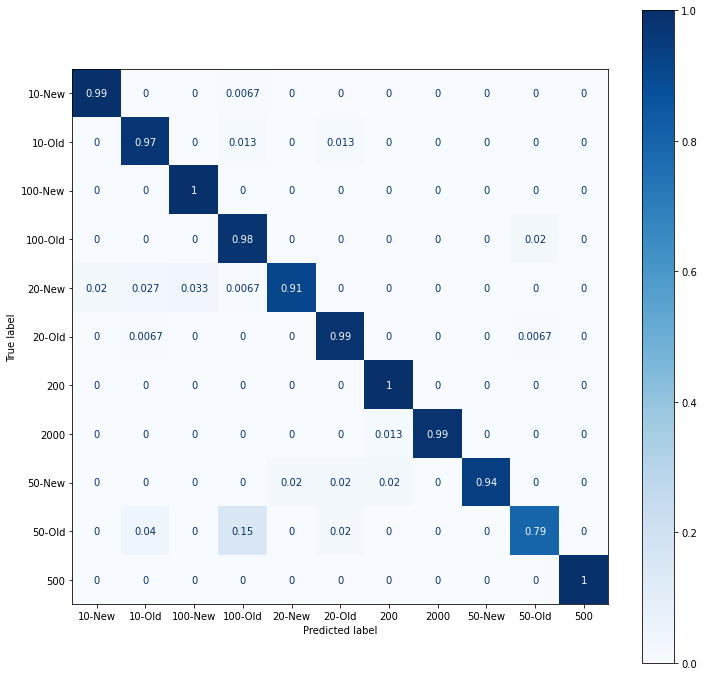

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
vgg16.trainable = True

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)

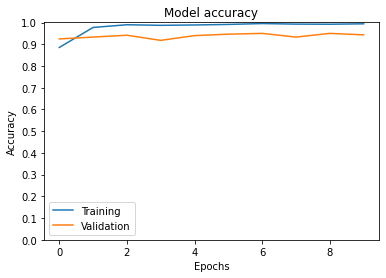

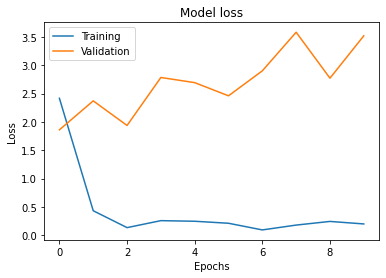


Testing: 
Loss = 3.7486047744750977 
Accuracy = 94.5455

              precision    recall  f1-score   support

           0       1.00      0.95      0.98       150
           1       0.85      0.94      0.89       150
           2       0.98      0.99      0.99       150
           3       0.91      0.93      0.92       150
           4       0.99      0.91      0.94       150
           5       0.96      0.91      0.94       150
           6       0.99      0.89      0.94       150
           7       0.96      0.99      0.98       150
           8       0.90      1.00      0.95       150
           9       0.94      0.88      0.91       150
          10       0.95      1.00      0.97       150

    accuracy                           0.95      1650
   macro avg       0.95      0.95      0.95      1650
weighted avg       0.95      0.95      0.95      1650



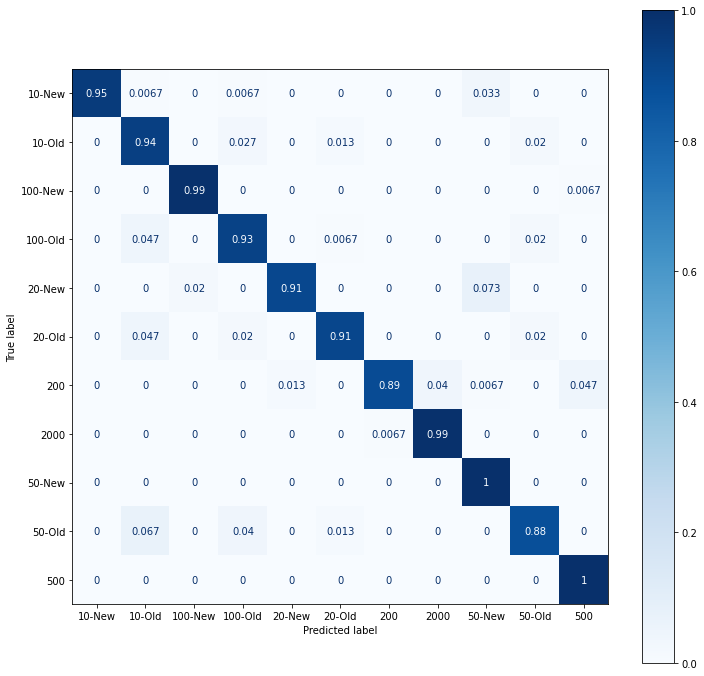

In [ ]:
VGG16.postAnalysis()

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dense(256,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(64,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

vgg16.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 66s 211ms/step - loss: 3.1497 - accuracy: 0.2830 - val_loss: 1.0705 - val_accuracy: 0.6976
Epoch 2/10
241/241 [==============================] - 50s 208ms/step - loss: 1.2670 - accuracy: 0.6012 - val_loss: 0.3885 - val_accuracy: 0.9030
Epoch 3/10
241/241 [==============================] - 51s 212ms/step - loss: 0.6557 - accuracy: 0.8040 - val_loss: 0.2122 - val_accuracy: 0.9345
Epoch 4/10
241/241 [==============================] - 52s 216ms/step - loss: 0.4258 - accuracy: 0.8796 - val_loss: 0.1575 - val_accuracy: 0.9503
Epoch 5/10
241/241 [==============================] - 52s 217ms/step - loss: 0.3342 - accuracy: 0.9110 - val_loss: 0.1156 - val_accuracy: 0.9648
Epoch 6/10
241/241 [==============================] - 51s 211ms/step - loss: 0.2444 - accuracy: 0.9344 - val_loss: 0.1326 - val_accuracy: 0.9624
Epoch 7/10
241/241 [==============================] - 51s 212ms/step - loss: 0.2064 - accuracy: 0.9497 - val_loss: 0.1170 - val_ac

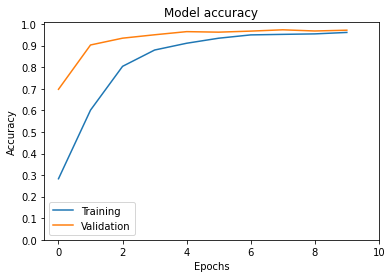

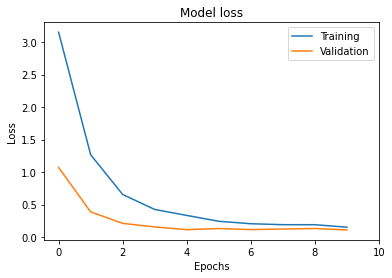


Testing: 
Loss = 0.1050715297460556 
Accuracy = 96.6667

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       150
           1       0.98      0.97      0.98       150
           2       0.98      0.99      0.98       150
           3       0.88      0.93      0.91       150
           4       0.96      0.98      0.97       150
           5       0.97      0.98      0.98       150
           6       0.97      0.99      0.98       150
           7       0.98      0.97      0.98       150
           8       1.00      0.96      0.98       150
           9       0.92      0.87      0.90       150
          10       1.00      0.99      1.00       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



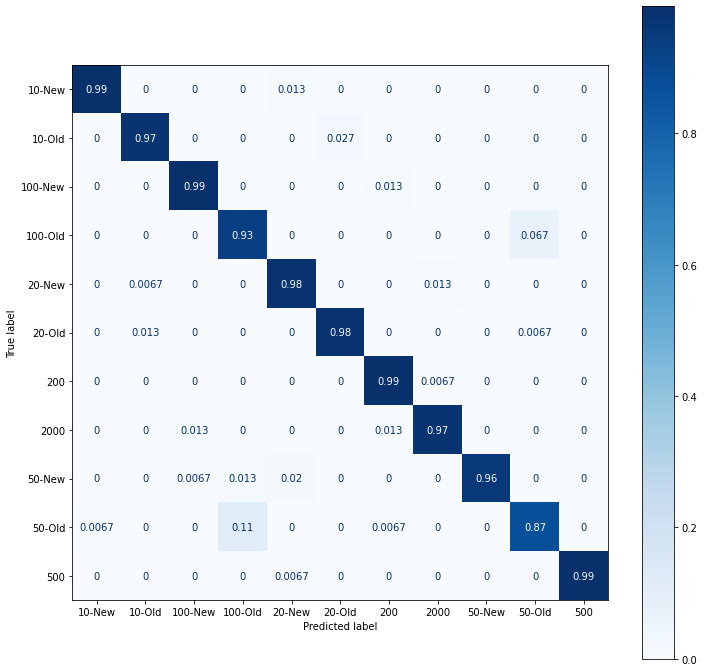

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=20,shuffle=True)

Epoch 1/20
241/241 [==============================] - 54s 222ms/step - loss: 0.1420 - accuracy: 0.9604 - val_loss: 0.2040 - val_accuracy: 0.9570
Epoch 2/20
241/241 [==============================] - 52s 216ms/step - loss: 0.1498 - accuracy: 0.9625 - val_loss: 0.1817 - val_accuracy: 0.9545
Epoch 3/20
241/241 [==============================] - 52s 216ms/step - loss: 0.1394 - accuracy: 0.9655 - val_loss: 0.1481 - val_accuracy: 0.9648
Epoch 4/20
241/241 [==============================] - 51s 211ms/step - loss: 0.2097 - accuracy: 0.9609 - val_loss: 0.1677 - val_accuracy: 0.9630
Epoch 5/20
241/241 [==============================] - 52s 217ms/step - loss: 0.1104 - accuracy: 0.9730 - val_loss: 0.2154 - val_accuracy: 0.9600
Epoch 6/20
241/241 [==============================] - 52s 216ms/step - loss: 0.0969 - accuracy: 0.9768 - val_loss: 0.1365 - val_accuracy: 0.9727
Epoch 7/20
241/241 [==============================] - 51s 212ms/step - loss: 0.0995 - accuracy: 0.9753 - val_loss: 0.1558 - val_ac

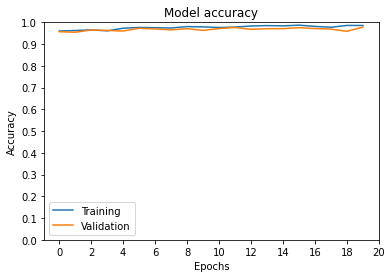

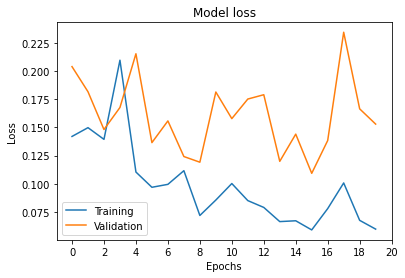


Testing: 
Loss = 0.1959729939699173 
Accuracy = 96.3636

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       150
           1       0.93      0.97      0.95       150
           2       1.00      0.98      0.99       150
           3       0.88      0.93      0.90       150
           4       0.99      0.99      0.99       150
           5       0.95      0.97      0.96       150
           6       0.94      1.00      0.97       150
           7       0.99      0.98      0.99       150
           8       1.00      0.89      0.94       150
           9       0.94      0.89      0.91       150
          10       1.00      1.00      1.00       150

    accuracy                           0.96      1650
   macro avg       0.96      0.96      0.96      1650
weighted avg       0.96      0.96      0.96      1650



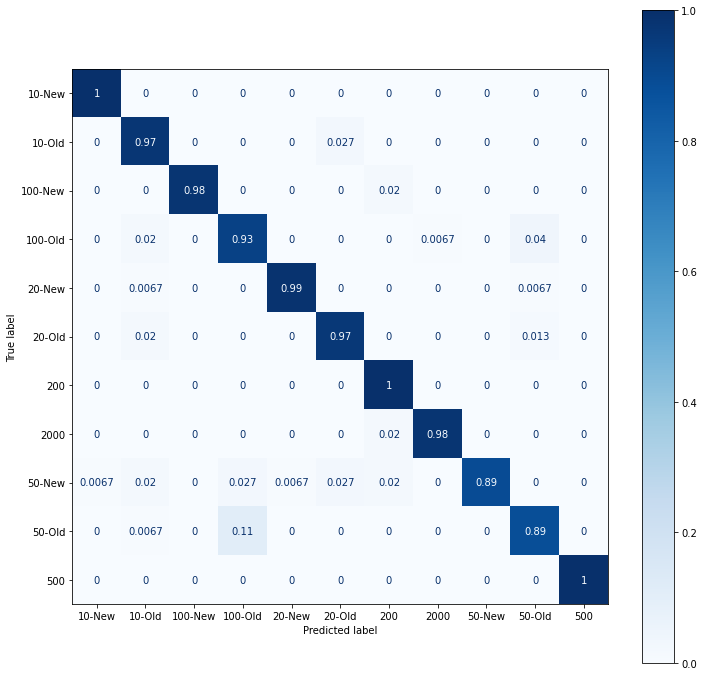

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dense(1024,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

vgg16.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 51s 197ms/step - loss: 3.8305 - accuracy: 0.1982 - val_loss: 1.8813 - val_accuracy: 0.2515
Epoch 2/10
241/241 [==============================] - 51s 212ms/step - loss: 1.8774 - accuracy: 0.2734 - val_loss: 1.5610 - val_accuracy: 0.3721
Epoch 3/10
241/241 [==============================] - 53s 221ms/step - loss: 1.6870 - accuracy: 0.3662 - val_loss: 1.1525 - val_accuracy: 0.5315
Epoch 4/10
241/241 [==============================] - 53s 218ms/step - loss: 1.3429 - accuracy: 0.4791 - val_loss: 0.8885 - val_accuracy: 0.6812
Epoch 5/10
241/241 [==============================] - 53s 220ms/step - loss: 1.0978 - accuracy: 0.5852 - val_loss: 0.7508 - val_accuracy: 0.7230
Epoch 6/10
241/241 [==============================] - 53s 219ms/step - loss: 1.0389 - accuracy: 0.6295 - val_loss: 0.6877 - val_accuracy: 0.7370
Epoch 7/10
241/241 [==============================] - 53s 220ms/step - loss: 0.8826 - accuracy: 0.6691 - val_loss: 0.4798 - val_ac

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 51s 213ms/step - loss: 0.5343 - accuracy: 0.8131 - val_loss: 0.2060 - val_accuracy: 0.9297
Epoch 2/10
241/241 [==============================] - 52s 216ms/step - loss: 0.4483 - accuracy: 0.8395 - val_loss: 0.1868 - val_accuracy: 0.9273
Epoch 3/10
241/241 [==============================] - 53s 219ms/step - loss: 0.4547 - accuracy: 0.8551 - val_loss: 0.2358 - val_accuracy: 0.9200
Epoch 4/10
241/241 [==============================] - 53s 220ms/step - loss: 0.3851 - accuracy: 0.8704 - val_loss: 0.1875 - val_accuracy: 0.9333
Epoch 5/10
241/241 [==============================] - 53s 219ms/step - loss: 0.3110 - accuracy: 0.8923 - val_loss: 0.2535 - val_accuracy: 0.9370
Epoch 6/10
241/241 [==============================] - 53s 219ms/step - loss: 0.2650 - accuracy: 0.9045 - val_loss: 0.1195 - val_accuracy: 0.9582
Epoch 7/10
241/241 [==============================] - 53s 220ms/step - loss: 0.3325 - accuracy: 0.9022 - val_loss: 0.2010 - val_ac

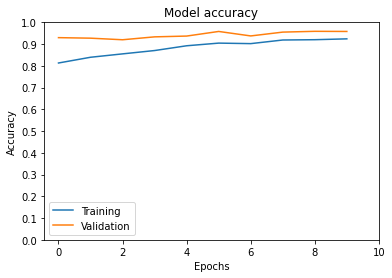

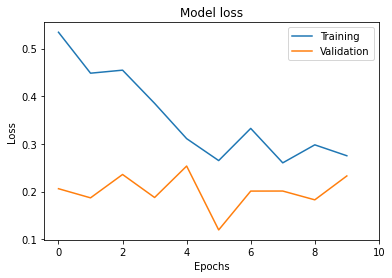


Testing: 
Loss = 0.18636003136634827 
Accuracy = 95.5758

              precision    recall  f1-score   support

           0       1.00      0.94      0.97       150
           1       0.97      0.95      0.96       150
           2       1.00      0.98      0.99       150
           3       0.91      0.92      0.91       150
           4       0.94      0.97      0.96       150
           5       0.92      0.94      0.93       150
           6       0.89      0.98      0.93       150
           7       0.98      0.97      0.98       150
           8       0.99      0.97      0.98       150
           9       0.92      0.89      0.91       150
          10       1.00      0.99      1.00       150

    accuracy                           0.96      1650
   macro avg       0.96      0.96      0.96      1650
weighted avg       0.96      0.96      0.96      1650



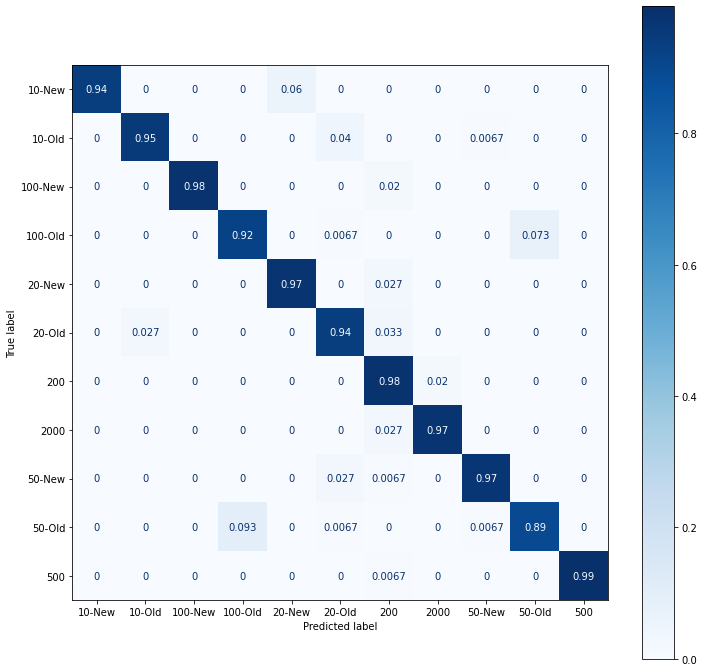

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

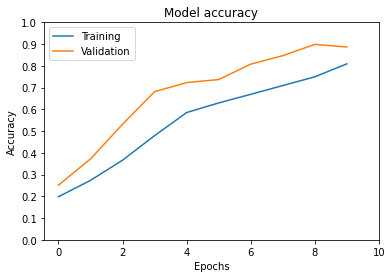

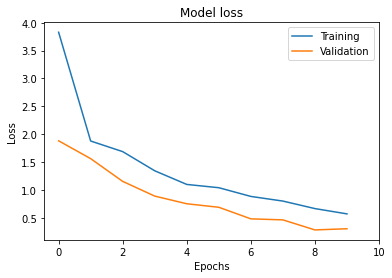


Testing: 
Loss = 0.353019118309021 
Accuracy = 87.4545

              precision    recall  f1-score   support

           0       0.81      0.99      0.89       150
           1       0.98      0.78      0.87       150
           2       1.00      0.91      0.95       150
           3       0.53      0.99      0.69       150
           4       1.00      0.73      0.84       150
           5       0.94      0.88      0.91       150
           6       0.90      0.97      0.93       150
           7       0.97      0.97      0.97       150
           8       0.93      0.96      0.94       150
           9       1.00      0.45      0.62       150
          10       0.99      1.00      1.00       150

    accuracy                           0.87      1650
   macro avg       0.91      0.87      0.87      1650
weighted avg       0.91      0.87      0.87      1650



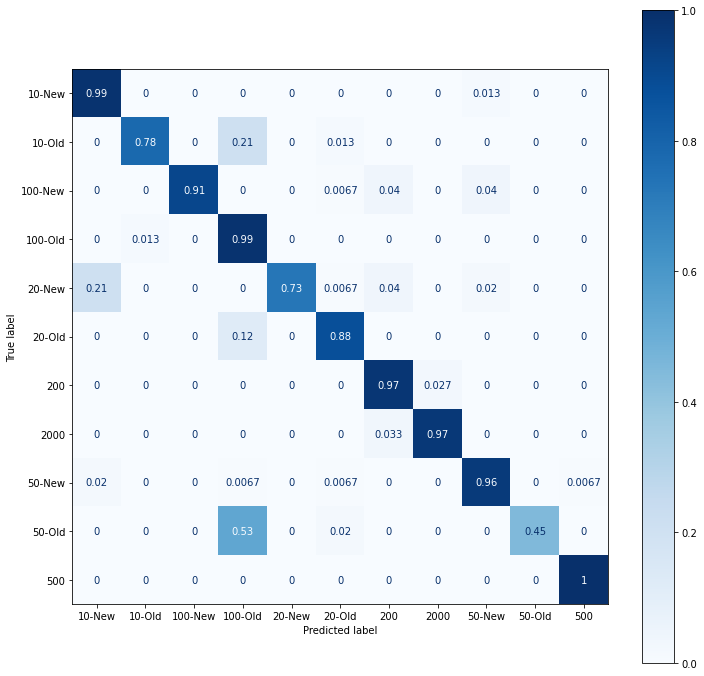

In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)
VGG16.postAnalysis()

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dense(1024,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(256,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(64,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

vgg16.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 54s 206ms/step - loss: 3.7183 - accuracy: 0.1217 - val_loss: 2.2547 - val_accuracy: 0.1552
Epoch 2/10
241/241 [==============================] - 50s 209ms/step - loss: 2.3142 - accuracy: 0.1391 - val_loss: 2.2204 - val_accuracy: 0.1618
Epoch 3/10
241/241 [==============================] - 53s 218ms/step - loss: 2.2450 - accuracy: 0.1601 - val_loss: 2.2329 - val_accuracy: 0.1533
Epoch 4/10
241/241 [==============================] - 53s 219ms/step - loss: 2.2659 - accuracy: 0.1562 - val_loss: 2.2420 - val_accuracy: 0.1497
Epoch 5/10
241/241 [==============================] - 53s 219ms/step - loss: 2.1928 - accuracy: 0.1632 - val_loss: 2.1588 - val_accuracy: 0.1764
Epoch 6/10
241/241 [==============================] - 52s 215ms/step - loss: 2.1731 - accuracy: 0.1691 - val_loss: 2.1769 - val_accuracy: 0.1673
Epoch 7/10
241/241 [==============================] - 53s 221ms/step - loss: 2.1834 - accuracy: 0.1670 - val_loss: 2.1265 - val_ac

740


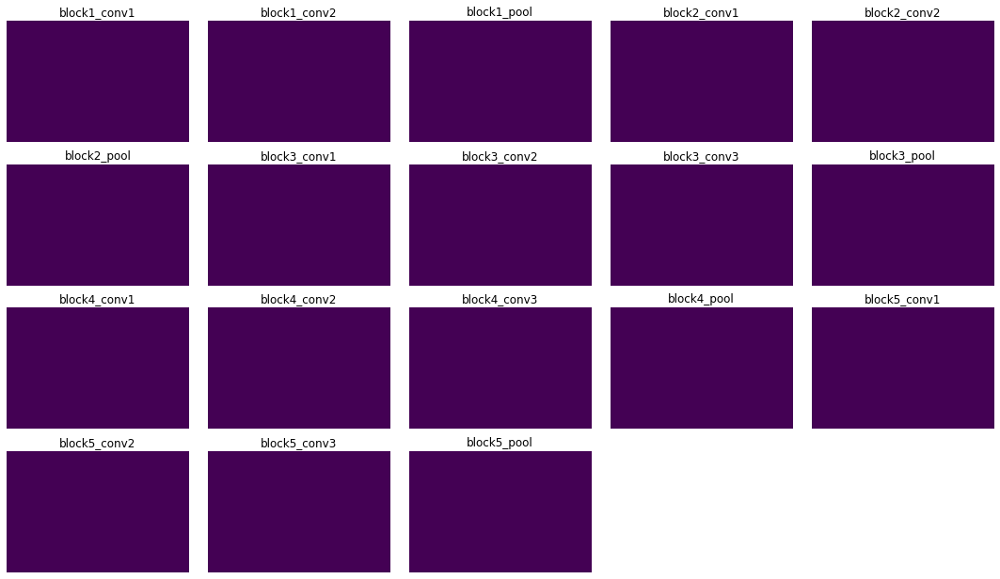

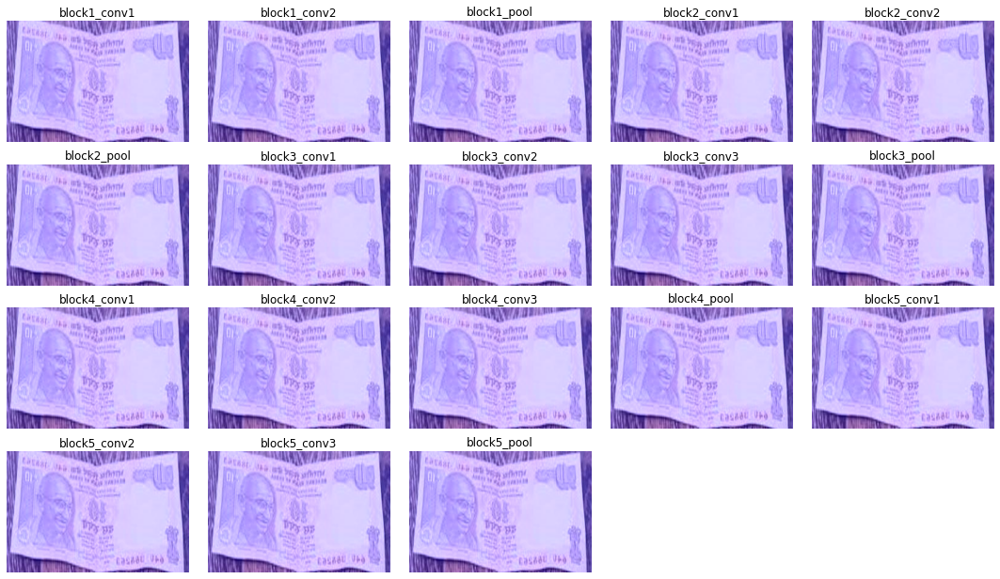

In [ ]:
layers = ['block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_pool']
VGG16.GradCamAnalysis(layers,rnd=740,eps=0.1)

596


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


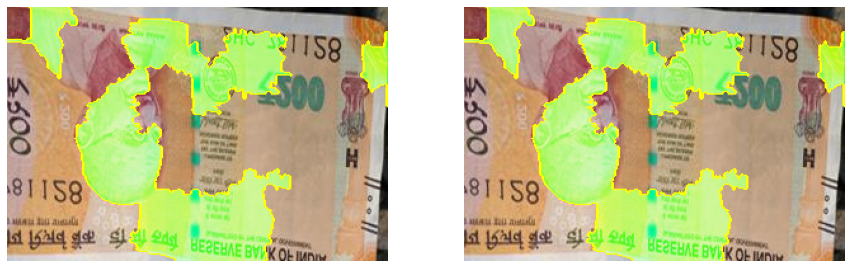

In [ ]:
VGG16.LimeAnalysis(samples=500)

In [ ]:
VGG16.saveModel('VGG16')

## VGG19

In [ ]:
vgg19base = tf.keras.applications.VGG19(input_shape=(200,300,3),weights='imagenet',include_top=False)
vgg19base.trainable = False 

80134624/80134624 [==============================] - 4s 0us/step


In [ ]:
vgg19base.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0     

### Transfer learning - 1

In [ ]:
last_layer = vgg19base.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg19 = Model(inputs=vgg19base.input, outputs=downlayers)

vgg19.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg19.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0     

In [ ]:
vgg19fit = vgg19.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 83s 297ms/step - loss: 3.2944 - accuracy: 0.0955 - val_loss: 2.3981 - val_accuracy: 0.0909
Epoch 2/10
241/241 [==============================] - 71s 297ms/step - loss: 2.4415 - accuracy: 0.0960 - val_loss: 2.3980 - val_accuracy: 0.0909
Epoch 3/10
241/241 [==============================] - 72s 301ms/step - loss: 2.4114 - accuracy: 0.1121 - val_loss: 2.3095 - val_accuracy: 0.1315
Epoch 4/10
241/241 [==============================] - 72s 299ms/step - loss: 2.2987 - accuracy: 0.1474 - val_loss: 2.2171 - val_accuracy: 0.1739
Epoch 5/10
241/241 [==============================] - 72s 299ms/step - loss: 2.1958 - accuracy: 0.1765 - val_loss: 2.0606 - val_accuracy: 0.2400
Epoch 6/10
241/241 [==============================] - 72s 299ms/step - loss: 2.0995 - accuracy: 0.2117 - val_loss: 1.9188 - val_accuracy: 0.2685
Epoch 7/10
241/241 [==============================] - 63s 260ms/step - loss: 2.0673 - accuracy: 0.2266 - val_loss: 1.9200 - val_ac

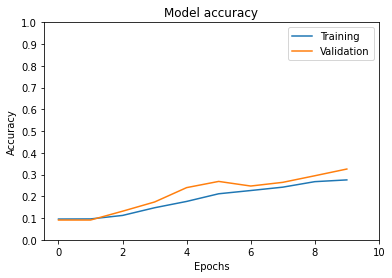

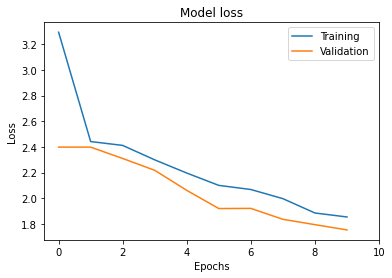


Testing: 
Loss = 1.7339556217193604 
Accuracy = 32.3030



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       150
           1       0.50      0.01      0.01       150
           2       0.79      0.23      0.35       150
           3       0.93      0.52      0.67       150
           4       0.13      1.00      0.23       150
           5       0.21      0.03      0.06       150
           6       0.33      0.01      0.01       150
           7       0.00      0.00      0.00       150
           8       0.00      0.00      0.00       150
           9       0.63      0.80      0.71       150
          10       0.96      0.96      0.96       150

    accuracy                           0.32      1650
   macro avg       0.41      0.32      0.27      1650
weighted avg       0.41      0.32      0.27      1650



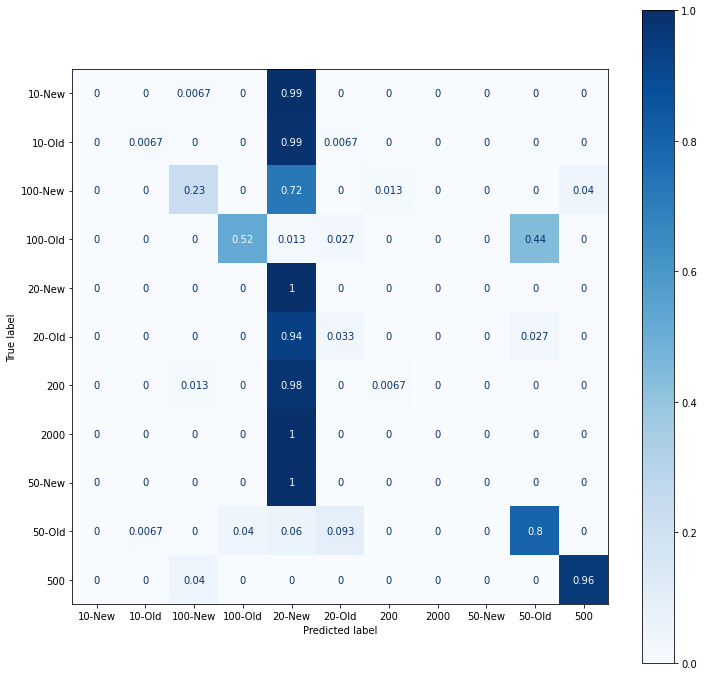

In [ ]:
VGG19 = ModelAnalysis(vgg19,[(X,Y),(A,B),(E,F)],vgg19fit)
VGG19.postAnalysis()

In [ ]:
vgg19fit = vgg19.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=20,shuffle=True)

Epoch 1/20
241/241 [==============================] - 73s 302ms/step - loss: 1.8088 - accuracy: 0.2992 - val_loss: 1.6775 - val_accuracy: 0.3715
Epoch 2/20
241/241 [==============================] - 72s 300ms/step - loss: 1.7381 - accuracy: 0.3303 - val_loss: 1.5283 - val_accuracy: 0.4230
Epoch 3/20
241/241 [==============================] - 72s 299ms/step - loss: 1.6263 - accuracy: 0.3669 - val_loss: 1.4230 - val_accuracy: 0.4527
Epoch 4/20
241/241 [==============================] - 72s 299ms/step - loss: 1.5776 - accuracy: 0.3864 - val_loss: 1.3852 - val_accuracy: 0.4533
Epoch 5/20
241/241 [==============================] - 62s 259ms/step - loss: 1.4977 - accuracy: 0.4145 - val_loss: 1.3278 - val_accuracy: 0.4758
Epoch 6/20
241/241 [==============================] - 71s 295ms/step - loss: 1.4195 - accuracy: 0.4383 - val_loss: 1.2496 - val_accuracy: 0.5061
Epoch 7/20
241/241 [==============================] - 72s 299ms/step - loss: 1.3784 - accuracy: 0.4479 - val_loss: 1.2205 - val_ac

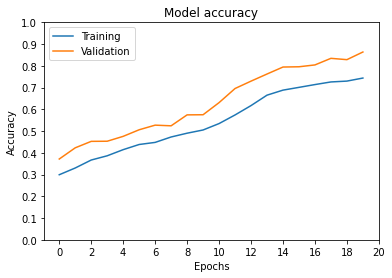

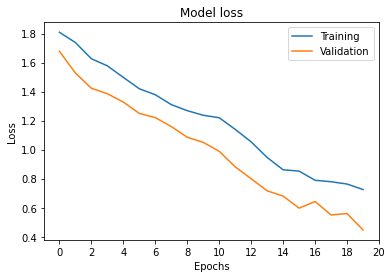


Testing: 
Loss = 0.44161149859428406 
Accuracy = 84.7879

              precision    recall  f1-score   support

           0       0.91      0.97      0.94       150
           1       0.81      0.97      0.88       150
           2       0.92      0.99      0.95       150
           3       0.99      0.88      0.93       150
           4       0.88      0.15      0.25       150
           5       0.88      0.81      0.84       150
           6       0.91      0.77      0.83       150
           7       0.89      0.95      0.92       150
           8       0.53      0.93      0.67       150
           9       0.91      0.91      0.91       150
          10       1.00      1.00      1.00       150

    accuracy                           0.85      1650
   macro avg       0.87      0.85      0.83      1650
weighted avg       0.87      0.85      0.83      1650



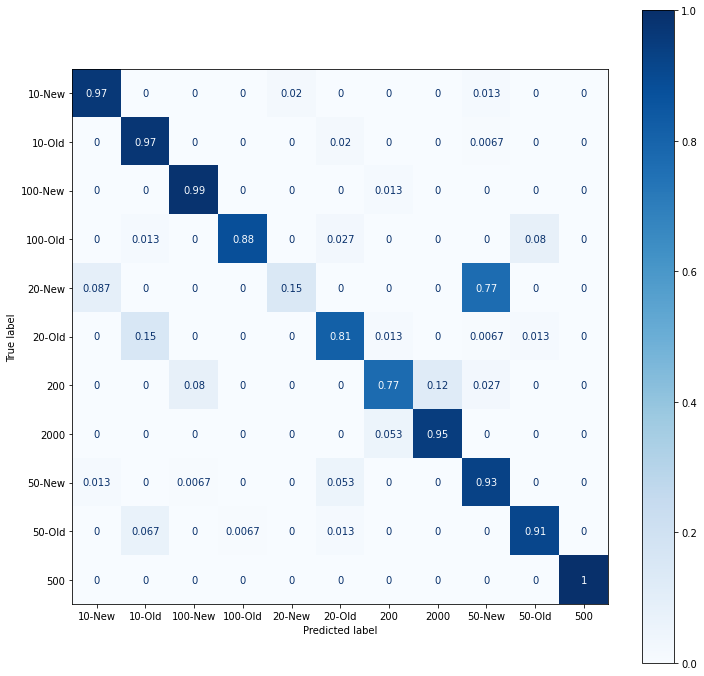

In [ ]:
VGG19 = ModelAnalysis(vgg19,[(X,Y),(A,B),(E,F)],vgg19fit)
VGG19.postAnalysis()

## Xception

In [ ]:
Xceptionbase = tf.keras.applications.Xception(input_shape=(200,300,3),weights='imagenet',include_top=False)
Xceptionbase.trainable = False

83683744/83683744 [==============================] - 5s 0us/step


In [ ]:
Xceptionbase.summary()

Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 99, 149, 32)  864         ['input_2[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 99, 149, 32)  128        ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                           

### Transfer learning - 1

In [ ]:
last_layer = Xceptionbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dense(128,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32,activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(12,activation='softmax')(downlayers)

xception = Model(inputs=Xceptionbase.input, outputs=downlayers)

xception.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
xception.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 99, 149, 32)  864         ['input_2[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 99, 149, 32)  128        ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                            

In [ ]:
xceptionfit = xception.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 78s 279ms/step - loss: 13.4596 - accuracy: 0.0906 - val_loss: 2.4662 - val_accuracy: 0.0909
Epoch 2/10
241/241 [==============================] - 54s 223ms/step - loss: 2.9515 - accuracy: 0.0869 - val_loss: 2.4525 - val_accuracy: 0.0909
Epoch 3/10
241/241 [==============================] - 51s 211ms/step - loss: 2.7451 - accuracy: 0.0891 - val_loss: 2.4426 - val_accuracy: 0.0909
Epoch 4/10
241/241 [==============================] - 52s 215ms/step - loss: 2.5293 - accuracy: 0.0888 - val_loss: 2.4350 - val_accuracy: 0.0909
Epoch 5/10
241/241 [==============================] - 52s 218ms/step - loss: 2.5387 - accuracy: 0.0894 - val_loss: 2.4292 - val_accuracy: 0.0909
Epoch 6/10
241/241 [==============================] - 53s 219ms/step - loss: 2.4423 - accuracy: 0.0786 - val_loss: 2.4246 - val_accuracy: 0.0909
Epoch 7/10
241/241 [==============================] - 53s 220ms/step - loss: 2.5075 - accuracy: 0.0869 - val_loss: 2.4208 - val_a

KeyboardInterrupt: ignored

In [ ]:
XCEPTION = ModelAnalysis(xception,[(X,Y),(A,B),(E,F)],xceptionfit)

In [ ]:
XCEPTION.postAnalysis()

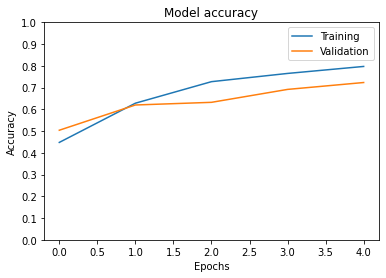

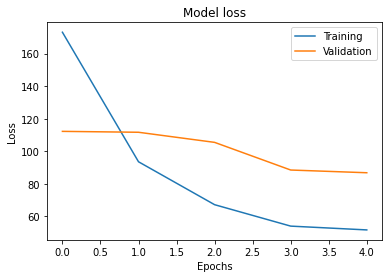


Testing: 
Loss = 82.2989501953125 
Accuracy = 73.1667

              precision    recall  f1-score   support

           0       0.77      0.65      0.71       150
           1       0.87      0.69      0.77       150
           2       0.82      0.78      0.80       150
           3       0.89      0.38      0.53       150
           4       0.75      0.76      0.75       150
           5       0.82      0.59      0.69       150
           6       0.75      0.81      0.78       150
           7       0.78      0.77      0.78       150
           8       0.74      0.81      0.77       150
           9       0.44      0.90      0.59       150
          10       0.76      0.85      0.80       150
          11       0.87      0.78      0.82       150

    accuracy                           0.73      1800
   macro avg       0.77      0.73      0.73      1800
weighted avg       0.77      0.73      0.73      1800



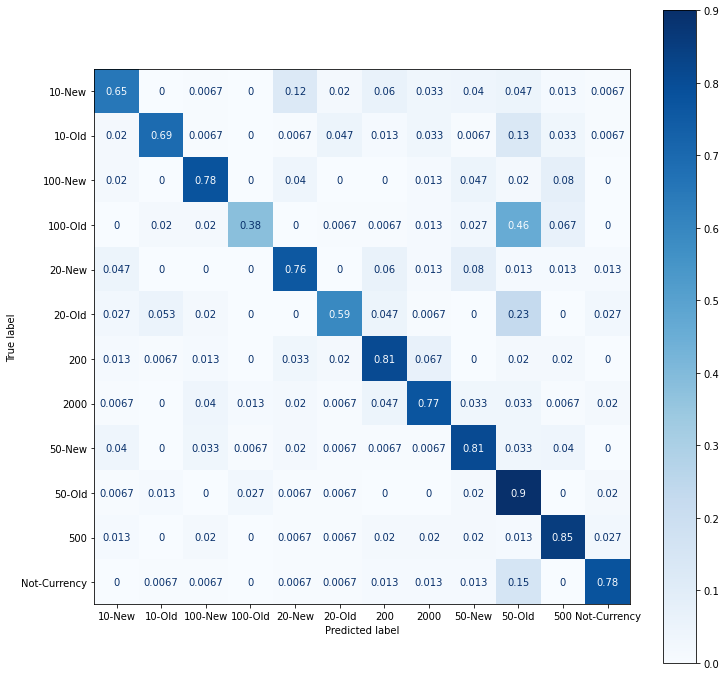

In [ ]:
XCEPTION.postAnalysis()

## AlexNet

In [ ]:
alexnet = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(200,300,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    # keras.layers.GlobalAveragePooling2D(),
    keras.layers.Flatten(),
    #keras.layers.Dense(4096, activation='relu'),
    #keras.layers.Dropout(0.5),
    #keras.layers.Dense(4096, activation='relu'),
    #keras.layers.Dropout(0.5),
    keras.layers.Dense(11, activation='softmax')
])

In [ ]:
alexnet.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 73, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 48, 73, 96)       384       
 ormalization)                                                   
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 23, 36, 96)       0         
 2D)                                                             
                                                                 
 conv2d_1 (Conv2D)           (None, 23, 36, 256)       614656    
                                                                 
 batch_normalization_1 (Batc  (None, 23, 36, 256)      1024      
 hNormalization)                                                 
                                                        

In [ ]:
alexnet.compile(loss = keras.losses.sparse_categorical_crossentropy, optimizer= 'adam', metrics=['accuracy'])

In [ ]:
alexnetModel = alexnet.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 16s 53ms/step - loss: 1.8978 - accuracy: 0.6232 - val_loss: 23.2724 - val_accuracy: 0.2624
Epoch 2/10
241/241 [==============================] - 11s 44ms/step - loss: 0.9072 - accuracy: 0.8109 - val_loss: 12.3066 - val_accuracy: 0.2479
Epoch 3/10
241/241 [==============================] - 11s 44ms/step - loss: 0.5430 - accuracy: 0.8769 - val_loss: 4.9151 - val_accuracy: 0.5855
Epoch 4/10
241/241 [==============================] - 11s 44ms/step - loss: 0.3682 - accuracy: 0.9239 - val_loss: 2.6806 - val_accuracy: 0.6394
Epoch 5/10
241/241 [==============================] - 10s 44ms/step - loss: 0.2669 - accuracy: 0.9360 - val_loss: 1.7573 - val_accuracy: 0.7612
Epoch 6/10
241/241 [==============================] - 11s 44ms/step - loss: 0.3409 - accuracy: 0.9370 - val_loss: 0.6879 - val_accuracy: 0.9097
Epoch 7/10
241/241 [==============================] - 11s 44ms/step - loss: 0.1804 - accuracy: 0.9614 - val_loss: 6.0452 - val_accurac

In [ ]:
ALEXNET = ModelAnalysis(alexnet,[(X,Y),(A,B),(E,F)],alexnetModel)

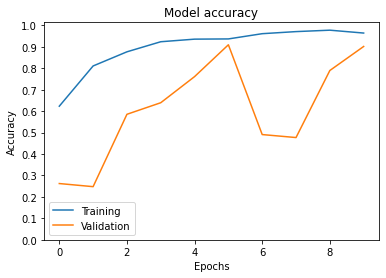

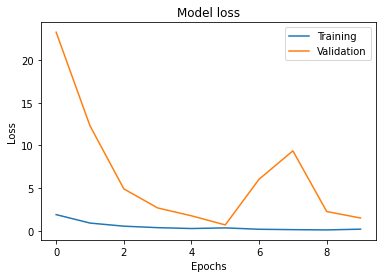


Testing: 
Loss = 1.11807382106781 
Accuracy = 90.3636

              precision    recall  f1-score   support

           0       0.70      0.95      0.81       150
           1       0.93      0.89      0.91       150
           2       0.99      0.97      0.98       150
           3       0.96      0.82      0.88       150
           4       1.00      0.57      0.73       150
           5       0.90      0.99      0.94       150
           6       0.99      0.95      0.97       150
           7       0.89      1.00      0.94       150
           8       0.98      0.97      0.97       150
           9       0.82      0.97      0.89       150
          10       0.91      0.85      0.88       150

    accuracy                           0.90      1650
   macro avg       0.92      0.90      0.90      1650
weighted avg       0.92      0.90      0.90      1650



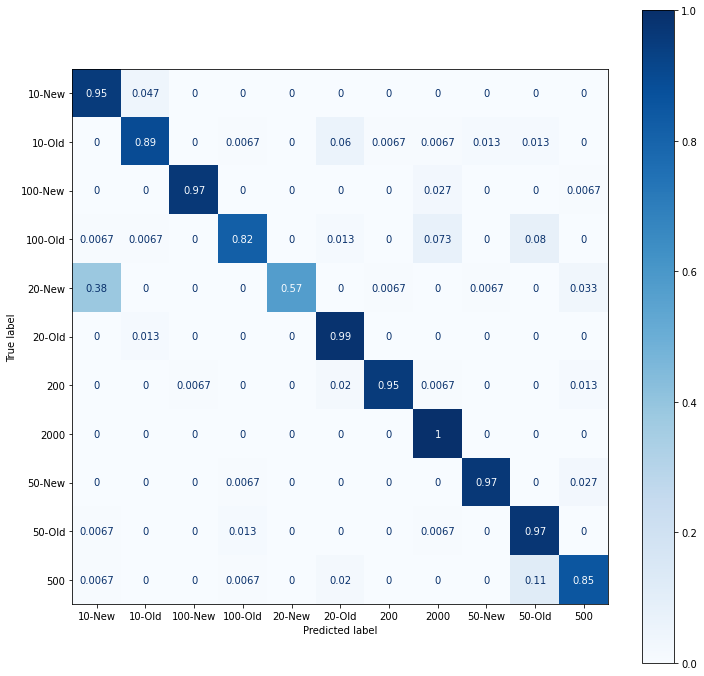

In [ ]:
ALEXNET.postAnalysis()

## Best Model

In [ ]:
vggbase = tf.keras.applications.VGG16(input_shape=(200,300,3),weights="imagenet",include_top=False)
vggbase.trainable = False

In [ ]:
vggbasecam = tf.keras.applications.VGG16(input_shape=(200,300,3),weights="imagenet",include_top=False)

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
test = ModelAnalysis(vggbasecam,[(X,Y),(A,B),(E,F)],None)

350


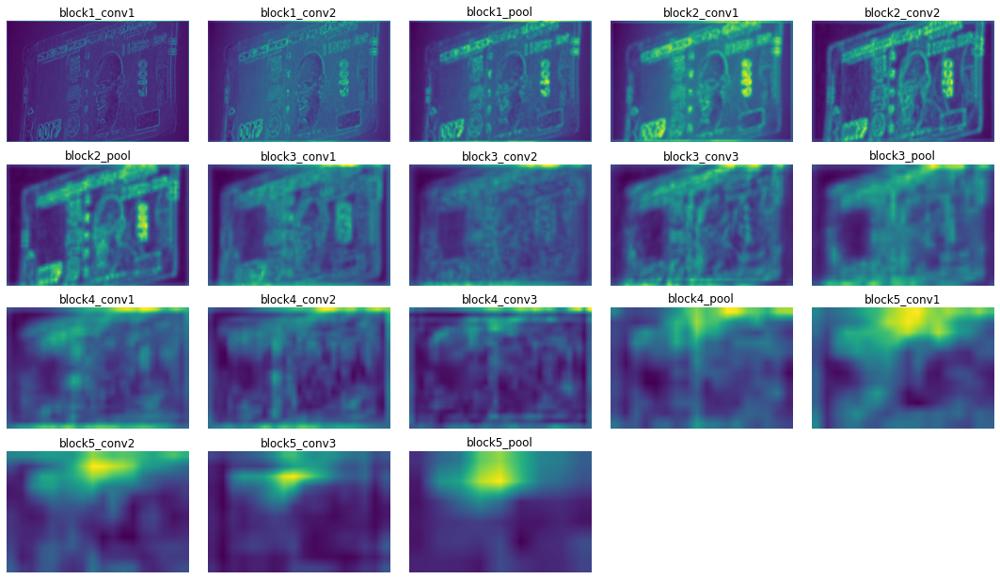

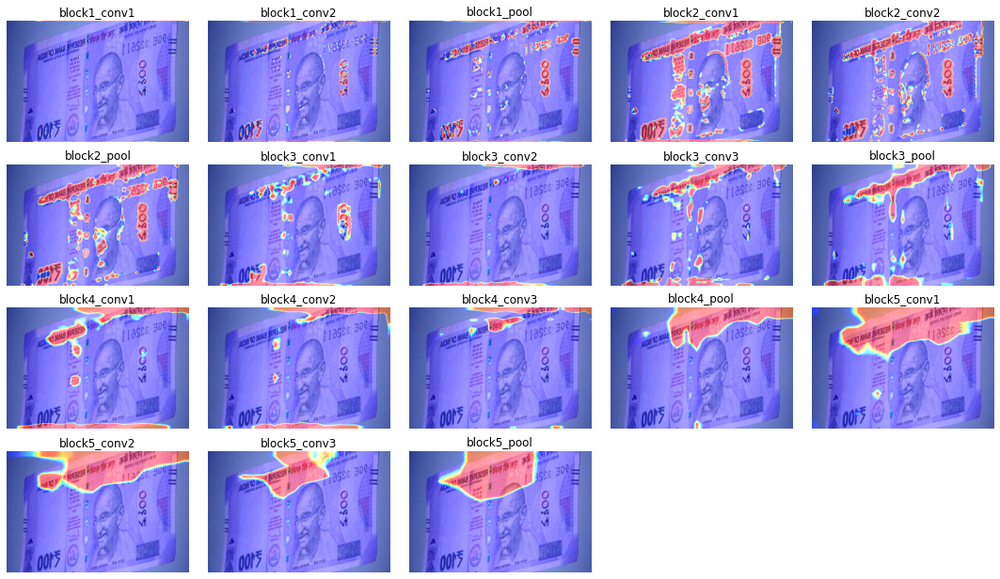

In [ ]:
test.GradCamAnalysis(rnd=None,eps=0.5,layers=['block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_pool'])

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

vgg16.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg16.summary()

Model: "model_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0  

In [ ]:
vgg16fit = vgg16.fit(X,Y,batch_size=32,validation_data=(A,B),epochs=3,shuffle=True)

Epoch 1/3
241/241 [==============================] - 53s 219ms/step - loss: 2.2311 - accuracy: 0.8883 - val_loss: 2.7696 - val_accuracy: 0.9006
Epoch 2/3
241/241 [==============================] - 53s 221ms/step - loss: 0.3943 - accuracy: 0.9787 - val_loss: 1.9484 - val_accuracy: 0.9382
Epoch 3/3
241/241 [==============================] - 54s 223ms/step - loss: 0.2726 - accuracy: 0.9860 - val_loss: 1.7375 - val_accuracy: 0.9448


In [ ]:
VGG16 = ModelAnalysis(vgg16,[(X,Y),(A,B),(E,F)],vgg16fit)

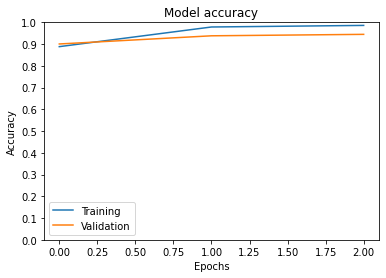

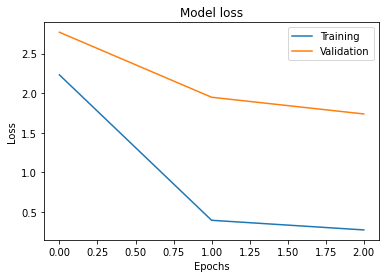


Testing: 
Loss = 1.2395079135894775 
Accuracy = 96.7273

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       150
           1       0.91      0.97      0.94       150
           2       0.98      0.99      0.98       150
           3       0.95      0.94      0.94       150
           4       0.99      0.93      0.96       150
           5       1.00      0.93      0.97       150
           6       0.99      0.97      0.98       150
           7       0.98      1.00      0.99       150
           8       0.99      1.00      1.00       150
           9       0.95      0.94      0.94       150
          10       0.98      0.99      0.98       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



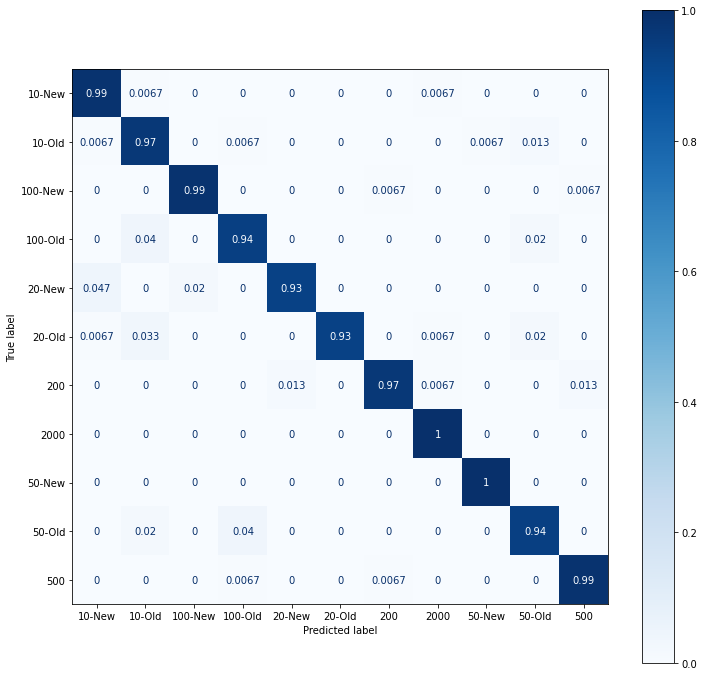

In [ ]:
VGG16.postAnalysis()

642


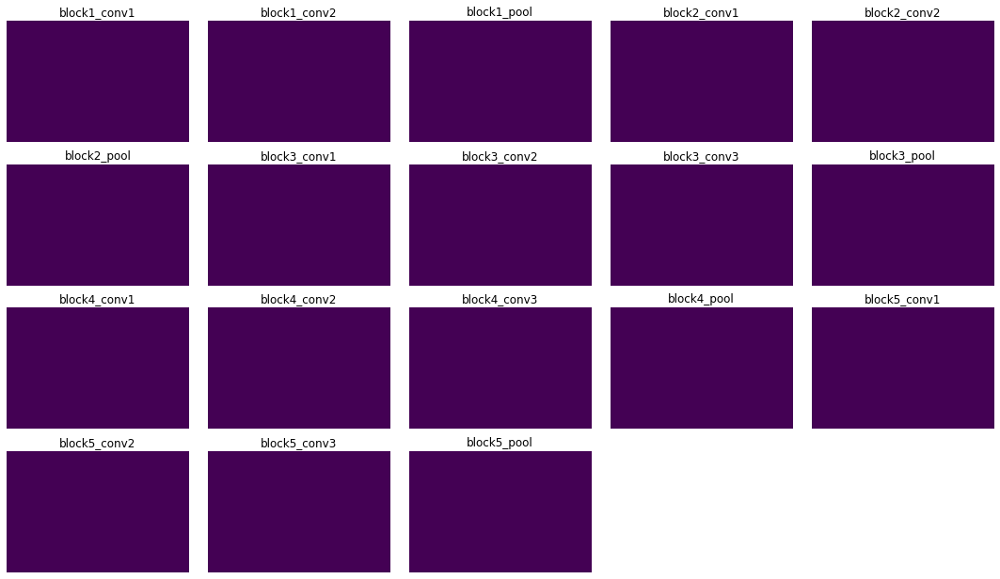

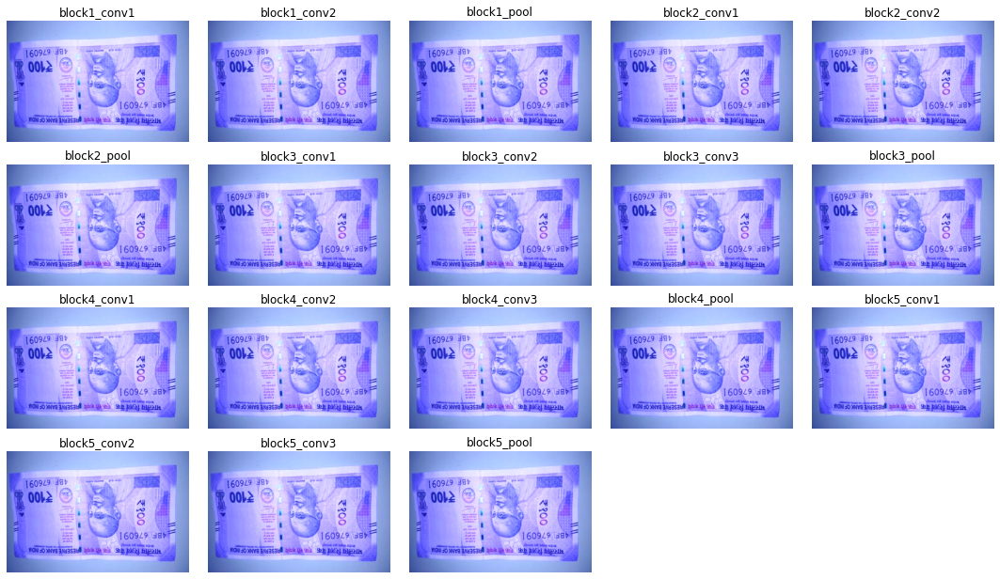

In [ ]:
VGG16.GradCamAnalysis(layers)

901


  0%|          | 0/10 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


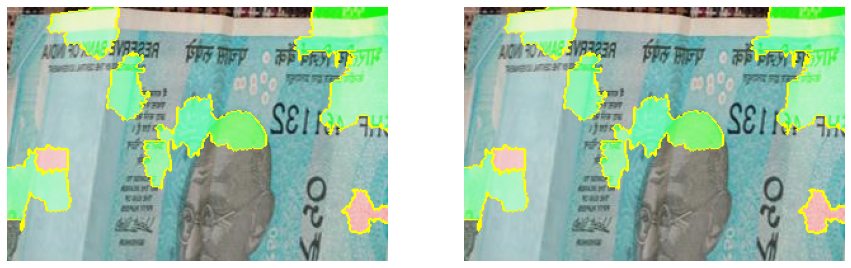

In [ ]:
VGG16.LimeAnalysis(samples=10)

In [ ]:
VGG16.saveModel('VGG16')

# Rest of testing 

In [ ]:
model = keras.models.load_model(os.path.join(headpath,'Model',"Identification-model-VGG16-09-Jan-2023-04-55.h5"))

In [ ]:
result = model.evaluate(E,F, batch_size=32,verbose=0)
print(f'\nTesting: \nLoss = {result[0]} \nAccuracy = {result[1]*100:.4f}\n')


Testing: 
Loss = 1.2395076751708984 
Accuracy = 96.7273



## Image Testing

In [ ]:
images = os.listdir()
for i in [".config","drive",'.ipynb_checkpoints','sample_data']:
  try:
    images.remove(i)
  except Exception:
    pass

#images = [ E[random.randint(0,int(E.shape[0]))] for i in range(10)]
for i in images:
  # print(i)
  test_img = cv2.imread(i)
  #test_img = i
  try:
    if test_img.shape[0] > test_img.shape[1]:
      test_img = cv2.rotate(test_img, cv2.ROTATE_90_CLOCKWISE)
    test_img = np.squeeze(test_img)
    test_img = cv2.cvtColor(test_img,cv2.COLOR_BGR2RGB)
    test_img = cv2.resize(test_img,(300,200))
    show_img = test_img.copy()
    test_img = np.array([np.array(test_img)])

    y_out = cnn_model.predict(test_img)
    plt.figure()
    plt.imshow(show_img)
    y_out = y_out*100
    index = np.argmax(y_out)
    label = f"{label_list[np.argmax(y_out)]} : {y_out[0][index]:.2f}%"
    

    plt.title(label)
    plt.show()
  except Exception:
    print(f"Error happend for image {i}")
    continue
  

1/1 [==============================] - 0s 18ms/step


Text(0.5, 1.0, '100-Old : 44.75%')

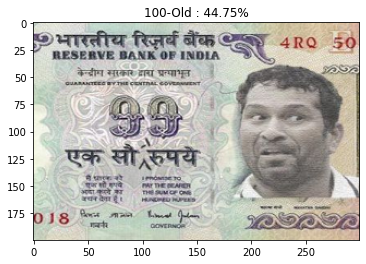

In [ ]:
test_img = cv2.imread("funny-indian-currency-6-7956-pic6.jpg")
test_img = np.squeeze(test_img)
test_img = cv2.cvtColor(test_img,cv2.COLOR_BGR2RGB)
test_img = cv2.resize(test_img,(300,200))
show_img = test_img.copy()
# test_img =  E[474]
# show_img = test_img
test_img = np.array([np.array(test_img)])

y_out = identification_model.predict(test_img)
y_out = y_out*100
index = np.argmax(y_out)
plt.imshow(show_img)
label = f"{label_list[np.argmax(y_out)]} : {y_out[0][index]:.2f}%"
plt.title(label)

## Multiple Input

https://pyimagesearch.com/2019/02/04/keras-multiple-inputs-and-mixed-data/

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, Dense, Activation, Flatten, concatenate
from tensorflow.keras.models import Model

image_input = Input((200,300,3))
x = Conv2D(32, kernel_size=8, strides=4)(image_input)
x = Flatten()(x)
x = Dense(10)(x)

vector_input = Input((200,300,1))
y = Conv2D(32, kernel_size=8, strides=4)(vector_input)
y = Flatten()(y)
y = Dense(12)(y)

z = concatenate([x, y])
z = Dense(12)(z)
z = Activation('softmax')(z)

model = Model([image_input, vector_input], [z])

In [ ]:
vggbase1 = tf.keras.applications.VGG16(input_shape=(200,300,3),weights="imagenet",include_top=False)
vggbase1.trainable = False
last_layer1 = vggbase1.output
downlayers1 = tf.keras.layers.Flatten()(last_layer1)
downlayers1 = tf.keras.layers.Dropout(0.2)(downlayers1)
downlayers1 = tf.keras.layers.Dense(256,activation='relu')(downlayers1)

inputs = tf.keras.Input((200,300,1))
last_layer2 = tf.keras.layers.Conv2D(32, (3, 3),(2,2), activation='relu', input_shape=(200, 300,3),padding="same")(inputs)
last_layer2 = tf.keras.layers.BatchNormalization()(last_layer2)
last_layer2 = tf.keras.layers.MaxPooling2D((2, 2))(last_layer2)
last_layer2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu',padding="same")(last_layer2)
last_layer2 = tf.keras.layers.BatchNormalization()(last_layer2)
last_layer2 = tf.keras.layers.MaxPooling2D((2, 2))(last_layer2)
last_layer2 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu',padding="same")(last_layer2)
last_layer2 = tf.keras.layers.BatchNormalization()(last_layer2)
last_layer2 = tf.keras.layers.MaxPooling2D((2, 2))(last_layer2)
last_layer2 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu',padding="same")(last_layer2)
last_layer2 = tf.keras.layers.BatchNormalization()(last_layer2)
last_layer2 = tf.keras.layers.MaxPooling2D((2, 2))(last_layer2)
last_layer2 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu',padding="same")(last_layer2)
last_layer2 = tf.keras.layers.BatchNormalization()(last_layer2)
last_layer2 = tf.keras.layers.MaxPooling2D((2, 2))(last_layer2)
# last_layer2 = tf.keras.layers.GlobalAveragePooling2D()(last_layer2)
last_layer2 = tf.keras.layers.Flatten()(last_layer2)
last_layer2 = tf.keras.layers.Dropout(0.2)(last_layer2)
last_layer2 = tf.keras.layers.Dense(256, activation='relu')(last_layer2)


# z = concatenate([x, y])
# z = Dense(12)(z)
# z = Activation('softmax')(z)
downlayers = tf.keras.layers.concatenate([downlayers1, last_layer2])
downlayers = tf.keras.layers.Dense(256, activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(128, activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(32, activation='relu')(downlayers)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

model = Model([vggbase1.input,inputs], [downlayers])

# vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

# vgg16.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 200, 300, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 200, 300, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [ ]:
model.compile(loss = keras.losses.sparse_categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=['accuracy'])

In [ ]:
modelhis = model.fit([X,X1],Y,batch_size=32,validation_data=([A,A1],B),epochs=20,shuffle=True)

Epoch 1/20
241/241 [==============================] - 83s 246ms/step - loss: 2.6677 - accuracy: 0.1460 - val_loss: 2.1448 - val_accuracy: 0.2109
Epoch 2/20
241/241 [==============================] - 57s 237ms/step - loss: 2.0672 - accuracy: 0.2429 - val_loss: 1.7595 - val_accuracy: 0.3400
Epoch 3/20
241/241 [==============================] - 57s 236ms/step - loss: 1.8271 - accuracy: 0.3186 - val_loss: 1.6501 - val_accuracy: 0.3424
Epoch 4/20
241/241 [==============================] - 55s 230ms/step - loss: 1.7115 - accuracy: 0.3386 - val_loss: 1.5645 - val_accuracy: 0.3758
Epoch 5/20
241/241 [==============================] - 57s 236ms/step - loss: 1.6036 - accuracy: 0.3904 - val_loss: 1.4276 - val_accuracy: 0.4758
Epoch 6/20
241/241 [==============================] - 56s 231ms/step - loss: 1.3091 - accuracy: 0.5147 - val_loss: 0.9701 - val_accuracy: 0.6491
Epoch 7/20
241/241 [==============================] - 57s 236ms/step - loss: 0.9222 - accuracy: 0.6697 - val_loss: 0.7023 - val_ac

In [ ]:
model.evaluate([E,E1],F)

52/52 [==============================] - 9s 172ms/step - loss: 0.3200 - accuracy: 0.8794


[0.32000207901000977, 0.8793939352035522]

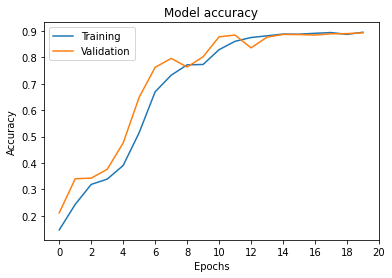

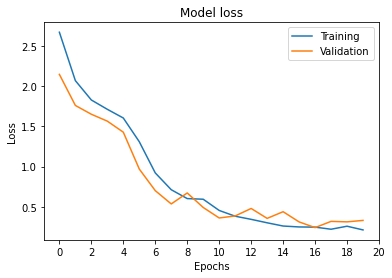


Testing: 
Loss = 0.32000207901000977 
Accuracy = 87.9394

              precision    recall  f1-score   support

           0       0.95      1.00      0.97       150
           1       0.98      0.97      0.98       150
           2       1.00      0.94      0.97       150
           3       0.00      0.00      0.00       150
           4       0.99      0.96      0.97       150
           5       0.96      0.94      0.95       150
           6       0.91      1.00      0.96       150
           7       1.00      0.93      0.96       150
           8       0.98      0.95      0.97       150
           9       0.48      0.99      0.65       150
          10       1.00      0.99      1.00       150

    accuracy                           0.88      1650
   macro avg       0.84      0.88      0.85      1650
weighted avg       0.84      0.88      0.85      1650



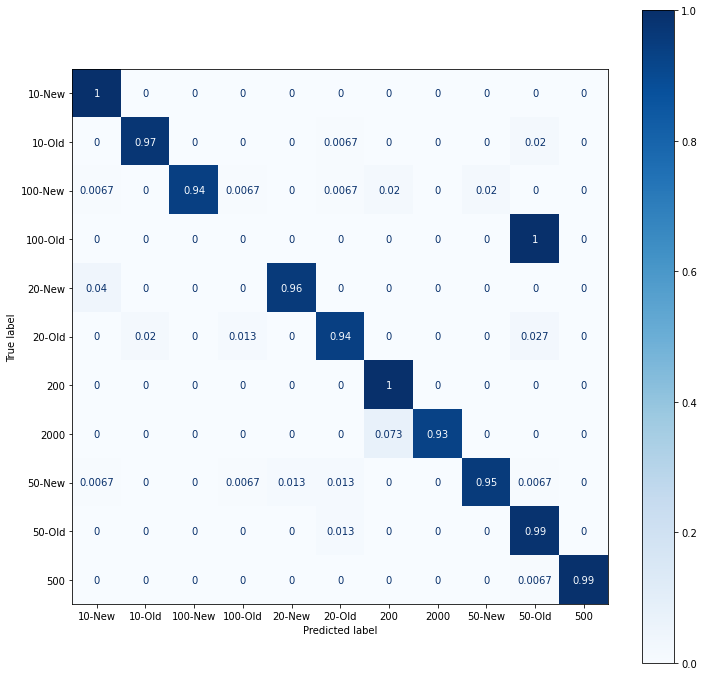

In [ ]:
BigModel = ModelAnalysis(model,[([X,X1],Y),([A,A1],B),([E,E1],F)],modelhis)
BigModel.postAnalysis()

In [ ]:
modelhis = model.fit([X,X1],Y,batch_size=32,validation_data=([A,A1],B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 63s 238ms/step - loss: 2.5079 - accuracy: 0.2427 - val_loss: 1.5148 - val_accuracy: 0.4564
Epoch 2/10
241/241 [==============================] - 57s 235ms/step - loss: 1.1456 - accuracy: 0.5858 - val_loss: 0.4107 - val_accuracy: 0.8739
Epoch 3/10
241/241 [==============================] - 57s 236ms/step - loss: 0.4992 - accuracy: 0.8378 - val_loss: 0.2159 - val_accuracy: 0.9315
Epoch 4/10
241/241 [==============================] - 57s 236ms/step - loss: 0.2666 - accuracy: 0.9199 - val_loss: 0.1781 - val_accuracy: 0.9552
Epoch 5/10
241/241 [==============================] - 57s 236ms/step - loss: 0.1915 - accuracy: 0.9406 - val_loss: 0.1873 - val_accuracy: 0.9667
Epoch 6/10
241/241 [==============================] - 57s 238ms/step - loss: 0.1868 - accuracy: 0.9586 - val_loss: 0.1646 - val_accuracy: 0.9636
Epoch 7/10
241/241 [==============================] - 57s 235ms/step - loss: 0.0988 - accuracy: 0.9735 - val_loss: 0.1285 - val_ac

In [ ]:
model.evaluate([E,E1],F)

52/52 [==============================] - 9s 170ms/step - loss: 0.3776 - accuracy: 0.9485


[0.37762776017189026, 0.9484848380088806]

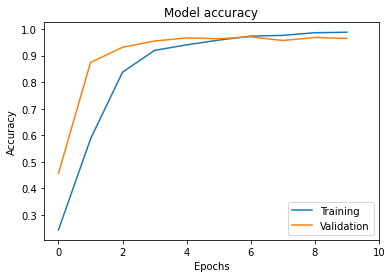

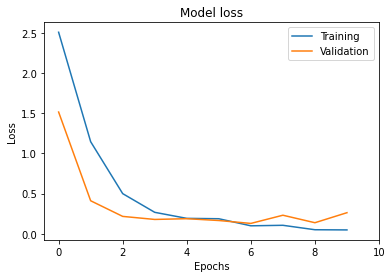


Testing: 
Loss = 0.37762776017189026 
Accuracy = 94.8485

              precision    recall  f1-score   support

           0       0.94      0.96      0.95       150
           1       1.00      0.93      0.97       150
           2       0.99      0.99      0.99       150
           3       0.80      1.00      0.89       150
           4       0.92      0.97      0.95       150
           5       0.93      0.95      0.94       150
           6       0.94      0.97      0.95       150
           7       0.99      0.95      0.97       150
           8       1.00      0.87      0.93       150
           9       1.00      0.83      0.91       150
          10       0.99      0.99      0.99       150

    accuracy                           0.95      1650
   macro avg       0.95      0.95      0.95      1650
weighted avg       0.95      0.95      0.95      1650



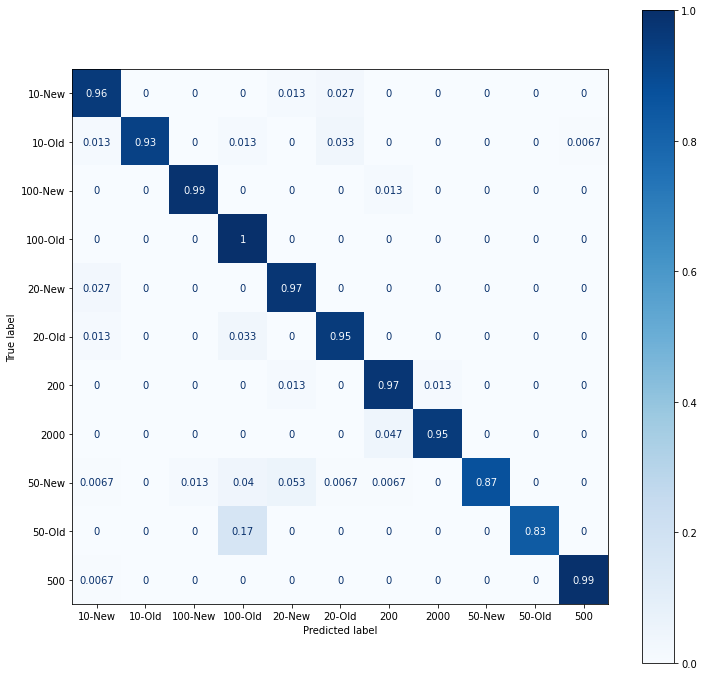

In [ ]:
BigModel = ModelAnalysis(model,[([X,X1],Y),([A,A1],B),([E,E1],F)],modelhis)
BigModel.postAnalysis()

In [ ]:
modelhis = model.fit([X,X1],Y,batch_size=32,validation_data=([A,A1],B),epochs=5,shuffle=True)

Epoch 1/5
241/241 [==============================] - 56s 232ms/step - loss: 0.4100 - accuracy: 0.8440 - val_loss: 0.2781 - val_accuracy: 0.8582
Epoch 2/5
241/241 [==============================] - 55s 230ms/step - loss: 0.3169 - accuracy: 0.8816 - val_loss: 0.2297 - val_accuracy: 0.9394
Epoch 3/5
241/241 [==============================] - 56s 232ms/step - loss: 0.2374 - accuracy: 0.9212 - val_loss: 0.1815 - val_accuracy: 0.9539
Epoch 4/5
241/241 [==============================] - 56s 232ms/step - loss: 0.1633 - accuracy: 0.9479 - val_loss: 0.1468 - val_accuracy: 0.9667
Epoch 5/5
241/241 [==============================] - 77s 322ms/step - loss: 0.1148 - accuracy: 0.9648 - val_loss: 0.2483 - val_accuracy: 0.9564


In [ ]:
modelhis = model.fit([X,X1],Y,batch_size=32,validation_data=([A,A1],B),epochs=10,shuffle=True)

Epoch 1/10
241/241 [==============================] - 89s 322ms/step - loss: 1.6810 - accuracy: 0.7243 - val_loss: 0.4091 - val_accuracy: 0.8806
Epoch 2/10
241/241 [==============================] - 63s 263ms/step - loss: 0.3503 - accuracy: 0.8961 - val_loss: 0.4037 - val_accuracy: 0.9115
Epoch 3/10
241/241 [==============================] - 63s 262ms/step - loss: 0.2852 - accuracy: 0.9249 - val_loss: 0.2457 - val_accuracy: 0.9412
Epoch 4/10
241/241 [==============================] - 63s 263ms/step - loss: 0.2246 - accuracy: 0.9374 - val_loss: 0.2579 - val_accuracy: 0.9303
Epoch 5/10
241/241 [==============================] - 64s 268ms/step - loss: 0.1797 - accuracy: 0.9543 - val_loss: 0.4923 - val_accuracy: 0.9182
Epoch 6/10
241/241 [==============================] - 63s 263ms/step - loss: 0.1569 - accuracy: 0.9600 - val_loss: 0.4569 - val_accuracy: 0.9145
Epoch 7/10
241/241 [==============================] - 63s 262ms/step - loss: 0.1982 - accuracy: 0.9535 - val_loss: 0.4249 - val_ac

In [ ]:
model.evaluate([E,E1],F)

52/52 [==============================] - 9s 173ms/step - loss: 0.2782 - accuracy: 0.9533


[0.2781989872455597, 0.95333331823349]

In [ ]:
model.evaluate([E,E1],F)

52/52 [==============================] - 9s 171ms/step - loss: 0.1609 - accuracy: 0.9655


[0.1609071046113968, 0.9654545187950134]

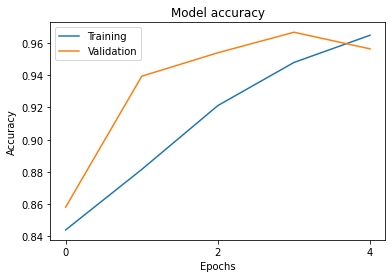

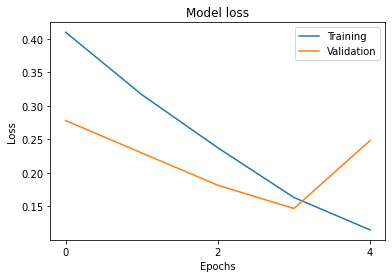


Testing: 
Loss = 0.1609071046113968 
Accuracy = 96.5455

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       150
           1       0.93      0.94      0.94       150
           2       0.99      0.99      0.99       150
           3       0.92      0.97      0.94       150
           4       0.99      0.98      0.99       150
           5       0.92      0.99      0.95       150
           6       0.96      0.95      0.95       150
           7       0.92      0.99      0.96       150
           8       1.00      0.96      0.98       150
           9       1.00      0.87      0.93       150
          10       1.00      0.99      1.00       150

    accuracy                           0.97      1650
   macro avg       0.97      0.97      0.97      1650
weighted avg       0.97      0.97      0.97      1650



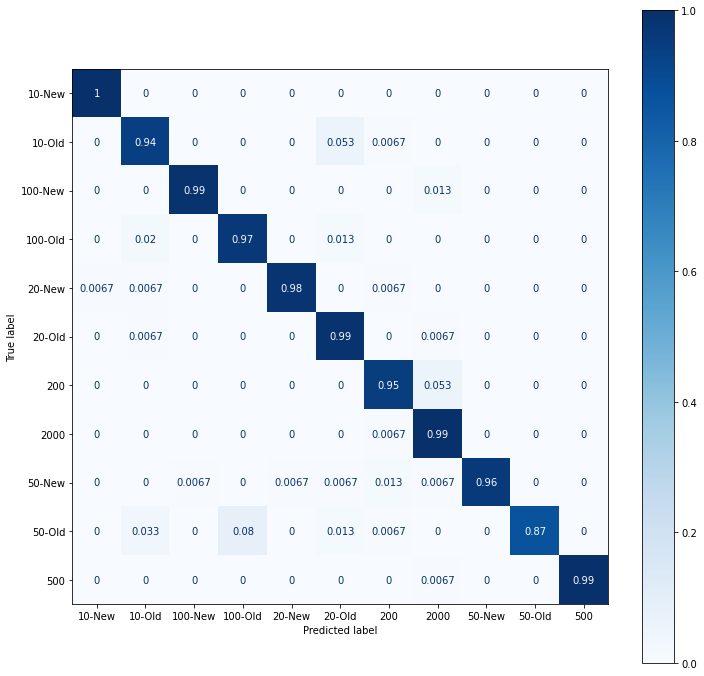

In [ ]:
BigModel = ModelAnalysis(model,[([X,X1],Y),([A,A1],B),([E,E1],F)],modelhis)
BigModel.postAnalysis()

In [ ]:
BigModel = ModelAnalysis(model,[([X,X1],Y),([A,A1],B),([E,E1],F)],modelhis)

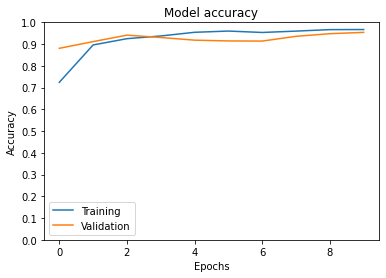

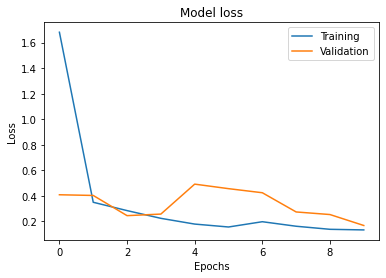


Testing: 
Loss = 0.2781989872455597 
Accuracy = 95.3333

              precision    recall  f1-score   support

           0       0.93      0.99      0.96       150
           1       0.97      0.92      0.94       150
           2       0.96      1.00      0.98       150
           3       0.92      0.97      0.94       150
           4       0.97      0.93      0.95       150
           5       0.99      0.93      0.96       150
           6       0.96      0.91      0.94       150
           7       0.94      0.99      0.96       150
           8       0.99      1.00      0.99       150
           9       0.90      0.93      0.92       150
          10       0.99      0.91      0.94       150

    accuracy                           0.95      1650
   macro avg       0.95      0.95      0.95      1650
weighted avg       0.95      0.95      0.95      1650



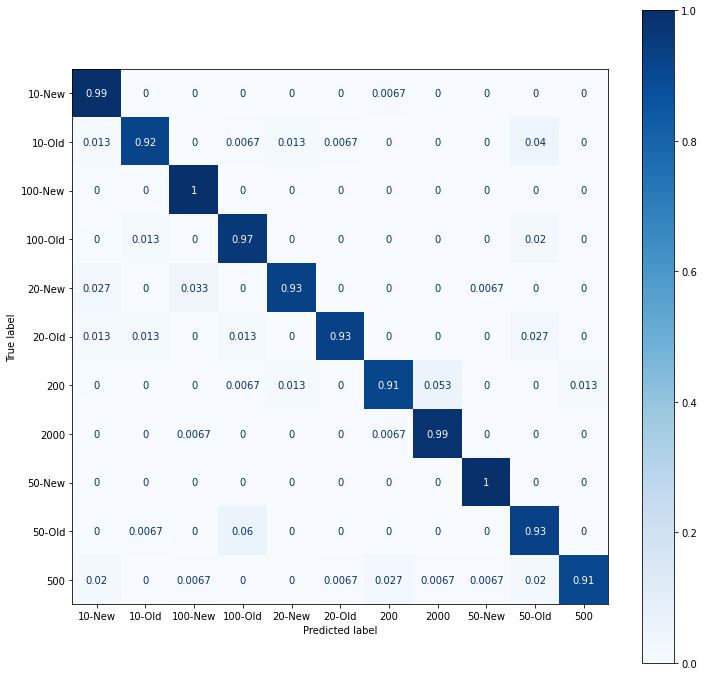

In [ ]:
# Big model 2:1 ratio analysis
BigModel.postAnalysis()

In [ ]:

def GradCam(model, img_array, layer_name, eps=1e-8):
  '''
  Creates a grad-cam heatmap given a model and a layer name contained with that model
  

  Args:
    model: tf model
    img_array: (img_width x img_width) numpy array
    layer_name: str


  Returns 
    uint8 numpy array with shape (img_height, img_width)

  '''

  gradModel = Model(
    inputs=[model.inputs],
    outputs=[model.get_layer(layer_name).output,
      model.output])
  
  with tf.GradientTape() as tape:
    # cast the image tensor to a float-32 data type, pass the
    # image through the gradient model, and grab the loss
    # associated with the specific class index
    inputs = tf.cast(img_array, tf.float32)
    (convOutputs, predictions) = gradModel(inputs)
    loss = predictions[:, 0]
  # use automatic differentiation to compute the gradients
  grads = tape.gradient(loss, convOutputs)
  
  # compute the guided gradients
  castConvOutputs = tf.cast(convOutputs > 0, "float32")
  castGrads = tf.cast(grads > 0, "float32")
  guidedGrads = castConvOutputs * castGrads * grads
  # the convolution and guided gradients have a batch dimension
  # (which we don't need) so let's grab the volume itself and
  # discard the batch
  convOutputs = convOutputs[0]
  guidedGrads = guidedGrads[0]
  # compute the average of the gradient values, and using them
  # as weights, compute the ponderation of the filters with
  # respect to the weights
  weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
  cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)

  # grab the spatial dimensions of the input image and resize
  # the output class activation map to match the input image
  # dimensions
  (w, h) = (img_array.shape[2], img_array.shape[1])
  heatmap = cv2.resize(cam.numpy(), (w, h))
  # normalize the heatmap such that all values lie in the range
  # [0, 1], scale the resulting values to the range [0, 255],
  # and then convert to an unsigned 8-bit integer
  numer = heatmap - np.min(heatmap)
  denom = (heatmap.max() - heatmap.min()) + eps
  heatmap = numer / denom
  # heatmap = (heatmap * 255).astype("uint8")
  # return the resulting heatmap to the calling function
  return heatmap

def sigmoid(x, a, b, c):
  return c / (1 + np.exp(-a * (x-b)))

def superimpose(img_bgr, cam, thresh, emphasize=False):
  
  '''
  Superimposes a grad-cam heatmap onto an image for model interpretation and visualization.
  

  Args:
    image: (img_width x img_height x 3) numpy array
    grad-cam heatmap: (img_width x img_width) numpy array
    threshold: float
    emphasize: boolean

  Returns 
    uint8 numpy array with shape (img_height, img_width, 3)

  '''
  heatmap = cv2.resize(cam, (img_bgr.shape[1], img_bgr.shape[0]))
  if emphasize:
      heatmap = sigmoid(heatmap, 50, thresh, 1)
  heatmap = np.uint8(255 * heatmap)
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
  
  hif = .8
  superimposed_img = heatmap * hif + img_bgr
  superimposed_img = np.minimum(superimposed_img, 255.0).astype(np.uint8)  # scale 0 to 255  
  superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
  
  return superimposed_img_rgb

activation_layers = ['block1_conv1']
rnd = 100
eps = 0.5
img = E[rnd]
# img = E1[rnd]
try:
    plt.figure(figsize=(15, 15))
    for i, layer in enumerate(activation_layers):
      grad_cam = GradCam(model, np.expand_dims(img, axis=0), layer)
      ax = plt.subplot(7, 5, i +1)
      plt.imshow(grad_cam)
      plt.title(layer)
      plt.axis("off")
      plt.tight_layout()

      plt.figure(figsize=(15, 15))
      for i, layer in enumerate(activation_layers):
        grad_cam = GradCam(model, np.expand_dims(img, axis=0), layer)
        grad_cam_emphasized = superimpose(cv2.cvtColor(img,cv2.COLOR_BGR2RGB), grad_cam, eps, emphasize=True)
        ax = plt.subplot(7, 5, i +1)
        plt.imshow(grad_cam_emphasized)
        plt.title(layer)
        plt.axis("off")
      plt.tight_layout()
except Exception as e:
  print(e)

NameError: ignored

In [ ]:
rnd = 100
samples = 100
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance([E[rnd],E1[rnd]], model.predict,top_labels=3, hide_color=0, num_samples=samples)
temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))
ax1.axis('off')
ax2.axis('off')

AttributeError: ignored

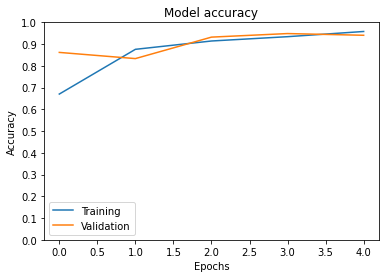

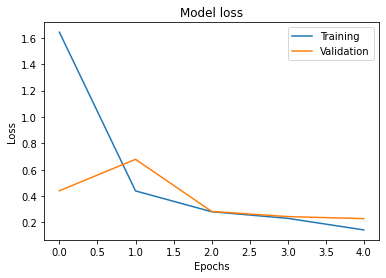


Testing: 
Loss = 0.215885728597641 
Accuracy = 94.5455

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       150
           1       0.82      0.93      0.87       150
           2       0.97      1.00      0.98       150
           3       0.93      0.75      0.83       150
           4       1.00      0.97      0.99       150
           5       0.96      0.91      0.94       150
           6       0.99      0.94      0.97       150
           7       0.97      0.99      0.98       150
           8       1.00      0.96      0.98       150
           9       0.85      0.98      0.91       150
          10       0.95      0.96      0.96       150

    accuracy                           0.95      1650
   macro avg       0.95      0.95      0.95      1650
weighted avg       0.95      0.95      0.95      1650



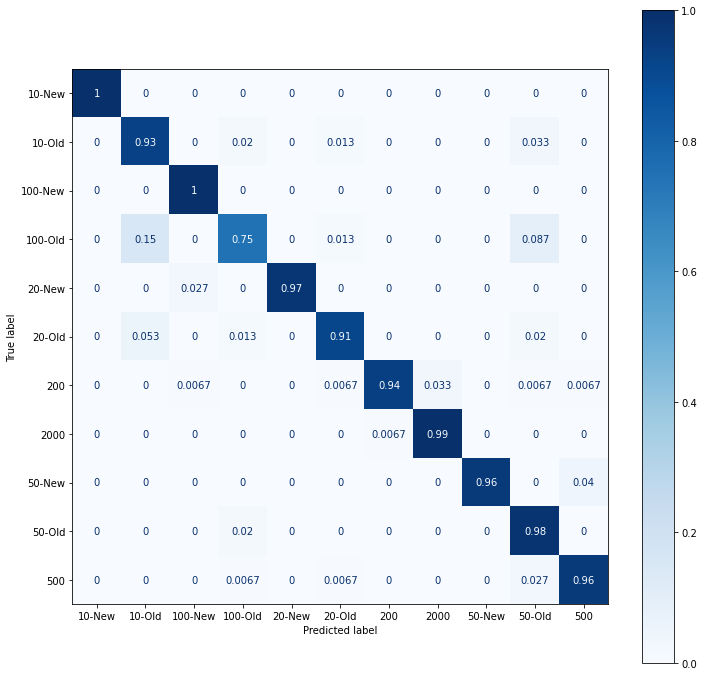

In [ ]:
# Big model 2:1 ratio analysis
BigModel.postAnalysis()

In [ ]:
BigModel.saveModel('BigModel-10')

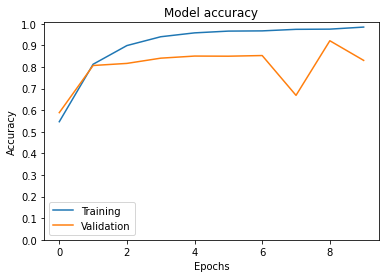

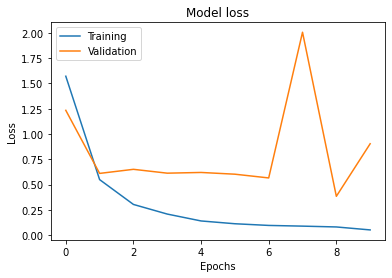


Testing: 
Loss = 0.6926901340484619 
Accuracy = 86.0000

              precision    recall  f1-score   support

           0       1.00      0.97      0.99       150
           1       1.00      0.77      0.87       150
           2       0.97      0.97      0.97       150
           3       0.91      0.85      0.88       150
           4       0.99      0.95      0.97       150
           5       0.64      0.95      0.76       150
           6       1.00      0.35      0.51       150
           7       0.55      1.00      0.71       150
           8       0.99      0.98      0.99       150
           9       0.99      0.77      0.86       150
          10       0.95      0.91      0.93       150

    accuracy                           0.86      1650
   macro avg       0.91      0.86      0.86      1650
weighted avg       0.91      0.86      0.86      1650



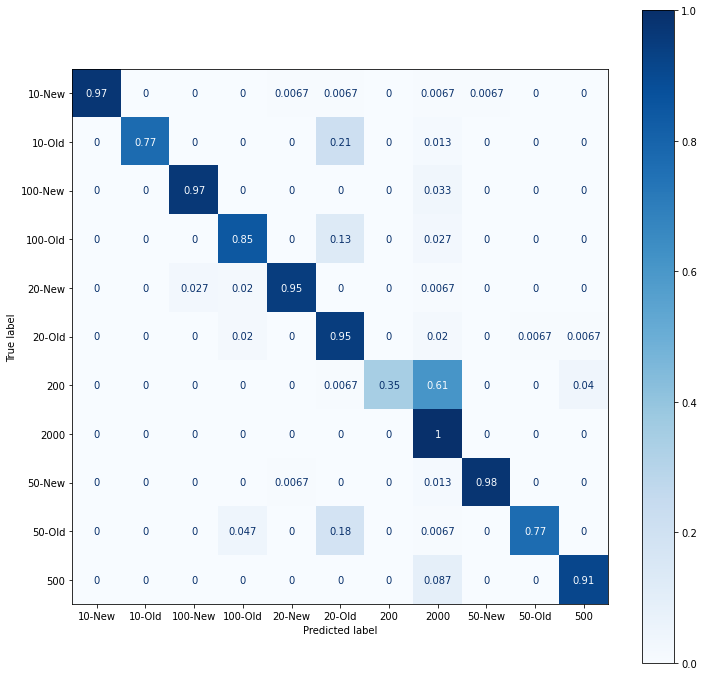

In [ ]:
# Big model 1:1 ratio analysis
BigModel.postAnalysis()

In [ ]:
modddel = 

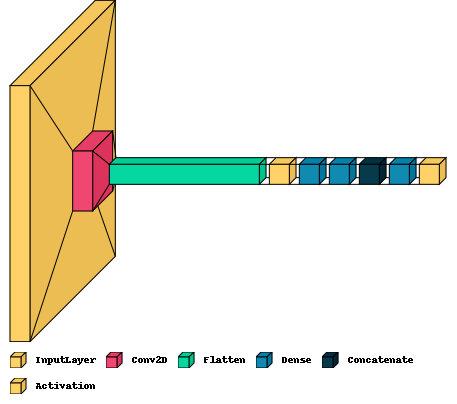

In [ ]:
visualkeras.layered_view(model, legend=True,max_z=150)

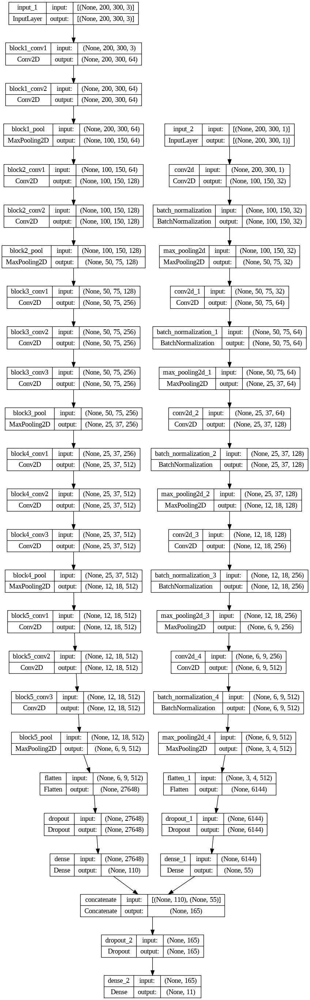

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

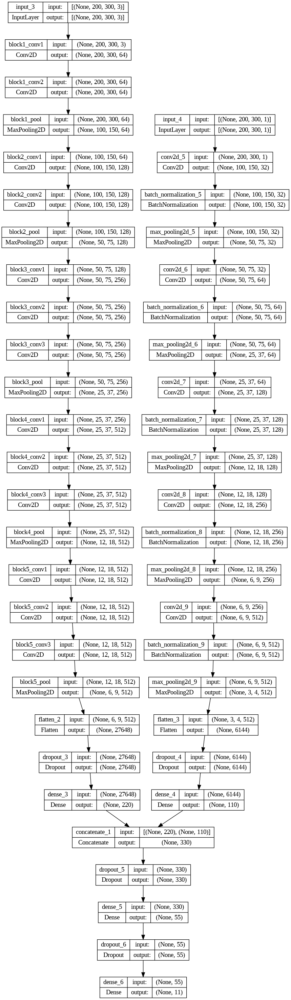

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True)

In [ ]:
from numpy import array
from sklearn.model_selection import KFold
import time

In [ ]:
# random.shuffle(dataset)
test_dataset = []
per = 500
classes_count = 11
for i in range(0,classes_count):
  for i in dataset[i*1000:(i*1000+per)]:
    test_dataset.append(i)

random.shuffle(test_dataset)

feature = [np.array(i[0]) for i in test_dataset]
label = [np.array(i[1]) for i in test_dataset]

X = np.array([np.array(val) for val in feature])
Y = np.array(label)

In [ ]:
kfold = KFold(5)

for train_index, test_index in kfold.split(X):
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = Y[train_index], Y[test_index]
  # print('train: %s, test: %s' % (len(X_train), len(X_test)))

  cnn_model = keras.Sequential()
  cnn_model.add(layers.Conv2D(32, (3, 3),(2,2), activation='relu', input_shape=(200, 300,3),padding="same"))
  cnn_model.add(layers.BatchNormalization())
  cnn_model.add(layers.MaxPooling2D((2, 2)))
  cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu',padding="same"))
  cnn_model.add(layers.BatchNormalization())
  cnn_model.add(layers.MaxPooling2D((2, 2)))
  cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu',padding="same"))
  cnn_model.add(layers.BatchNormalization())
  cnn_model.add(layers.MaxPooling2D((2, 2)))
  cnn_model.add(layers.Conv2D(256, (3, 3), activation='relu',padding="same"))
  cnn_model.add(layers.BatchNormalization())
  cnn_model.add(layers.MaxPooling2D((2, 2)))
  cnn_model.add(layers.Conv2D(512, (3, 3), activation='relu',padding="same"))
  cnn_model.add(layers.BatchNormalization())
  cnn_model.add(layers.MaxPooling2D((2, 2)))
  cnn_model.add(layers.GlobalAveragePooling2D())
  cnn_model.add(layers.Dense(180, activation='relu'))
  cnn_model.add(layers.Dropout(0.2))
  cnn_model.add(layers.Dense(90, activation='relu'))
  cnn_model.add(layers.Dropout(0.2))
  cnn_model.add(layers.Dense(48, activation='relu'))
  cnn_model.add(layers.Dropout(0.2))
  cnn_model.add(layers.Dense(12, activation='softmax'))

  cnn_model.compile(loss = keras.losses.sparse_categorical_crossentropy, optimizer= 'adam', metrics=['accuracy'])

  fit_model = cnn_model.fit(X_train,y_train,batch_size=32,epochs=10,shuffle=True,verbose=0)

  results = cnn_model.evaluate(X_test, y_test, batch_size=32,verbose=0)
  print(results)

[0.35693368315696716, 0.9009090662002563]


In [ ]:
from lime import lime_image

explainer = lime_image.LimeImageExplainer()

In [ ]:
explanation = explainer.explain_instance(E[200], vgg16.predict,top_labels=3, hide_color=0, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


(-0.5, 299.5, 199.5, -0.5)

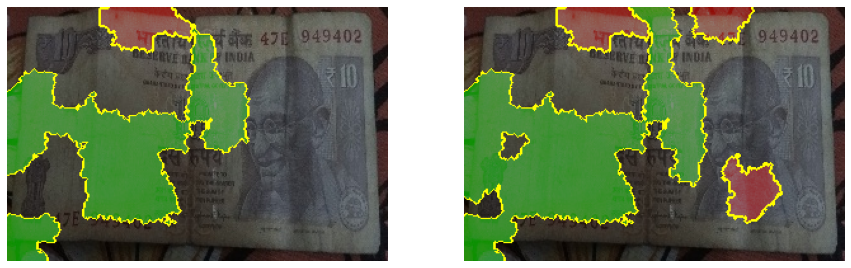

In [ ]:
from skimage.segmentation import mark_boundaries

temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=5, hide_rest=False)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))
ax1.axis('off')
ax2.axis('off')

## Random Forest

https://github.com/bnsreenu/python_for_microscopists/blob/master/158b_transfer_learning_using_CNN_weights_VGG16_RF.py


In [ ]:
vggbase1 = tf.keras.applications.VGG16(input_shape=(200,300,3),weights="imagenet",include_top=False)
vggbase1.trainable = False

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
vggbase1.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0     

In [ ]:
test_labels = F.ravel()
train_labels = Y.ravel()

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(test_labels)
test_labels_encoded = le.transform(test_labels)
le.fit(train_labels)
train_labels_encoded = le.transform(train_labels)

In [ ]:
x_train, y_train, x_test, y_test = X, train_labels_encoded, E, test_labels_encoded

In [ ]:
from keras.utils import to_categorical
y_train_one_hot = to_categorical(y_train)
y_test_one_hot = to_categorical(y_test)

In [ ]:
feature_extractor=vggbase1.predict(x_train)

241/241 [==============================] - 48s 153ms/step


In [ ]:
features = feature_extractor.reshape(feature_extractor.shape[0], -1)

X_for_RF = features #This is our X input to RF

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RF_model = RandomForestClassifier(n_estimators = 110, random_state = 8)

In [ ]:
RF_model.fit(X_for_RF, y_train)

RandomForestClassifier(n_estimators=110, random_state=8)

In [ ]:
X_test_feature = vggbase1.predict(x_test)
X_test_features = X_test_feature.reshape(X_test_feature.shape[0], -1)

52/52 [==============================] - 10s 191ms/step


In [ ]:
prediction_RF = RF_model.predict(X_test_features)
#Inverse le transform to get original label back. 
prediction_RF = le.inverse_transform(prediction_RF)

Accuracy =  0.9084848484848485


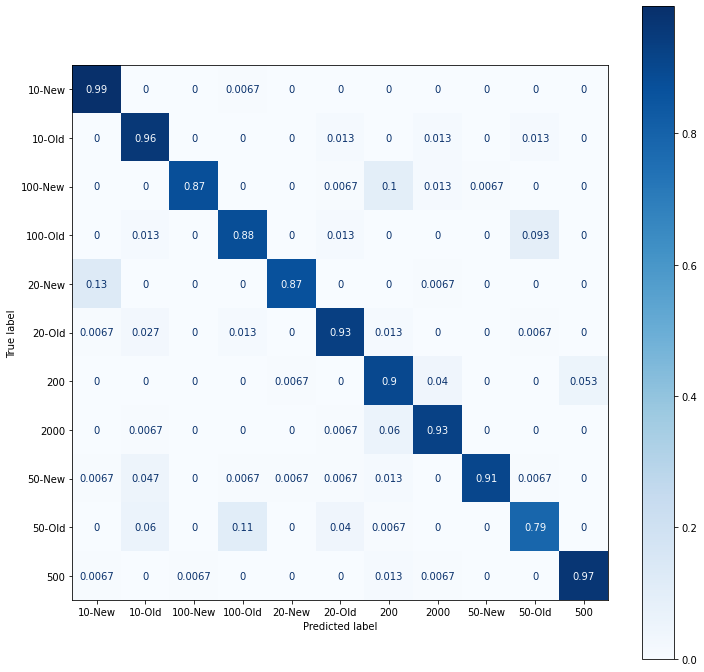

In [ ]:
from sklearn import metrics
import seaborn as sns
print ("Accuracy = ", metrics.accuracy_score(test_labels, prediction_RF))

#Confusion Matrix - verify accuracy of each class
from sklearn.metrics import confusion_matrix

# ConfusionMatrixDisplay
# cm = ConfusionMatrixDisplay(test_labels, prediction_RF,display_labels=label_list)
ConfusionMatrixDisplay.from_predictions(test_labels,prediction_RF,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize= (12,12))[1])
#print(cm)
# sns.heatmap(cm, annot=True)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RF_model1 = RandomForestClassifier(n_estimators = 220, random_state = 8)
RF_model1.fit(X_for_RF, y_train)

RandomForestClassifier(n_estimators=220, random_state=8)

In [ ]:
prediction_RF1 = RF_model1.predict(X_test_features)
#Inverse le transform to get original label back. 
prediction_RF1 = le.inverse_transform(prediction_RF1)

In [ ]:
X_test_feature = vggbase1.predict(x_test)
X_test_features = X_test_feature.reshape(X_test_feature.shape[0], -1)

52/52 [==============================] - 8s 161ms/step


Accuracy =  0.9206060606060606


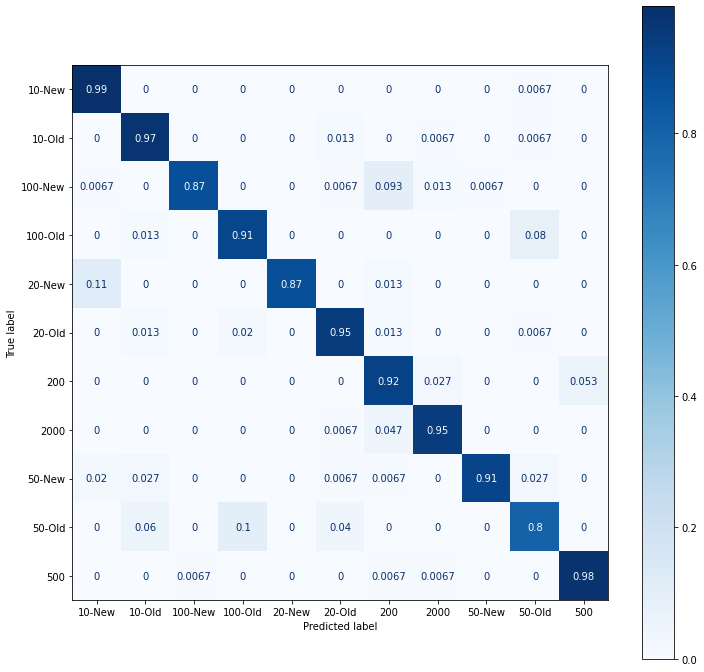

In [ ]:
from sklearn import metrics
import seaborn as sns
print ("Accuracy = ", metrics.accuracy_score(test_labels, prediction_RF1))

#Confusion Matrix - verify accuracy of each class
from sklearn.metrics import confusion_matrix
ConfusionMatrixDisplay.from_predictions(test_labels,prediction_RF1,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize= (12,12))[1])

## Random Forest with Global average

https://github.com/bnsreenu/python_for_microscopists/blob/master/158b_transfer_learning_using_CNN_weights_VGG16_RF.py


In [ ]:
vggbase1 = tf.keras.applications.VGG16(input_shape=(200,300,3),weights="imagenet",include_top=False)
vggbase1.trainable = False

In [ ]:
vggbase1.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0     

In [ ]:
last_layer = vggbase1.output

downlayers = tf.keras.layers.GlobalAveragePooling2D()(last_layer)
# downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
# downlayers = tf.keras.layers.Dense(55,activation='relu')(downlayers)

vgg16 = Model(inputs=vggbase1.input, outputs=downlayers)

In [ ]:
vgg16.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0   

In [ ]:
test_labels = F.ravel()
train_labels = Y.ravel()

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(test_labels)
test_labels_encoded = le.transform(test_labels)
le.fit(train_labels)
train_labels_encoded = le.transform(train_labels)

In [ ]:
x_train, y_train, x_test, y_test = X, train_labels_encoded, E, test_labels_encoded

In [ ]:
from keras.utils import to_categorical
y_train_one_hot = to_categorical(y_train)
y_test_one_hot = to_categorical(y_test)

In [ ]:
feature_extractor=vgg16.predict(x_train)

241/241 [==============================] - 47s 197ms/step


In [ ]:
features = feature_extractor.reshape(feature_extractor.shape[0], -1)

X_for_RF = features #This is our X input to RF

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RF_model = RandomForestClassifier(n_estimators = 110, random_state = 8)

In [ ]:
RF_model.fit(X_for_RF, y_train)

RandomForestClassifier(n_estimators=110, random_state=8)

In [ ]:
X_test_feature = vgg16.predict(x_test)
X_test_features = X_test_feature.reshape(X_test_feature.shape[0], -1)

52/52 [==============================] - 9s 184ms/step


In [ ]:
prediction_RF = RF_model.predict(X_test_features)
#Inverse le transform to get original label back. 
prediction_RF = le.inverse_transform(prediction_RF)

Accuracy =  0.923030303030303


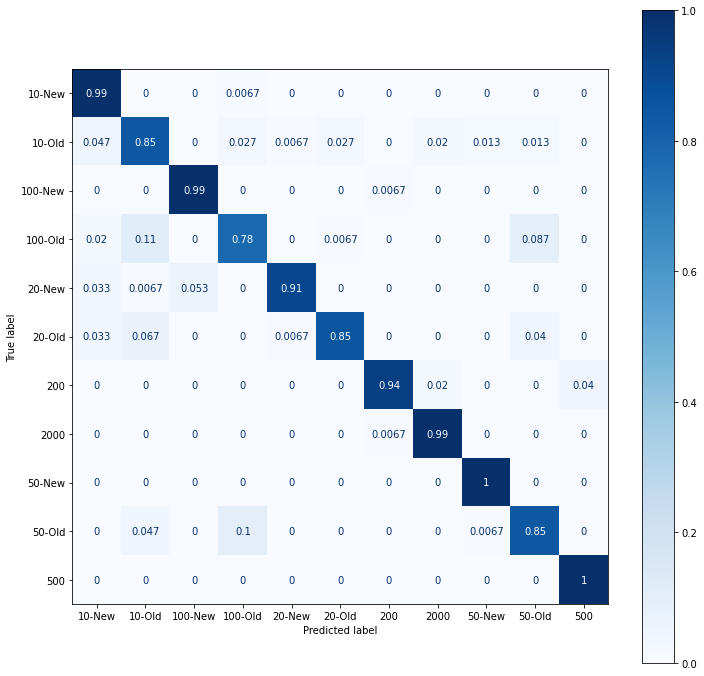

In [ ]:
from sklearn import metrics
import seaborn as sns
print ("Accuracy = ", metrics.accuracy_score(test_labels, prediction_RF))

#Confusion Matrix - verify accuracy of each class
from sklearn.metrics import confusion_matrix

# ConfusionMatrixDisplay
# cm = ConfusionMatrixDisplay(test_labels, prediction_RF,display_labels=label_list)
ConfusionMatrixDisplay.from_predictions(test_labels,prediction_RF,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize= (12,12))[1])
#print(cm)
# sns.heatmap(cm, annot=True)

## Edge mashing

In [ ]:
from google.colab.patches import cv2_imshow

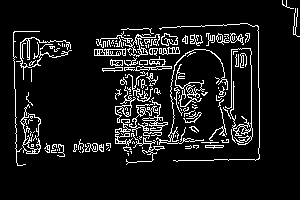

-1

In [ ]:
edges = cv2.Canny(image=E[5], threshold1=100, threshold2=200) 
 
# Display Canny Edge Detection Image
cv2_imshow(edges)
cv2.waitKey(0)

In [ ]:
test = cv2.cvtColor(E[5], cv2.COLOR_RGB2GRAY)

In [ ]:
edges3d = cv2.cvtColor(edges,cv2.COLOR_GRAY2RGB)

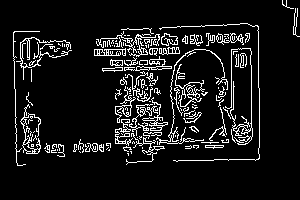

In [ ]:
cv2_imshow(edges3d)

In [ ]:
dst3d = cv2.addWeighted(E[5], 1, edges3d, 0.5, 2)
dst3d = cv2.cvtColor(dst3d,cv2.COLOR_BGR2RGB)

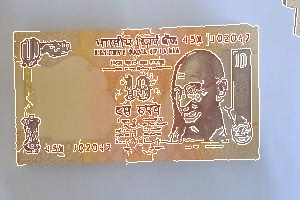

In [ ]:
cv2_imshow(dst3d)

## Edge data feed models

https://towardsdatascience.com/easy-method-of-edge-detection-in-opencv-python-db26972deb2d

In [ ]:
def auto_canny_edge_detection(image, sigma=0.33):
  md = np.median(image)
  lower_value = int(max(0, (1.0-sigma) * md))
  upper_value = int(min(255, (1.0+sigma) * md))
  return cv2.cvtColor(cv2.Canny(image, lower_value, upper_value),cv2.COLOR_GRAY2RGB)

In [ ]:
X1 = np.array([np.array(auto_canny_edge_detection(val)) for val in train_features])
A1 = np.array([np.array(auto_canny_edge_detection(val)) for val in validation_features])
E1 = np.array([np.array(auto_canny_edge_detection(val)) for val in test_features])

In [ ]:
vggbase = tf.keras.applications.VGG16(input_shape=(200,300,3),weights="imagenet",include_top=False)
vggbase.trainable = False

In [ ]:
last_layer = vggbase.output

downlayers = tf.keras.layers.Flatten()(last_layer)
downlayers = tf.keras.layers.Dropout(0.2)(downlayers)
downlayers = tf.keras.layers.Dense(11,activation='softmax')(downlayers)

vgg16 = Model(inputs=vggbase.input, outputs=downlayers)

In [ ]:
vgg16.compile(optimizer='adam',loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
vgg16fit = vgg16.fit(X1,Y,batch_size=32,validation_data=(A1,B),epochs=2,shuffle=True)

Epoch 1/2
241/241 [==============================] - 56s 227ms/step - loss: 30.4056 - accuracy: 0.0943 - val_loss: 31.5758 - val_accuracy: 0.0970
Epoch 2/2
241/241 [==============================] - 57s 235ms/step - loss: 20.7831 - accuracy: 0.2612 - val_loss: 37.2992 - val_accuracy: 0.0891


In [ ]:
vggbase1 = tf.keras.applications.VGG16(input_shape=(200,300,3),weights="imagenet",include_top=False)
vggbase1.trainable = False

In [ ]:
vggbase1.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0     

In [ ]:
test_labels = F.ravel()
train_labels = Y.ravel()

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(test_labels)
test_labels_encoded = le.transform(test_labels)
le.fit(train_labels)
train_labels_encoded = le.transform(train_labels)

In [ ]:
x_train, y_train, x_test, y_test = X1, train_labels_encoded, E1, test_labels_encoded

In [ ]:
from keras.utils import to_categorical
y_train_one_hot = to_categorical(y_train)
y_test_one_hot = to_categorical(y_test)

In [ ]:
feature_extractor=vggbase1.predict(x_train)

241/241 [==============================] - 45s 185ms/step


In [ ]:
features = feature_extractor.reshape(feature_extractor.shape[0], -1)

X_for_RF = features #This is our X input to RF

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RF_model = RandomForestClassifier(n_estimators = 110, random_state = 8)

In [ ]:
RF_model.fit(X_for_RF, y_train)

RandomForestClassifier(n_estimators=110, random_state=8)

In [ ]:
X_test_feature = vggbase1.predict(x_test)
X_test_features = X_test_feature.reshape(X_test_feature.shape[0], -1)

52/52 [==============================] - 9s 179ms/step


In [ ]:
prediction_RF = RF_model.predict(X_test_features)
#Inverse le transform to get original label back. 
prediction_RF = le.inverse_transform(prediction_RF)

Accuracy =  0.08242424242424243


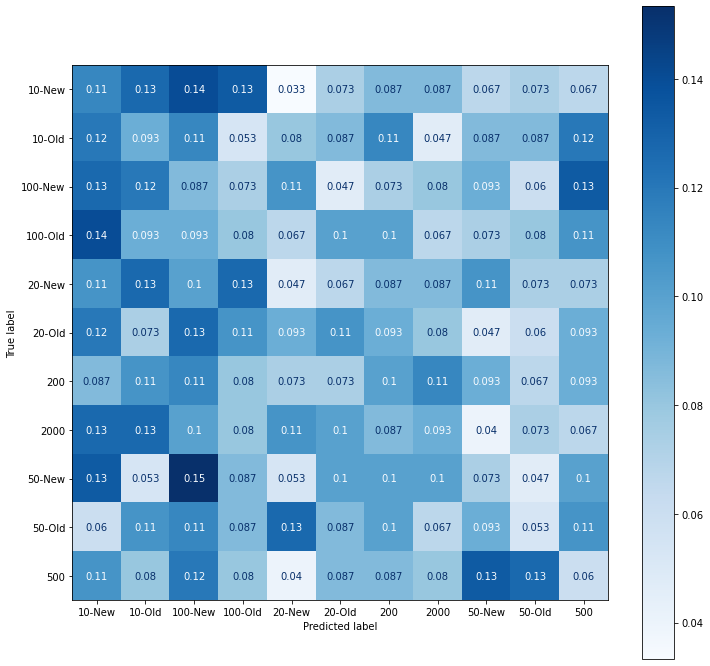

In [ ]:
from sklearn import metrics
import seaborn as sns
print ("Accuracy = ", metrics.accuracy_score(test_labels, prediction_RF))

#Confusion Matrix - verify accuracy of each class
from sklearn.metrics import confusion_matrix

# ConfusionMatrixDisplay
# cm = ConfusionMatrixDisplay(test_labels, prediction_RF,display_labels=label_list)
ConfusionMatrixDisplay.from_predictions(test_labels,prediction_RF,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize= (12,12))[1])
#print(cm)
# sns.heatmap(cm, annot=True)

## xgboost

https://github.com/bnsreenu/python_for_microscopists/blob/master/195_xgboost_for_image_classification_using_VGG16.py


In [ ]:
vggbase1 = tf.keras.applications.VGG16(input_shape=(200,300,3),weights="imagenet",include_top=False)
vggbase1.trainable = False

In [ ]:
last_layer = vggbase1.output
downlayers = tf.keras.layers.Conv2D(256, (1, 1), activation='relu',padding="same")(last_layer)
vggbase1 = Model(inputs=vggbase1.input, outputs=downlayers)

In [ ]:
vggbase1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 200, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 75, 128)       0     

In [ ]:
test_labels = F.ravel()
train_labels = Y.ravel()

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(test_labels)
test_labels_encoded = le.transform(test_labels)
le.fit(train_labels)
train_labels_encoded = le.transform(train_labels)

In [ ]:
x_train, y_train, x_test, y_test = X, train_labels_encoded, E, test_labels_encoded

In [ ]:
from keras.utils import to_categorical
y_train_one_hot = to_categorical(y_train)
y_test_one_hot = to_categorical(y_test)

In [ ]:
feature_extractor=vggbase1.predict(x_train)

241/241 [==============================] - 53s 181ms/step


In [ ]:
features = feature_extractor.reshape(feature_extractor.shape[0], -1)
X_for_training = features

In [ ]:
import xgboost as xgb
model = xgb.XGBClassifier()

In [ ]:
model.fit(X_for_training, y_train)

XGBClassifier(objective='multi:softprob')

In [ ]:
X_test_feature = vggbase1.predict(x_test)
X_test_features = X_test_feature.reshape(X_test_feature.shape[0], -1)

52/52 [==============================] - 11s 207ms/step


In [ ]:
prediction = model.predict(X_test_features)
prediction = le.inverse_transform(prediction)

Accuracy =  0.9030303030303031


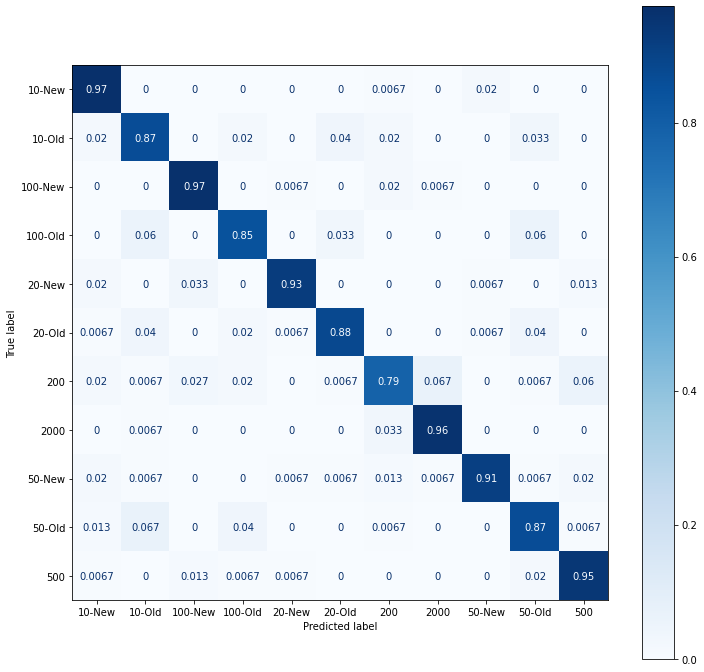

In [ ]:
from sklearn import metrics
import seaborn as sns
print ("Accuracy = ", metrics.accuracy_score(test_labels, prediction))

#Confusion Matrix - verify accuracy of each class
from sklearn.metrics import confusion_matrix

# ConfusionMatrixDisplay
# cm = ConfusionMatrixDisplay(test_labels, prediction_RF,display_labels=label_list)
ConfusionMatrixDisplay.from_predictions(test_labels,prediction,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize= (12,12))[1])
#print(cm)
# sns.heatmap(cm, annot=True)

## Load Model Test

In [ ]:
model = tf.keras.models.load_model(os.path.join(headpath,'Model','Identification-model-VGG16-Final-20Feb_model-20-Feb-2023-05-41.h5'))

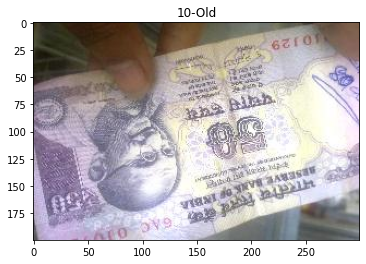

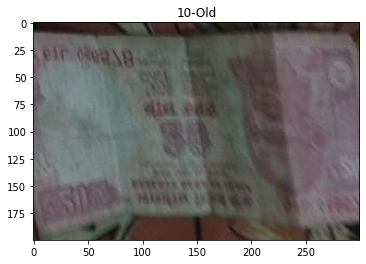

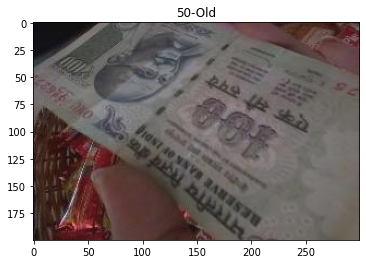

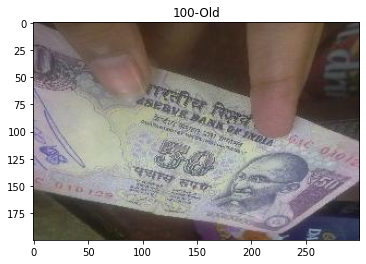

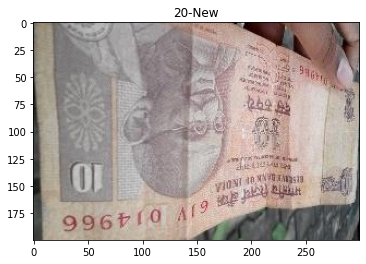

...

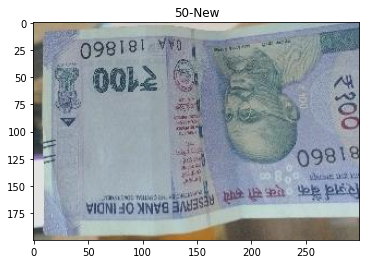

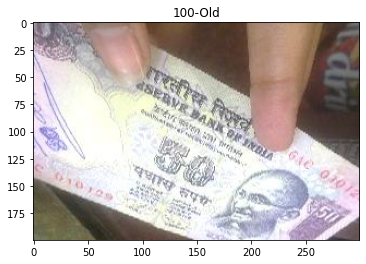

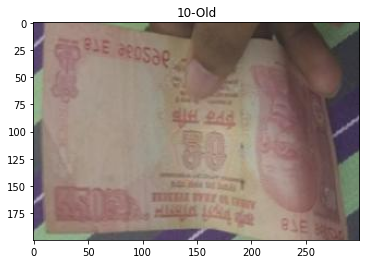

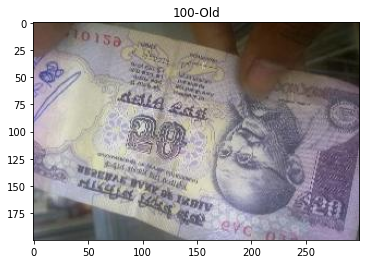

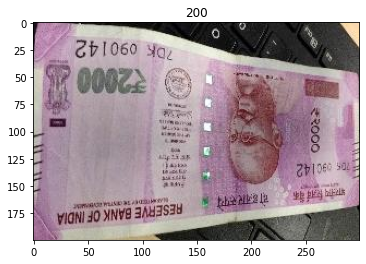

In [ ]:
for i in range(len(E)): ## vgg16-50-epoch-tf1
  try:
    image = np.array([E[i]])
    y_out = vgg16.predict([image],verbose=0)
    index = np.argmax(y_out)
    if index == F[i][0]:
      continue
    else:
      plt.figure()
      plt.imshow(E[i])
      label = f"{label_list[index]}"
      plt.title(label)
      plt.show()
  except Exception as e:
    print(e)
    break

In [ ]:
E[0].shape

(200, 300, 3)

              precision    recall  f1-score   support

           0       0.93      0.99      0.96       150
           1       0.97      0.92      0.94       150
           2       0.96      1.00      0.98       150
           3       0.92      0.97      0.94       150
           4       0.97      0.93      0.95       150
           5       0.99      0.93      0.96       150
           6       0.96      0.91      0.94       150
           7       0.94      0.99      0.96       150
           8       0.99      1.00      0.99       150
           9       0.90      0.93      0.92       150
          10       0.99      0.91      0.94       150

    accuracy                           0.95      1650
   macro avg       0.95      0.95      0.95      1650
weighted avg       0.95      0.95      0.95      1650



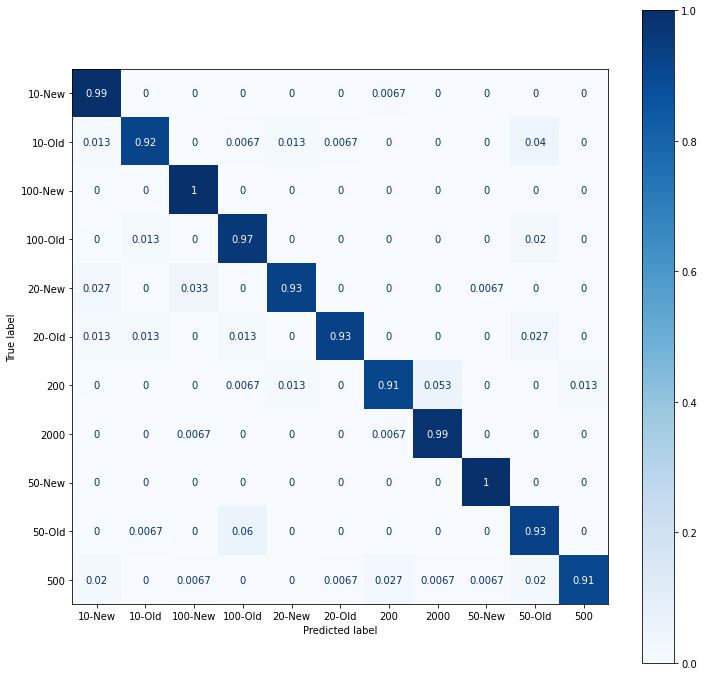

In [ ]:
predictions = model.predict((E,E1),verbose=0)
predictions = np.argmax(predictions, axis=1)

figsize = (12,12)
ConfusionMatrixDisplay.from_predictions(F,predictions,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize=figsize)[1])
print(classification_report(F, predictions))

In [ ]:
headpath = "/content/drive/MyDrive/Currency identification dataset"
model = tf.keras.models.load_model(os.path.join(headpath,"Model",'Identification-model-Final-denomination-28-Feb-2023-02-18.h5'))

In [ ]:
predictions = model.predict(A,verbose=0)
predictions = np.argmax(predictions, axis=1)

figsize = (12,12)
ConfusionMatrixDisplay.from_predictions(B,predictions,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize=figsize)[1])
print(classification_report(B, predictions))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       150
           1       0.99      0.95      0.97       150
           2       1.00      1.00      1.00       150
           3       0.99      0.83      0.91       150
           4       1.00      0.95      0.98       150
           5       0.99      1.00      0.99       150
           6       0.99      1.00      0.99       150
           7       1.00      1.00      1.00       150
           8       1.00      1.00      1.00       150
           9       0.84      0.99      0.91       150
          10       1.00      0.99      1.00       150

    accuracy                           0.97      1650
   macro avg       0.98      0.97      0.97      1650
weighted avg       0.98      0.97      0.97      1650



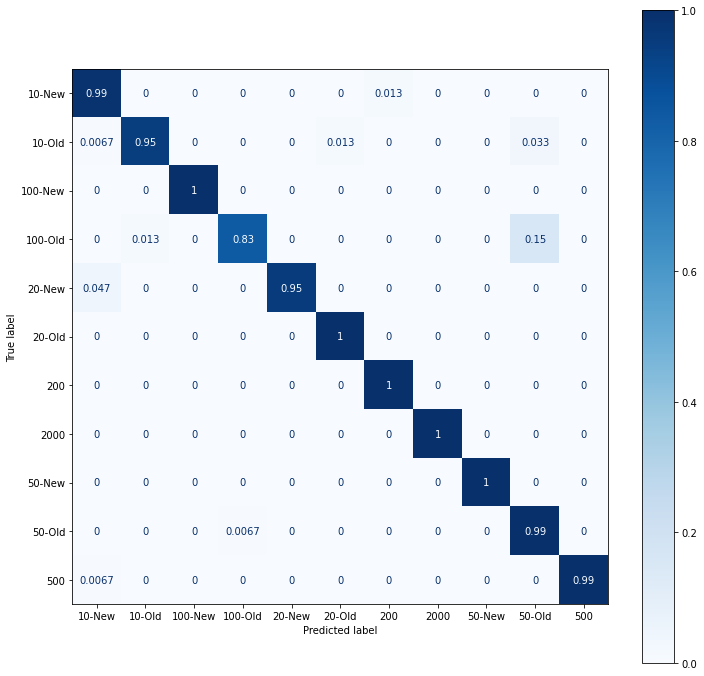

In [ ]:
predictions = model.predict(A,verbose=0)
predictions = np.argmax(predictions, axis=1)

figsize = (12,12)
ConfusionMatrixDisplay.from_predictions(B,predictions,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize=figsize)[1])
print(classification_report(B, predictions))

In [ ]:
del A,B,E,F

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       700
           1       1.00      0.99      0.99       700
           2       1.00      1.00      1.00       700
           3       0.99      1.00      1.00       700
           4       1.00      1.00      1.00       700
           5       1.00      1.00      1.00       700
           6       1.00      1.00      1.00       700
           7       1.00      1.00      1.00       700
           8       1.00      1.00      1.00       700
           9       1.00      1.00      1.00       700
          10       1.00      1.00      1.00       700

    accuracy                           1.00      7700
   macro avg       1.00      1.00      1.00      7700
weighted avg       1.00      1.00      1.00      7700



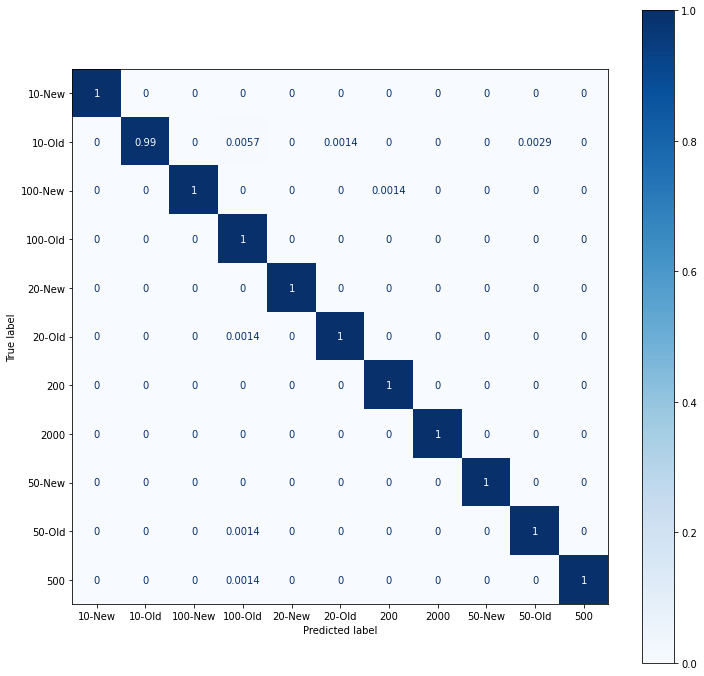

In [ ]:
predictions = model.predict(X,verbose=0)
predictions = np.argmax(predictions, axis=1)

figsize = (12,12)
ConfusionMatrixDisplay.from_predictions(Y,predictions,cmap='Blues',display_labels=label_list, normalize='true', ax=plt.subplots(figsize=figsize)[1])
print(classification_report(Y, predictions))

In [ ]:
visualkeras.layered_view(vgg16, legend=True)

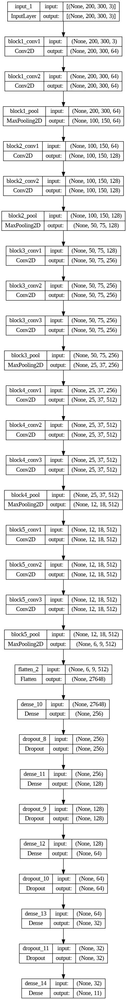

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(vgg16, show_shapes=True, show_layer_names=True)